### LSTM per previsione multistep di serie multivariata

In [97]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
import time
from pandas.plotting import lag_plot
from pandas.plotting import autocorrelation_plot
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error 
from math import sqrt
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
import warnings 
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from keras.layers import RepeatVector
from keras.layers import TimeDistributed

data = pd.read_csv('/Users/alket/Desktop/dati/new_data_backfill_forwfill.csv',index_col = 0)

# preparazione dati per due celle
agg_by_cell = data.groupby(by = ['cell_num'])

# celle adiacenti e correlate tra di loro

cell_1 = agg_by_cell.get_group('491-1264')
cell_2 = agg_by_cell.get_group('490-1264')
cell_3 = agg_by_cell.get_group('492-1264')
cell_4 = agg_by_cell.get_group('491-1263')
cell_5 = agg_by_cell.get_group('491-1265')

cell_6 = agg_by_cell.get_group('490-1263')
cell_7 = agg_by_cell.get_group('490-1265')
cell_8 = agg_by_cell.get_group('492-1265')
cell_9 = agg_by_cell.get_group('492-1263')


#cell_1 = agg_by_cell.get_group('496-1258')
#cell_2 = agg_by_cell.get_group('496-1257')
#cell_3 = agg_by_cell.get_group('496-1259')

#cell_4 = agg_by_cell.get_group('495-1257')
#cell_5 = agg_by_cell.get_group('495-1259')

#cell_6 = agg_by_cell.get_group('495-1258')

#cell_7 = agg_by_cell.get_group('497-1258')
#cell_8 = agg_by_cell.get_group('497-1259')
#cell_9 = agg_by_cell.get_group('497-1257')

# define input sequence
series1 = cell_1['nr_people'].values
series2 = cell_2['nr_people'].values
series3 = cell_3['nr_people'].values

series4 = cell_4['nr_people'].values
series5 = cell_5['nr_people'].values
series6 = cell_6['nr_people'].values

series7 = cell_7['nr_people'].values
series8 = cell_8['nr_people'].values
series9 = cell_9['nr_people'].values

print(type(series2))


<class 'numpy.ndarray'>


In [99]:
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
    
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        # check if we are beyond the dataset
        if out_end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)


#out_seq = np.array([series1[i]+series2[i]+series3[i]+series4[i]+series5[i]+series6[i]+series7[i]+series8[i]+series9[i] for i in range(len(series1))])

# convert to [rows, columns] structure
series1 = series1.reshape((len(series1), 1))
series2 = series2.reshape((len(series2), 1))
series3 = series3.reshape((len(series3), 1))

series4 = series4.reshape((len(series4), 1))
series5 = series5.reshape((len(series5), 1))
series6 = series6.reshape((len(series6), 1))

series7 = series7.reshape((len(series7), 1))
series8 = series8.reshape((len(series8), 1))
series9 = series9.reshape((len(series9), 1))
#out_seq = out_seq.reshape((len(out_seq), 1))

# horizontally stack columns
dataset = hstack((series1, series2, series3, series4, series5, series6, series7, series8, series9))

# choose a number of time steps
n_steps_in, n_steps_out = 10, 10

# covert into input/output
X, y = split_sequences(dataset, n_steps_in, n_steps_out)

for i in range(len(X)):
    print(X[i], y[i]) 

[[25. 28. 24. 30. 25. 42. 23. 25. 26.]
 [25. 28. 24. 31. 25. 42. 23. 25. 27.]
 [24. 28. 24. 29. 25. 41. 23. 25. 26.]
 [24. 27. 23. 28. 24. 40. 22. 25. 25.]
 [24. 27. 23. 27. 24. 39. 22. 24. 24.]
 [24. 26. 23. 26. 24. 38. 22. 24. 24.]
 [24. 26. 23. 26. 25. 37. 22. 25. 23.]
 [23. 25. 22. 25. 24. 35. 22. 24. 23.]
 [23. 25. 22. 25. 24. 34. 22. 24. 22.]
 [22. 25. 22. 24. 24. 33. 21. 24. 22.]] [[22. 24. 21. 23. 23. 31. 21. 23. 21.]
 [21. 23. 21. 22. 23. 30. 20. 23. 21.]
 [21. 23. 21. 22. 23. 30. 20. 23. 21.]
 [20. 22. 20. 21. 22. 28. 19. 22. 20.]
 [20. 21. 20. 20. 21. 27. 19. 22. 20.]
 [19. 20. 20. 20. 21. 26. 19. 22. 20.]
 [19. 20. 19. 20. 20. 25. 18. 21. 19.]
 [19. 20. 20. 20. 20. 25. 18. 21. 20.]
 [19. 20. 20. 20. 20. 25. 18. 21. 20.]
 [19. 20. 20. 21. 20. 24. 18. 21. 20.]]
[[25. 28. 24. 31. 25. 42. 23. 25. 27.]
 [24. 28. 24. 29. 25. 41. 23. 25. 26.]
 [24. 27. 23. 28. 24. 40. 22. 25. 25.]
 [24. 27. 23. 27. 24. 39. 22. 24. 24.]
 [24. 26. 23. 26. 24. 38. 22. 24. 24.]
 [24. 26. 23. 26. 25. 3

 [19. 20. 21. 21. 20. 27. 17. 22. 21.]] [[19. 20. 21. 21. 20. 27. 17. 22. 21.]
 [19. 20. 21. 21. 20. 27. 17. 22. 21.]
 [18. 20. 20. 21. 20. 27. 17. 21. 21.]
 [18. 20. 20. 21. 20. 27. 17. 21. 21.]
 [18. 20. 20. 21. 20. 27. 17. 21. 21.]
 [19. 20. 20. 21. 20. 29. 17. 22. 21.]
 [19. 20. 20. 21. 20. 29. 17. 22. 21.]
 [19. 20. 20. 21. 20. 29. 17. 22. 21.]
 [19. 21. 21. 23. 20. 29. 17. 22. 22.]
 [19. 21. 21. 23. 20. 29. 17. 22. 22.]]
[[19. 20. 20. 19. 20. 28. 18. 22. 20.]
 [19. 20. 20. 19. 20. 28. 18. 22. 20.]
 [19. 20. 20. 19. 20. 28. 18. 22. 20.]
 [19. 20. 20. 19. 20. 28. 18. 22. 20.]
 [19. 20. 21. 21. 20. 27. 17. 22. 21.]
 [19. 20. 21. 21. 20. 27. 17. 22. 21.]
 [19. 20. 21. 21. 20. 27. 17. 22. 21.]
 [19. 20. 21. 21. 20. 27. 17. 22. 21.]
 [19. 20. 21. 21. 20. 27. 17. 22. 21.]
 [19. 20. 21. 21. 20. 27. 17. 22. 21.]] [[19. 20. 21. 21. 20. 27. 17. 22. 21.]
 [18. 20. 20. 21. 20. 27. 17. 21. 21.]
 [18. 20. 20. 21. 20. 27. 17. 21. 21.]
 [18. 20. 20. 21. 20. 27. 17. 21. 21.]
 [19. 20. 20. 21. 20. 

 [20. 21. 22. 22. 21. 27. 19. 23. 22.]] [[21. 22. 23. 24. 21. 28. 19. 23. 24.]
 [21. 22. 22. 25. 21. 29. 19. 23. 24.]
 [21. 22. 22. 25. 21. 29. 19. 23. 24.]
 [21. 22. 22. 25. 21. 29. 19. 23. 24.]
 [21. 23. 23. 26. 22. 30. 20. 24. 25.]
 [21. 23. 23. 26. 22. 30. 20. 24. 25.]
 [22. 22. 23. 26. 22. 29. 20. 24. 25.]
 [22. 22. 23. 26. 22. 27. 19. 24. 25.]
 [22. 22. 24. 26. 22. 27. 19. 24. 25.]
 [22. 21. 24. 26. 21. 26. 19. 24. 25.]]
[[22. 23. 22. 22. 22. 32. 20. 24. 22.]
 [22. 23. 22. 22. 22. 32. 20. 24. 22.]
 [22. 23. 22. 22. 22. 32. 20. 24. 22.]
 [21. 22. 22. 21. 22. 28. 20. 23. 20.]
 [21. 22. 22. 21. 22. 28. 20. 23. 21.]
 [21. 22. 22. 21. 22. 28. 19. 23. 21.]
 [21. 22. 22. 21. 22. 28. 19. 23. 21.]
 [20. 21. 21. 21. 21. 28. 19. 23. 21.]
 [20. 21. 22. 22. 21. 27. 19. 23. 22.]
 [21. 22. 23. 24. 21. 28. 19. 23. 24.]] [[21. 22. 22. 25. 21. 29. 19. 23. 24.]
 [21. 22. 22. 25. 21. 29. 19. 23. 24.]
 [21. 22. 22. 25. 21. 29. 19. 23. 24.]
 [21. 23. 23. 26. 22. 30. 20. 24. 25.]
 [21. 23. 23. 26. 22. 

 [26. 29. 23. 26. 26. 37. 25. 26. 22.]] [[26. 29. 23. 26. 26. 37. 25. 26. 22.]
 [24. 27. 22. 24. 25. 34. 24. 25. 21.]
 [23. 26. 22. 24. 25. 34. 23. 25. 21.]
 [23. 25. 22. 23. 24. 33. 23. 24. 20.]
 [23. 25. 22. 23. 24. 33. 23. 24. 20.]
 [23. 25. 21. 23. 24. 33. 23. 24. 20.]
 [22. 25. 21. 22. 24. 32. 22. 24. 20.]
 [22. 25. 21. 22. 24. 32. 22. 24. 20.]
 [22. 25. 21. 22. 24. 32. 22. 24. 20.]
 [22. 25. 21. 22. 24. 32. 22. 24. 20.]]
[[31. 34. 27. 32. 29. 46. 29. 28. 26.]
 [30. 33. 26. 31. 29. 44. 28. 27. 25.]
 [29. 32. 25. 30. 28. 43. 28. 27. 24.]
 [28. 31. 25. 29. 28. 42. 27. 27. 24.]
 [27. 31. 24. 28. 27. 41. 26. 26. 23.]
 [27. 30. 24. 28. 27. 40. 26. 26. 23.]
 [27. 30. 24. 28. 27. 40. 26. 26. 23.]
 [26. 29. 24. 27. 27. 39. 26. 26. 23.]
 [26. 29. 23. 26. 26. 37. 25. 26. 22.]
 [26. 29. 23. 26. 26. 37. 25. 26. 22.]] [[24. 27. 22. 24. 25. 34. 24. 25. 21.]
 [23. 26. 22. 24. 25. 34. 23. 25. 21.]
 [23. 25. 22. 23. 24. 33. 23. 24. 20.]
 [23. 25. 22. 23. 24. 33. 23. 24. 20.]
 [23. 25. 21. 23. 24. 

 [32. 34. 27. 33. 30. 44. 29. 28. 26.]] [[32. 35. 27. 34. 30. 45. 30. 28. 26.]
 [32. 35. 27. 34. 30. 45. 30. 28. 26.]
 [31. 34. 26. 32. 30. 44. 29. 28. 25.]
 [30. 33. 26. 31. 29. 42. 28. 27. 24.]
 [29. 31. 25. 30. 29. 40. 27. 27. 24.]
 [28. 30. 24. 28. 28. 38. 26. 26. 23.]
 [27. 29. 24. 28. 27. 37. 26. 26. 23.]
 [27. 29. 24. 28. 27. 37. 26. 26. 23.]
 [27. 29. 24. 28. 27. 37. 26. 26. 23.]
 [25. 28. 23. 26. 26. 35. 25. 25. 22.]]
[[34. 37. 29. 36. 32. 48. 31. 30. 28.]
 [34. 37. 28. 36. 32. 48. 31. 29. 27.]
 [34. 37. 28. 36. 32. 48. 31. 29. 27.]
 [33. 36. 27. 35. 32. 47. 31. 29. 26.]
 [33. 36. 28. 35. 31. 46. 31. 29. 27.]
 [32. 35. 27. 34. 31. 45. 30. 29. 26.]
 [32. 35. 27. 34. 31. 45. 30. 29. 26.]
 [32. 35. 26. 33. 30. 44. 30. 28. 25.]
 [32. 34. 27. 33. 30. 44. 29. 28. 26.]
 [32. 35. 27. 34. 30. 45. 30. 28. 26.]] [[32. 35. 27. 34. 30. 45. 30. 28. 26.]
 [31. 34. 26. 32. 30. 44. 29. 28. 25.]
 [30. 33. 26. 31. 29. 42. 28. 27. 24.]
 [29. 31. 25. 30. 29. 40. 27. 27. 24.]
 [28. 30. 24. 28. 28. 

 [36. 41. 30. 40. 29. 61. 29. 28. 31.]]
[[38. 44. 30. 44. 29. 61. 31. 29. 31.]
 [39. 43. 31. 45. 29. 61. 31. 29. 32.]
 [39. 44. 32. 46. 29. 62. 31. 29. 33.]
 [40. 45. 33. 47. 30. 64. 31. 30. 34.]
 [40. 45. 34. 48. 29. 64. 31. 30. 35.]
 [38. 44. 31. 45. 29. 64. 31. 28. 32.]
 [39. 45. 32. 46. 29. 64. 31. 29. 33.]
 [39. 44. 32. 46. 29. 63. 31. 29. 33.]
 [39. 44. 32. 46. 29. 63. 31. 29. 33.]
 [39. 44. 32. 46. 29. 63. 31. 29. 33.]] [[40. 44. 34. 47. 30. 65. 31. 30. 35.]
 [40. 44. 34. 47. 30. 65. 31. 30. 35.]
 [40. 45. 33. 46. 30. 65. 32. 30. 34.]
 [40. 45. 33. 46. 30. 65. 32. 30. 35.]
 [39. 44. 33. 45. 29. 64. 31. 30. 34.]
 [38. 43. 33. 45. 29. 62. 30. 30. 34.]
 [37. 42. 31. 43. 29. 61. 30. 29. 32.]
 [37. 42. 31. 43. 29. 62. 30. 29. 32.]
 [36. 41. 30. 40. 29. 61. 29. 28. 31.]
 [34. 38. 30. 39. 28. 57. 28. 29. 31.]]
[[39. 43. 31. 45. 29. 61. 31. 29. 32.]
 [39. 44. 32. 46. 29. 62. 31. 29. 33.]
 [40. 45. 33. 47. 30. 64. 31. 30. 34.]
 [40. 45. 34. 48. 29. 64. 31. 30. 35.]
 [38. 44. 31. 45. 29. 

 [43. 47. 36. 50. 33. 64. 35. 33. 37.]] [[43. 47. 36. 50. 33. 64. 35. 33. 37.]
 [43. 47. 36. 50. 33. 64. 35. 33. 37.]
 [43. 47. 36. 50. 33. 64. 35. 33. 37.]
 [43. 47. 36. 50. 33. 64. 35. 33. 37.]
 [38. 42. 32. 44. 31. 57. 32. 31. 33.]
 [37. 41. 32. 42. 31. 54. 31. 30. 32.]
 [36. 40. 31. 41. 30. 53. 31. 30. 32.]
 [35. 38. 31. 39. 29. 51. 30. 29. 31.]
 [34. 38. 30. 39. 29. 49. 29. 30. 31.]
 [34. 38. 30. 39. 29. 49. 29. 30. 31.]]
[[39. 42. 32. 46. 29. 55. 32. 29. 34.]
 [39. 42. 32. 46. 29. 55. 32. 29. 34.]
 [41. 45. 32. 47. 30. 60. 33. 29. 34.]
 [41. 45. 32. 47. 30. 60. 33. 29. 34.]
 [41. 45. 35. 48. 31. 61. 33. 31. 36.]
 [43. 46. 35. 50. 32. 62. 34. 32. 37.]
 [42. 47. 34. 49. 32. 63. 34. 31. 36.]
 [43. 47. 36. 50. 33. 64. 34. 32. 37.]
 [43. 47. 36. 50. 33. 64. 35. 33. 37.]
 [43. 47. 36. 50. 33. 64. 35. 33. 37.]] [[43. 47. 36. 50. 33. 64. 35. 33. 37.]
 [43. 47. 36. 50. 33. 64. 35. 33. 37.]
 [43. 47. 36. 50. 33. 64. 35. 33. 37.]
 [38. 42. 32. 44. 31. 57. 32. 31. 33.]
 [37. 41. 32. 42. 31. 

 [38. 43. 30. 43. 31. 59. 33. 29. 30.]]
[[38. 44. 30. 43. 31. 58. 33. 29. 30.]
 [39. 44. 30. 44. 31. 58. 33. 29. 31.]
 [40. 45. 31. 45. 31. 58. 34. 30. 31.]
 [40. 46. 31. 45. 32. 61. 34. 30. 31.]
 [40. 46. 31. 46. 31. 61. 34. 29. 31.]
 [40. 46. 31. 46. 31. 61. 34. 29. 31.]
 [39. 45. 30. 45. 31. 60. 34. 29. 31.]
 [41. 46. 31. 47. 31. 61. 34. 30. 32.]
 [41. 46. 31. 47. 31. 61. 34. 30. 32.]
 [41. 46. 31. 46. 31. 62. 34. 29. 32.]] [[40. 45. 31. 45. 31. 61. 33. 29. 31.]
 [40. 46. 30. 45. 32. 63. 34. 30. 31.]
 [41. 47. 31. 46. 32. 64. 35. 30. 31.]
 [41. 47. 30. 45. 32. 64. 35. 30. 31.]
 [40. 45. 30. 44. 32. 62. 34. 30. 31.]
 [40. 45. 30. 44. 32. 61. 34. 30. 31.]
 [39. 44. 30. 43. 31. 59. 33. 29. 30.]
 [38. 44. 29. 42. 31. 59. 33. 29. 30.]
 [38. 43. 30. 43. 31. 59. 33. 29. 30.]
 [37. 43. 29. 41. 31. 58. 33. 29. 30.]]
[[39. 44. 30. 44. 31. 58. 33. 29. 31.]
 [40. 45. 31. 45. 31. 58. 34. 30. 31.]
 [40. 46. 31. 45. 32. 61. 34. 30. 31.]
 [40. 46. 31. 46. 31. 61. 34. 29. 31.]
 [40. 46. 31. 46. 31. 

 [35. 39. 28. 39. 28. 54. 29. 27. 29.]]
[[31. 32. 28. 36. 25. 42. 24. 26. 28.]
 [31. 32. 28. 37. 25. 42. 24. 26. 29.]
 [30. 32. 26. 34. 24. 42. 24. 25. 27.]
 [30. 32. 27. 35. 24. 42. 24. 25. 27.]
 [30. 31. 27. 34. 24. 41. 24. 25. 27.]
 [30. 32. 26. 34. 25. 44. 24. 25. 26.]
 [30. 33. 25. 34. 25. 45. 25. 25. 26.]
 [31. 35. 26. 36. 25. 48. 26. 25. 26.]
 [32. 36. 26. 35. 26. 49. 27. 26. 26.]
 [33. 37. 26. 37. 27. 51. 27. 26. 26.]] [[33. 37. 26. 37. 27. 51. 27. 26. 26.]
 [34. 39. 26. 38. 28. 55. 29. 27. 26.]
 [35. 40. 27. 38. 28. 56. 29. 27. 27.]
 [36. 40. 28. 40. 28. 57. 30. 28. 28.]
 [36. 40. 29. 41. 29. 56. 30. 28. 29.]
 [35. 39. 28. 39. 28. 54. 29. 27. 29.]
 [35. 39. 28. 39. 28. 54. 29. 27. 29.]
 [35. 39. 28. 39. 28. 54. 29. 27. 29.]
 [35. 39. 28. 39. 28. 54. 29. 27. 29.]
 [36. 41. 29. 42. 29. 58. 30. 28. 30.]]
[[31. 32. 28. 37. 25. 42. 24. 26. 29.]
 [30. 32. 26. 34. 24. 42. 24. 25. 27.]
 [30. 32. 27. 35. 24. 42. 24. 25. 27.]
 [30. 31. 27. 34. 24. 41. 24. 25. 27.]
 [30. 32. 26. 34. 25. 

 [31. 33. 26. 36. 25. 41. 25. 25. 27.]] [[32. 34. 26. 37. 25. 43. 25. 25. 27.]
 [32. 34. 26. 37. 25. 43. 25. 25. 27.]
 [32. 35. 26. 38. 25. 45. 26. 25. 27.]
 [33. 35. 29. 39. 25. 46. 25. 26. 30.]
 [34. 36. 29. 40. 25. 48. 26. 26. 30.]
 [35. 37. 30. 41. 26. 48. 26. 27. 31.]
 [35. 37. 30. 42. 26. 49. 26. 27. 32.]
 [36. 38. 31. 42. 26. 50. 27. 27. 32.]
 [35. 38. 30. 42. 26. 50. 27. 27. 31.]
 [35. 37. 30. 41. 25. 49. 26. 27. 31.]]
[[23. 24. 21. 24. 23. 28. 21. 23. 20.]
 [23. 24. 21. 25. 23. 29. 21. 23. 21.]
 [24. 25. 22. 26. 23. 31. 21. 23. 22.]
 [25. 26. 23. 28. 23. 32. 21. 24. 23.]
 [26. 27. 24. 29. 23. 32. 21. 24. 24.]
 [27. 28. 24. 31. 23. 34. 22. 24. 24.]
 [29. 30. 26. 33. 23. 36. 22. 25. 26.]
 [30. 31. 25. 34. 24. 39. 23. 24. 26.]
 [31. 33. 26. 36. 25. 41. 25. 25. 27.]
 [32. 34. 26. 37. 25. 43. 25. 25. 27.]] [[32. 34. 26. 37. 25. 43. 25. 25. 27.]
 [32. 35. 26. 38. 25. 45. 26. 25. 27.]
 [33. 35. 29. 39. 25. 46. 25. 26. 30.]
 [34. 36. 29. 40. 25. 48. 26. 26. 30.]
 [35. 37. 30. 41. 26. 

 [21. 22. 21. 22. 22. 29. 19. 23. 20.]] [[21. 22. 21. 22. 22. 28. 19. 23. 20.]
 [21. 22. 21. 22. 22. 28. 19. 23. 20.]
 [21. 22. 21. 22. 22. 28. 19. 23. 20.]
 [21. 22. 21. 22. 22. 28. 19. 23. 20.]
 [22. 23. 22. 23. 22. 27. 20. 23. 21.]
 [22. 23. 21. 24. 22. 28. 20. 23. 21.]
 [23. 24. 21. 24. 23. 29. 20. 23. 21.]
 [23. 24. 21. 24. 22. 29. 20. 23. 21.]
 [23. 24. 21. 24. 22. 29. 20. 23. 20.]
 [22. 22. 21. 23. 22. 27. 20. 23. 20.]]
[[23. 25. 22. 24. 24. 33. 21. 24. 21.]
 [23. 24. 22. 24. 24. 32. 21. 24. 21.]
 [23. 24. 22. 23. 24. 31. 21. 24. 21.]
 [22. 23. 21. 23. 23. 30. 20. 23. 20.]
 [22. 23. 21. 23. 23. 30. 20. 23. 20.]
 [22. 23. 21. 22. 23. 29. 20. 23. 20.]
 [21. 22. 21. 22. 22. 29. 20. 23. 20.]
 [21. 22. 21. 22. 22. 29. 20. 23. 20.]
 [21. 22. 21. 22. 22. 29. 19. 23. 20.]
 [21. 22. 21. 22. 22. 28. 19. 23. 20.]] [[21. 22. 21. 22. 22. 28. 19. 23. 20.]
 [21. 22. 21. 22. 22. 28. 19. 23. 20.]
 [21. 22. 21. 22. 22. 28. 19. 23. 20.]
 [22. 23. 22. 23. 22. 27. 20. 23. 21.]
 [22. 23. 21. 24. 22. 

 [21. 22. 20. 21. 23. 25. 21. 23. 19.]] [[21. 22. 20. 21. 23. 25. 21. 23. 19.]
 [21. 22. 20. 21. 23. 25. 21. 23. 19.]
 [21. 22. 20. 22. 23. 26. 21. 23. 19.]
 [22. 23. 21. 23. 23. 27. 21. 23. 20.]
 [24. 25. 22. 25. 23. 29. 22. 24. 21.]
 [24. 26. 21. 25. 23. 30. 22. 23. 20.]
 [24. 26. 22. 26. 23. 30. 23. 24. 21.]
 [24. 26. 22. 26. 23. 30. 22. 24. 21.]
 [24. 25. 22. 26. 23. 29. 22. 24. 21.]
 [24. 25. 22. 26. 23. 29. 22. 24. 21.]]
[[24. 26. 22. 24. 25. 32. 23. 24. 21.]
 [23. 25. 22. 24. 25. 31. 23. 24. 20.]
 [23. 25. 21. 23. 25. 30. 23. 24. 20.]
 [23. 24. 21. 23. 24. 29. 22. 24. 20.]
 [23. 24. 21. 23. 24. 29. 22. 24. 20.]
 [21. 22. 20. 21. 23. 26. 21. 23. 19.]
 [21. 22. 20. 21. 23. 26. 21. 23. 19.]
 [21. 22. 20. 20. 23. 25. 21. 23. 19.]
 [21. 22. 20. 21. 23. 25. 21. 23. 19.]
 [21. 22. 20. 21. 23. 25. 21. 23. 19.]] [[21. 22. 20. 21. 23. 25. 21. 23. 19.]
 [21. 22. 20. 22. 23. 26. 21. 23. 19.]
 [22. 23. 21. 23. 23. 27. 21. 23. 20.]
 [24. 25. 22. 25. 23. 29. 22. 24. 21.]
 [24. 26. 21. 25. 23. 

 [27. 29. 25. 28. 27. 35. 25. 27. 24.]] [[26. 28. 24. 27. 27. 35. 25. 27. 23.]
 [26. 28. 24. 27. 27. 35. 25. 27. 23.]
 [25. 27. 24. 26. 26. 33. 24. 26. 23.]
 [25. 27. 24. 26. 26. 33. 24. 26. 23.]
 [25. 27. 23. 25. 26. 33. 24. 26. 22.]
 [25. 27. 23. 25. 26. 32. 24. 26. 22.]
 [25. 26. 23. 25. 26. 31. 23. 25. 22.]
 [24. 26. 23. 25. 26. 31. 23. 25. 22.]
 [24. 25. 22. 24. 25. 30. 23. 25. 21.]
 [24. 25. 22. 24. 25. 30. 23. 25. 21.]]
[[31. 33. 27. 33. 28. 42. 27. 28. 27.]
 [31. 33. 27. 33. 28. 42. 27. 28. 27.]
 [30. 32. 27. 32. 28. 40. 27. 28. 26.]
 [31. 33. 27. 33. 29. 40. 27. 28. 27.]
 [30. 32. 26. 31. 28. 39. 27. 28. 25.]
 [30. 32. 26. 31. 28. 39. 27. 28. 25.]
 [29. 31. 26. 30. 28. 38. 26. 27. 25.]
 [28. 30. 25. 29. 28. 37. 26. 27. 24.]
 [27. 29. 25. 28. 27. 35. 25. 27. 24.]
 [26. 28. 24. 27. 27. 35. 25. 27. 23.]] [[26. 28. 24. 27. 27. 35. 25. 27. 23.]
 [25. 27. 24. 26. 26. 33. 24. 26. 23.]
 [25. 27. 24. 26. 26. 33. 24. 26. 23.]
 [25. 27. 23. 25. 26. 33. 24. 26. 22.]
 [25. 27. 23. 25. 26. 

 [37. 39. 32. 42. 30. 53. 30. 30. 33.]] [[36. 39. 32. 41. 30. 52. 30. 30. 32.]
 [36. 39. 32. 41. 30. 52. 30. 30. 32.]
 [35. 37. 31. 39. 30. 50. 29. 30. 31.]
 [34. 36. 30. 38. 29. 49. 28. 29. 30.]
 [33. 35. 29. 36. 29. 47. 28. 29. 29.]
 [33. 35. 29. 36. 29. 47. 28. 29. 29.]
 [32. 34. 29. 35. 29. 45. 27. 29. 29.]
 [31. 33. 28. 33. 29. 44. 27. 28. 28.]
 [31. 33. 28. 33. 29. 44. 27. 28. 28.]
 [31. 33. 27. 33. 28. 43. 27. 28. 27.]]
[[40. 43. 34. 47. 30. 58. 31. 30. 35.]
 [40. 43. 34. 47. 31. 58. 32. 30. 35.]
 [40. 43. 34. 46. 30. 58. 31. 30. 35.]
 [40. 42. 34. 46. 30. 57. 31. 30. 35.]
 [40. 42. 34. 46. 30. 57. 31. 30. 36.]
 [40. 42. 34. 46. 30. 57. 31. 30. 36.]
 [38. 40. 34. 44. 30. 54. 30. 30. 35.]
 [38. 40. 33. 43. 30. 54. 30. 30. 34.]
 [37. 39. 32. 42. 30. 53. 30. 30. 33.]
 [36. 39. 32. 41. 30. 52. 30. 30. 32.]] [[36. 39. 32. 41. 30. 52. 30. 30. 32.]
 [35. 37. 31. 39. 30. 50. 29. 30. 31.]
 [34. 36. 30. 38. 29. 49. 28. 29. 30.]
 [33. 35. 29. 36. 29. 47. 28. 29. 29.]
 [33. 35. 29. 36. 29. 

 [42. 46. 35. 50. 32. 60. 33. 31. 36.]]
[[36. 38. 30. 42. 28. 50. 29. 27. 30.]
 [35. 37. 29. 41. 27. 48. 28. 27. 30.]
 [36. 37. 30. 41. 28. 47. 28. 28. 31.]
 [36. 37. 30. 41. 28. 48. 28. 28. 31.]
 [36. 37. 31. 42. 27. 48. 28. 28. 32.]
 [37. 39. 31. 43. 28. 51. 29. 28. 32.]
 [38. 40. 31. 43. 29. 52. 30. 29. 32.]
 [38. 41. 31. 44. 30. 54. 31. 29. 32.]
 [39. 42. 32. 45. 30. 56. 31. 30. 33.]
 [39. 43. 31. 45. 30. 57. 32. 29. 32.]] [[39. 43. 31. 45. 30. 57. 32. 29. 32.]
 [40. 43. 33. 45. 31. 57. 32. 30. 33.]
 [40. 43. 33. 46. 31. 58. 32. 30. 33.]
 [40. 43. 33. 46. 31. 58. 32. 30. 33.]
 [41. 44. 33. 47. 31. 59. 33. 30. 33.]
 [43. 45. 35. 50. 32. 60. 33. 32. 36.]
 [42. 45. 34. 49. 31. 59. 33. 31. 36.]
 [42. 45. 35. 49. 31. 59. 33. 31. 36.]
 [42. 46. 35. 50. 32. 60. 33. 31. 36.]
 [43. 47. 35. 51. 32. 61. 34. 32. 37.]]
[[35. 37. 29. 41. 27. 48. 28. 27. 30.]
 [36. 37. 30. 41. 28. 47. 28. 28. 31.]
 [36. 37. 30. 41. 28. 48. 28. 28. 31.]
 [36. 37. 31. 42. 27. 48. 28. 28. 32.]
 [37. 39. 31. 43. 28. 

 [32. 34. 27. 36. 25. 44. 26. 25. 27.]]
[[25. 26. 23. 27. 23. 30. 22. 23. 22.]
 [27. 29. 23. 30. 24. 35. 24. 24. 23.]
 [28. 29. 24. 31. 25. 36. 24. 24. 24.]
 [28. 29. 25. 32. 25. 35. 24. 25. 25.]
 [28. 29. 25. 32. 25. 35. 24. 25. 25.]
 [28. 29. 25. 32. 25. 35. 24. 24. 25.]
 [30. 31. 26. 34. 25. 37. 26. 25. 26.]
 [30. 31. 26. 35. 25. 38. 25. 25. 26.]
 [31. 31. 27. 36. 25. 38. 25. 25. 27.]
 [30. 31. 26. 35. 25. 39. 25. 25. 27.]] [[30. 31. 26. 34. 25. 39. 25. 25. 26.]
 [31. 32. 27. 35. 25. 41. 25. 25. 28.]
 [30. 32. 26. 35. 25. 41. 25. 25. 27.]
 [31. 32. 27. 36. 25. 42. 25. 25. 28.]
 [31. 33. 26. 36. 25. 42. 25. 25. 27.]
 [31. 33. 26. 36. 25. 43. 25. 25. 27.]
 [31. 33. 26. 36. 24. 44. 25. 25. 27.]
 [32. 34. 27. 36. 25. 44. 26. 25. 27.]
 [32. 34. 27. 36. 25. 44. 26. 25. 27.]
 [33. 35. 28. 38. 26. 47. 27. 26. 29.]]
[[27. 29. 23. 30. 24. 35. 24. 24. 23.]
 [28. 29. 24. 31. 25. 36. 24. 24. 24.]
 [28. 29. 25. 32. 25. 35. 24. 25. 25.]
 [28. 29. 25. 32. 25. 35. 24. 25. 25.]
 [28. 29. 25. 32. 25. 

 [21. 21. 20. 22. 21. 25. 19. 21. 19.]] [[22. 22. 20. 23. 21. 26. 20. 22. 20.]
 [22. 23. 20. 23. 21. 26. 20. 22. 20.]
 [22. 23. 20. 24. 21. 28. 20. 22. 20.]
 [22. 23. 20. 24. 21. 28. 20. 22. 20.]
 [21. 22. 20. 22. 21. 27. 19. 22. 19.]
 [21. 22. 20. 22. 21. 26. 19. 22. 19.]
 [21. 21. 19. 21. 21. 25. 19. 21. 19.]
 [20. 21. 20. 21. 21. 25. 19. 21. 19.]
 [21. 22. 20. 22. 21. 26. 19. 21. 19.]
 [21. 22. 19. 22. 21. 27. 19. 21. 19.]]
[[22. 23. 21. 23. 22. 28. 20. 22. 20.]
 [21. 22. 20. 22. 22. 27. 20. 22. 20.]
 [21. 21. 20. 21. 21. 26. 20. 22. 19.]
 [21. 21. 20. 21. 21. 26. 19. 22. 19.]
 [20. 21. 19. 21. 21. 25. 19. 21. 19.]
 [20. 21. 19. 20. 21. 24. 19. 21. 19.]
 [20. 21. 19. 21. 21. 24. 19. 21. 18.]
 [20. 21. 19. 21. 21. 24. 19. 21. 19.]
 [21. 21. 20. 22. 21. 25. 19. 21. 19.]
 [22. 22. 20. 23. 21. 26. 20. 22. 20.]] [[22. 23. 20. 23. 21. 26. 20. 22. 20.]
 [22. 23. 20. 24. 21. 28. 20. 22. 20.]
 [22. 23. 20. 24. 21. 28. 20. 22. 20.]
 [21. 22. 20. 22. 21. 27. 19. 22. 19.]
 [21. 22. 20. 22. 21. 

 [21. 22. 19. 21. 22. 28. 20. 22. 19.]] [[21. 23. 20. 22. 22. 28. 20. 22. 19.]
 [21. 23. 20. 22. 22. 28. 20. 22. 19.]
 [22. 23. 20. 23. 22. 28. 20. 22. 20.]
 [22. 23. 20. 23. 22. 28. 20. 22. 20.]
 [21. 22. 19. 21. 21. 25. 19. 22. 19.]
 [20. 21. 19. 21. 21. 25. 19. 21. 19.]
 [20. 21. 19. 21. 21. 25. 19. 21. 19.]
 [21. 22. 20. 22. 21. 26. 19. 22. 19.]
 [21. 22. 20. 22. 21. 26. 19. 21. 19.]
 [21. 21. 20. 22. 21. 26. 19. 21. 20.]]
[[21. 22. 20. 21. 22. 28. 20. 22. 19.]
 [21. 22. 20. 21. 22. 28. 20. 22. 19.]
 [20. 22. 19. 21. 22. 28. 19. 22. 19.]
 [20. 21. 19. 20. 22. 27. 19. 22. 18.]
 [20. 21. 19. 20. 22. 27. 19. 22. 18.]
 [20. 21. 19. 20. 22. 26. 19. 21. 18.]
 [20. 21. 19. 20. 21. 26. 19. 21. 18.]
 [20. 22. 19. 21. 21. 27. 19. 21. 18.]
 [21. 22. 19. 21. 22. 28. 20. 22. 19.]
 [21. 23. 20. 22. 22. 28. 20. 22. 19.]] [[21. 23. 20. 22. 22. 28. 20. 22. 19.]
 [22. 23. 20. 23. 22. 28. 20. 22. 20.]
 [22. 23. 20. 23. 22. 28. 20. 22. 20.]
 [21. 22. 19. 21. 21. 25. 19. 22. 19.]
 [20. 21. 19. 21. 21. 

 [21. 22. 20. 21. 22. 28. 20. 22. 19.]] [[20. 22. 20. 21. 22. 28. 20. 22. 19.]
 [20. 22. 20. 21. 22. 27. 20. 22. 19.]
 [20. 21. 19. 20. 21. 27. 20. 22. 18.]
 [19. 21. 19. 20. 21. 26. 20. 22. 18.]
 [19. 21. 19. 19. 21. 26. 19. 21. 18.]
 [19. 21. 19. 20. 21. 25. 19. 21. 18.]
 [19. 20. 19. 19. 21. 25. 19. 22. 18.]
 [19. 20. 19. 19. 21. 25. 19. 21. 18.]
 [20. 21. 19. 20. 21. 25. 19. 22. 19.]
 [20. 21. 20. 21. 21. 25. 20. 22. 19.]]
[[25. 27. 22. 26. 24. 36. 23. 24. 22.]
 [24. 26. 22. 25. 24. 35. 22. 24. 22.]
 [23. 25. 22. 24. 23. 33. 22. 23. 21.]
 [23. 25. 21. 23. 23. 32. 22. 23. 21.]
 [22. 24. 21. 23. 23. 31. 21. 23. 20.]
 [22. 24. 21. 23. 23. 31. 21. 23. 20.]
 [22. 24. 21. 22. 23. 31. 21. 23. 20.]
 [21. 23. 20. 22. 23. 29. 21. 23. 20.]
 [21. 22. 20. 21. 22. 28. 20. 22. 19.]
 [20. 22. 20. 21. 22. 28. 20. 22. 19.]] [[20. 22. 20. 21. 22. 27. 20. 22. 19.]
 [20. 21. 19. 20. 21. 27. 20. 22. 18.]
 [19. 21. 19. 20. 21. 26. 20. 22. 18.]
 [19. 21. 19. 19. 21. 26. 19. 21. 18.]
 [19. 21. 19. 20. 21. 

 [35. 40. 30. 39. 31. 57. 30. 30. 30.]] [[35. 39. 30. 38. 30. 56. 30. 29. 29.]
 [35. 39. 30. 38. 30. 55. 30. 29. 30.]
 [34. 38. 30. 38. 30. 53. 30. 30. 30.]
 [34. 37. 29. 37. 30. 51. 29. 29. 29.]
 [34. 37. 29. 36. 30. 50. 29. 29. 29.]
 [33. 36. 29. 36. 30. 50. 29. 29. 29.]
 [33. 36. 29. 36. 29. 49. 29. 29. 28.]
 [33. 37. 29. 36. 29. 50. 29. 29. 29.]
 [33. 36. 28. 36. 29. 49. 29. 28. 28.]
 [33. 36. 28. 35. 29. 48. 29. 29. 28.]]
[[43. 47. 35. 49. 33. 67. 34. 32. 36.]
 [41. 46. 34. 47. 32. 65. 33. 31. 34.]
 [41. 46. 33. 46. 32. 64. 34. 31. 34.]
 [41. 45. 33. 46. 32. 64. 33. 31. 34.]
 [39. 44. 32. 43. 32. 62. 32. 31. 33.]
 [37. 42. 31. 41. 31. 60. 32. 30. 31.]
 [36. 41. 31. 40. 31. 58. 31. 30. 31.]
 [36. 40. 31. 39. 31. 58. 30. 30. 30.]
 [35. 40. 30. 39. 31. 57. 30. 30. 30.]
 [35. 39. 30. 38. 30. 56. 30. 29. 29.]] [[35. 39. 30. 38. 30. 55. 30. 29. 30.]
 [34. 38. 30. 38. 30. 53. 30. 30. 30.]
 [34. 37. 29. 37. 30. 51. 29. 29. 29.]
 [34. 37. 29. 36. 30. 50. 29. 29. 29.]
 [33. 36. 29. 36. 30. 

 [33. 36. 29. 36. 28. 49. 28. 28. 29.]]
[[39. 42. 32. 45. 30. 55. 31. 30. 33.]
 [40. 43. 33. 46. 30. 56. 31. 30. 34.]
 [40. 42. 33. 46. 30. 56. 31. 30. 34.]
 [40. 43. 33. 47. 30. 57. 31. 30. 34.]
 [39. 43. 32. 45. 30. 58. 31. 29. 33.]
 [40. 42. 33. 46. 30. 57. 31. 30. 34.]
 [40. 42. 33. 46. 30. 57. 31. 30. 34.]
 [40. 42. 33. 46. 30. 57. 31. 30. 34.]
 [40. 43. 34. 45. 31. 59. 31. 31. 35.]
 [39. 43. 34. 46. 30. 59. 31. 31. 35.]] [[39. 42. 33. 44. 30. 58. 30. 31. 34.]
 [39. 42. 33. 44. 30. 58. 30. 31. 34.]
 [38. 41. 32. 43. 30. 57. 30. 30. 33.]
 [38. 41. 32. 43. 30. 57. 30. 30. 33.]
 [36. 40. 31. 41. 29. 55. 30. 30. 32.]
 [35. 38. 31. 39. 29. 53. 29. 29. 31.]
 [34. 37. 31. 38. 29. 51. 28. 29. 31.]
 [33. 37. 29. 36. 29. 50. 28. 29. 29.]
 [33. 36. 29. 36. 28. 49. 28. 28. 29.]
 [32. 36. 28. 35. 28. 49. 28. 28. 28.]]
[[40. 43. 33. 46. 30. 56. 31. 30. 34.]
 [40. 42. 33. 46. 30. 56. 31. 30. 34.]
 [40. 43. 33. 47. 30. 57. 31. 30. 34.]
 [39. 43. 32. 45. 30. 58. 31. 29. 33.]
 [40. 42. 33. 46. 30. 

 [42. 45. 33. 48. 31. 60. 33. 31. 35.]] [[42. 45. 33. 48. 31. 60. 32. 30. 35.]
 [42. 45. 34. 48. 32. 60. 33. 31. 35.]
 [42. 45. 34. 48. 32. 60. 33. 31. 35.]
 [42. 46. 34. 49. 32. 61. 33. 32. 35.]
 [42. 46. 34. 49. 32. 63. 33. 31. 35.]
 [41. 46. 33. 47. 31. 63. 33. 31. 34.]
 [41. 45. 34. 47. 31. 62. 33. 31. 35.]
 [43. 46. 35. 50. 32. 62. 33. 32. 37.]
 [43. 47. 35. 49. 34. 63. 35. 32. 36.]
 [43. 46. 35. 49. 33. 62. 34. 32. 36.]]
[[39. 41. 32. 45. 29. 54. 30. 29. 33.]
 [39. 41. 32. 45. 29. 54. 30. 29. 32.]
 [38. 41. 31. 43. 29. 54. 30. 29. 31.]
 [38. 41. 31. 43. 29. 54. 30. 29. 31.]
 [41. 45. 32. 47. 32. 61. 33. 30. 33.]
 [41. 46. 32. 47. 32. 61. 33. 30. 33.]
 [42. 46. 33. 48. 32. 61. 33. 31. 35.]
 [43. 47. 34. 49. 32. 62. 33. 31. 35.]
 [42. 45. 33. 48. 31. 60. 33. 31. 35.]
 [42. 45. 33. 48. 31. 60. 32. 30. 35.]] [[42. 45. 34. 48. 32. 60. 33. 31. 35.]
 [42. 45. 34. 48. 32. 60. 33. 31. 35.]
 [42. 46. 34. 49. 32. 61. 33. 32. 35.]
 [42. 46. 34. 49. 32. 63. 33. 31. 35.]
 [41. 46. 33. 47. 31. 

 [34. 35. 29. 40. 26. 44. 27. 27. 30.]] [[36. 37. 31. 42. 26. 46. 27. 28. 32.]
 [35. 37. 30. 41. 26. 47. 27. 28. 31.]
 [36. 37. 30. 41. 27. 50. 28. 28. 31.]
 [37. 38. 32. 43. 27. 51. 28. 28. 32.]
 [38. 40. 31. 44. 28. 54. 29. 28. 32.]
 [39. 41. 31. 45. 28. 55. 30. 28. 32.]
 [39. 41. 32. 45. 29. 54. 30. 29. 32.]
 [38. 40. 32. 44. 29. 53. 29. 29. 33.]
 [39. 40. 33. 45. 29. 54. 29. 29. 33.]
 [37. 39. 30. 42. 28. 53. 29. 28. 31.]]
[[27. 27. 25. 29. 25. 31. 24. 26. 25.]
 [28. 28. 27. 31. 26. 32. 24. 27. 27.]
 [29. 29. 27. 31. 26. 33. 24. 27. 27.]
 [30. 29. 29. 34. 26. 34. 24. 28. 29.]
 [30. 29. 29. 34. 26. 34. 24. 28. 30.]
 [32. 31. 31. 37. 27. 36. 25. 29. 31.]
 [33. 33. 30. 38. 27. 38. 26. 28. 31.]
 [34. 34. 30. 39. 26. 40. 26. 27. 31.]
 [34. 35. 29. 40. 26. 44. 27. 27. 30.]
 [36. 37. 31. 42. 26. 46. 27. 28. 32.]] [[35. 37. 30. 41. 26. 47. 27. 28. 31.]
 [36. 37. 30. 41. 27. 50. 28. 28. 31.]
 [37. 38. 32. 43. 27. 51. 28. 28. 32.]
 [38. 40. 31. 44. 28. 54. 29. 28. 32.]
 [39. 41. 31. 45. 28. 

 [24. 26. 22. 24. 25. 34. 23. 25. 21.]]
[[33. 36. 28. 35. 30. 48. 29. 29. 27.]
 [33. 36. 28. 35. 30. 48. 29. 29. 28.]
 [33. 37. 28. 36. 30. 48. 29. 29. 27.]
 [33. 36. 28. 35. 30. 48. 29. 29. 27.]
 [32. 35. 27. 34. 29. 46. 28. 28. 27.]
 [30. 33. 27. 32. 28. 44. 27. 28. 26.]
 [29. 32. 26. 31. 28. 42. 26. 27. 25.]
 [29. 32. 26. 31. 28. 42. 26. 27. 25.]
 [28. 31. 25. 29. 27. 40. 26. 27. 24.]
 [28. 31. 25. 29. 28. 40. 26. 27. 24.]] [[28. 31. 25. 29. 28. 40. 26. 27. 24.]
 [27. 30. 24. 28. 27. 40. 26. 27. 24.]
 [27. 30. 24. 28. 27. 40. 26. 27. 24.]
 [26. 29. 23. 26. 26. 37. 25. 26. 22.]
 [26. 29. 23. 26. 26. 37. 25. 26. 22.]
 [25. 27. 22. 25. 25. 35. 24. 25. 22.]
 [24. 27. 22. 24. 25. 35. 23. 25. 21.]
 [24. 27. 22. 24. 25. 34. 23. 25. 21.]
 [24. 26. 22. 24. 25. 34. 23. 25. 21.]
 [24. 26. 22. 24. 25. 33. 23. 24. 21.]]
[[33. 36. 28. 35. 30. 48. 29. 29. 28.]
 [33. 37. 28. 36. 30. 48. 29. 29. 27.]
 [33. 36. 28. 35. 30. 48. 29. 29. 27.]
 [32. 35. 27. 34. 29. 46. 28. 28. 27.]
 [30. 33. 27. 32. 28. 

 [27. 30. 25. 28. 27. 40. 26. 27. 24.]] [[27. 30. 24. 28. 27. 39. 25. 27. 23.]
 [27. 30. 25. 28. 27. 39. 26. 27. 23.]
 [27. 30. 24. 27. 27. 38. 26. 27. 23.]
 [26. 29. 24. 27. 27. 37. 25. 27. 23.]
 [26. 28. 24. 26. 27. 36. 25. 27. 23.]
 [26. 28. 24. 26. 27. 36. 25. 27. 23.]
 [25. 27. 24. 25. 26. 33. 24. 26. 22.]
 [24. 26. 23. 24. 25. 32. 23. 25. 22.]
 [23. 25. 22. 24. 25. 31. 23. 25. 21.]
 [23. 25. 22. 24. 25. 31. 23. 25. 21.]]
[[29. 33. 27. 31. 27. 44. 26. 28. 26.]
 [29. 33. 27. 31. 27. 44. 26. 28. 26.]
 [29. 32. 26. 31. 27. 44. 26. 28. 25.]
 [31. 34. 28. 33. 29. 45. 28. 29. 27.]
 [32. 36. 28. 35. 29. 47. 29. 29. 27.]
 [31. 34. 27. 33. 28. 46. 28. 28. 26.]
 [29. 32. 26. 30. 28. 43. 26. 28. 25.]
 [27. 30. 25. 28. 27. 41. 25. 27. 24.]
 [27. 30. 25. 28. 27. 40. 26. 27. 24.]
 [27. 30. 24. 28. 27. 39. 25. 27. 23.]] [[27. 30. 25. 28. 27. 39. 26. 27. 23.]
 [27. 30. 24. 27. 27. 38. 26. 27. 23.]
 [26. 29. 24. 27. 27. 37. 25. 27. 23.]
 [26. 28. 24. 26. 27. 36. 25. 27. 23.]
 [26. 28. 24. 26. 27. 

 [25. 27. 24. 25. 25. 37. 23. 26. 22.]]
[[32. 34. 29. 34. 29. 47. 27. 29. 28.]
 [32. 34. 29. 34. 29. 47. 27. 29. 28.]
 [31. 34. 28. 33. 29. 46. 27. 29. 28.]
 [31. 33. 28. 33. 28. 46. 27. 28. 27.]
 [31. 33. 28. 33. 28. 46. 27. 28. 27.]
 [29. 32. 27. 32. 27. 43. 26. 28. 27.]
 [30. 32. 27. 32. 28. 44. 26. 28. 27.]
 [31. 33. 28. 33. 28. 45. 26. 28. 27.]
 [32. 35. 28. 35. 29. 47. 28. 29. 28.]
 [32. 34. 28. 34. 29. 47. 27. 29. 28.]] [[30. 33. 27. 32. 28. 45. 26. 28. 26.]
 [29. 31. 26. 30. 27. 42. 25. 27. 25.]
 [28. 30. 26. 29. 27. 41. 24. 27. 25.]
 [27. 30. 25. 29. 27. 41. 25. 27. 24.]
 [26. 29. 25. 27. 26. 39. 24. 26. 24.]
 [26. 28. 24. 27. 26. 39. 24. 26. 23.]
 [25. 28. 24. 26. 26. 37. 23. 26. 23.]
 [25. 27. 24. 25. 25. 37. 23. 26. 22.]
 [25. 27. 24. 25. 25. 37. 23. 26. 22.]
 [25. 27. 24. 25. 25. 37. 23. 26. 22.]]
[[32. 34. 29. 34. 29. 47. 27. 29. 28.]
 [31. 34. 28. 33. 29. 46. 27. 29. 28.]
 [31. 33. 28. 33. 28. 46. 27. 28. 27.]
 [31. 33. 28. 33. 28. 46. 27. 28. 27.]
 [29. 32. 27. 32. 27. 

 [35. 40. 30. 39. 30. 55. 31. 29. 30.]] [[35. 39. 30. 39. 30. 54. 31. 30. 30.]
 [35. 38. 29. 38. 30. 53. 30. 29. 29.]
 [34. 38. 29. 37. 30. 52. 30. 29. 29.]
 [34. 38. 28. 36. 30. 52. 30. 29. 28.]
 [33. 37. 28. 35. 30. 51. 29. 29. 28.]
 [32. 36. 27. 35. 29. 49. 29. 28. 27.]
 [32. 36. 28. 35. 29. 48. 29. 28. 27.]
 [32. 36. 27. 34. 29. 48. 29. 28. 27.]
 [32. 36. 27. 34. 29. 48. 29. 28. 27.]
 [33. 36. 28. 35. 29. 49. 29. 28. 27.]]
[[43. 47. 36. 49. 33. 65. 34. 33. 37.]
 [42. 45. 35. 48. 32. 63. 33. 32. 36.]
 [40. 44. 33. 45. 32. 61. 33. 31. 34.]
 [39. 43. 33. 45. 31. 61. 32. 31. 34.]
 [39. 44. 31. 43. 31. 60. 33. 30. 32.]
 [38. 42. 32. 43. 31. 59. 32. 30. 32.]
 [37. 41. 31. 41. 30. 57. 31. 30. 31.]
 [37. 41. 31. 41. 30. 57. 31. 30. 31.]
 [35. 40. 30. 39. 30. 55. 31. 29. 30.]
 [35. 39. 30. 39. 30. 54. 31. 30. 30.]] [[35. 38. 29. 38. 30. 53. 30. 29. 29.]
 [34. 38. 29. 37. 30. 52. 30. 29. 29.]
 [34. 38. 28. 36. 30. 52. 30. 29. 28.]
 [33. 37. 28. 35. 30. 51. 29. 29. 28.]
 [32. 36. 27. 35. 29. 

 [40. 44. 32. 44. 33. 60. 33. 31. 32.]]
[[42. 47. 33. 48. 32. 64. 34. 30. 34.]
 [42. 46. 33. 48. 32. 64. 33. 31. 34.]
 [42. 45. 34. 48. 32. 63. 33. 31. 35.]
 [42. 45. 34. 48. 33. 63. 33. 32. 35.]
 [42. 45. 34. 48. 33. 63. 33. 32. 35.]
 [42. 45. 34. 48. 33. 63. 33. 32. 35.]
 [42. 46. 35. 49. 32. 64. 33. 32. 36.]
 [44. 48. 35. 50. 33. 66. 34. 32. 36.]
 [44. 48. 35. 50. 33. 66. 34. 32. 36.]
 [44. 48. 35. 50. 34. 66. 35. 32. 36.]] [[43. 47. 35. 49. 33. 66. 34. 32. 36.]
 [42. 47. 34. 48. 33. 65. 34. 32. 35.]
 [42. 47. 34. 48. 34. 64. 34. 33. 35.]
 [42. 46. 34. 48. 33. 63. 34. 32. 35.]
 [42. 46. 34. 47. 33. 62. 34. 32. 34.]
 [40. 45. 33. 46. 33. 62. 34. 31. 33.]
 [40. 45. 32. 45. 32. 61. 33. 31. 32.]
 [40. 44. 32. 44. 33. 60. 33. 31. 32.]
 [40. 44. 32. 44. 33. 60. 33. 31. 32.]
 [39. 44. 32. 44. 32. 60. 33. 31. 32.]]
[[42. 46. 33. 48. 32. 64. 33. 31. 34.]
 [42. 45. 34. 48. 32. 63. 33. 31. 35.]
 [42. 45. 34. 48. 33. 63. 33. 32. 35.]
 [42. 45. 34. 48. 33. 63. 33. 32. 35.]
 [42. 45. 34. 48. 33. 

 [35. 35. 31. 40. 27. 47. 26. 28. 32.]] [[35. 36. 30. 40. 27. 48. 26. 28. 31.]
 [35. 36. 30. 40. 27. 48. 27. 28. 31.]
 [35. 36. 31. 40. 28. 49. 27. 28. 31.]
 [36. 37. 30. 40. 29. 51. 28. 28. 30.]
 [36. 37. 30. 40. 29. 51. 28. 28. 30.]
 [36. 38. 31. 41. 29. 52. 28. 29. 31.]
 [38. 40. 33. 43. 29. 55. 28. 30. 33.]
 [38. 40. 33. 43. 29. 55. 28. 30. 33.]
 [39. 41. 33. 45. 30. 58. 30. 30. 34.]
 [40. 43. 33. 46. 31. 60. 31. 30. 34.]]
[[37. 38. 32. 44. 27. 51. 27. 28. 33.]
 [36. 38. 31. 42. 27. 52. 27. 28. 32.]
 [36. 38. 31. 42. 27. 52. 27. 28. 32.]
 [36. 36. 32. 42. 27. 49. 26. 28. 33.]
 [36. 36. 32. 43. 27. 49. 26. 28. 33.]
 [36. 35. 32. 42. 27. 48. 26. 28. 33.]
 [35. 35. 31. 40. 27. 47. 26. 27. 32.]
 [35. 35. 31. 40. 27. 47. 26. 28. 31.]
 [35. 35. 31. 40. 27. 47. 26. 28. 32.]
 [35. 36. 30. 40. 27. 48. 26. 28. 31.]] [[35. 36. 30. 40. 27. 48. 27. 28. 31.]
 [35. 36. 31. 40. 28. 49. 27. 28. 31.]
 [36. 37. 30. 40. 29. 51. 28. 28. 30.]
 [36. 37. 30. 40. 29. 51. 28. 28. 30.]
 [36. 38. 31. 41. 29. 

 [24. 24. 23. 24. 24. 30. 21. 25. 22.]] [[24. 24. 23. 25. 24. 29. 21. 24. 23.]
 [25. 24. 25. 27. 24. 29. 21. 25. 24.]
 [26. 25. 27. 29. 24. 30. 21. 27. 27.]
 [27. 25. 28. 30. 25. 31. 22. 27. 28.]
 [27. 25. 28. 30. 25. 31. 22. 27. 28.]
 [29. 25. 31. 34. 24. 30. 21. 27. 31.]
 [29. 25. 31. 34. 24. 30. 21. 27. 32.]
 [30. 26. 33. 36. 24. 31. 21. 28. 34.]
 [30. 27. 32. 36. 24. 33. 22. 28. 33.]
 [31. 28. 32. 36. 25. 34. 22. 27. 33.]]
[[24. 25. 23. 24. 24. 30. 22. 25. 22.]
 [24. 25. 23. 24. 24. 30. 22. 25. 22.]
 [24. 24. 24. 25. 24. 30. 22. 25. 23.]
 [24. 24. 24. 25. 24. 29. 22. 25. 23.]
 [24. 24. 24. 25. 24. 30. 22. 25. 23.]
 [24. 25. 23. 25. 24. 31. 22. 25. 22.]
 [24. 25. 23. 25. 24. 31. 22. 25. 23.]
 [24. 24. 23. 24. 24. 30. 21. 25. 22.]
 [24. 24. 23. 24. 24. 30. 21. 25. 22.]
 [24. 24. 23. 25. 24. 29. 21. 24. 23.]] [[25. 24. 25. 27. 24. 29. 21. 25. 24.]
 [26. 25. 27. 29. 24. 30. 21. 27. 27.]
 [27. 25. 28. 30. 25. 31. 22. 27. 28.]
 [27. 25. 28. 30. 25. 31. 22. 27. 28.]
 [29. 25. 31. 34. 24. 

[[33. 35. 29. 36. 29. 46. 28. 29. 30.]
 [33. 35. 29. 36. 29. 46. 28. 29. 30.]
 [32. 34. 28. 35. 29. 45. 28. 28. 28.]
 [32. 34. 27. 34. 29. 45. 28. 28. 27.]
 [32. 34. 27. 34. 29. 45. 28. 28. 27.]
 [32. 35. 28. 35. 29. 46. 29. 28. 27.]
 [33. 37. 28. 36. 30. 48. 30. 28. 27.]
 [35. 38. 28. 37. 31. 49. 31. 29. 28.]
 [35. 38. 29. 38. 31. 49. 31. 29. 28.]
 [33. 37. 28. 36. 30. 47. 30. 28. 27.]] [[31. 34. 26. 33. 29. 44. 28. 28. 26.]
 [29. 32. 26. 31. 28. 40. 27. 27. 25.]
 [29. 31. 25. 30. 28. 40. 27. 27. 25.]
 [29. 31. 25. 30. 28. 40. 27. 27. 25.]
 [29. 31. 25. 30. 28. 40. 27. 27. 25.]
 [28. 30. 24. 29. 28. 37. 26. 26. 24.]
 [28. 30. 24. 29. 28. 37. 26. 26. 24.]
 [28. 30. 24. 29. 28. 37. 26. 26. 24.]
 [27. 29. 23. 27. 28. 36. 26. 26. 23.]
 [27. 29. 23. 27. 27. 35. 26. 26. 23.]]
[[33. 35. 29. 36. 29. 46. 28. 29. 30.]
 [32. 34. 28. 35. 29. 45. 28. 28. 28.]
 [32. 34. 27. 34. 29. 45. 28. 28. 27.]
 [32. 34. 27. 34. 29. 45. 28. 28. 27.]
 [32. 35. 28. 35. 29. 46. 29. 28. 27.]
 [33. 37. 28. 36. 30. 4

 [37. 39. 34. 43. 30. 50. 30. 31. 35.]] [[37. 39. 34. 43. 30. 50. 30. 31. 35.]
 [34. 37. 31. 39. 29. 48. 29. 29. 31.]
 [34. 36. 31. 39. 29. 47. 28. 29. 31.]
 [34. 36. 31. 39. 29. 47. 28. 29. 31.]
 [34. 36. 30. 38. 28. 47. 29. 28. 30.]
 [33. 35. 29. 37. 29. 46. 28. 28. 30.]
 [33. 35. 29. 37. 28. 46. 28. 28. 29.]
 [33. 35. 29. 37. 28. 46. 28. 28. 29.]
 [33. 35. 30. 38. 28. 46. 28. 28. 30.]
 [34. 35. 30. 38. 28. 46. 28. 28. 30.]]
[[43. 45. 38. 51. 32. 62. 33. 33. 40.]
 [44. 45. 38. 52. 33. 62. 34. 33. 41.]
 [44. 45. 38. 52. 33. 62. 34. 33. 41.]
 [43. 44. 40. 52. 32. 59. 33. 33. 42.]
 [42. 43. 38. 50. 32. 57. 33. 33. 40.]
 [42. 42. 38. 49. 32. 56. 32. 33. 39.]
 [40. 41. 36. 47. 31. 54. 32. 32. 37.]
 [38. 39. 34. 45. 30. 52. 30. 31. 36.]
 [37. 39. 34. 43. 30. 50. 30. 31. 35.]
 [37. 39. 34. 43. 30. 50. 30. 31. 35.]] [[34. 37. 31. 39. 29. 48. 29. 29. 31.]
 [34. 36. 31. 39. 29. 47. 28. 29. 31.]
 [34. 36. 31. 39. 29. 47. 28. 29. 31.]
 [34. 36. 30. 38. 28. 47. 29. 28. 30.]
 [33. 35. 29. 37. 29. 

 [30. 33. 26. 33. 27. 46. 27. 26. 26.]]
[[36. 39. 30. 41. 27. 56. 29. 27. 31.]
 [36. 40. 31. 42. 28. 57. 29. 28. 32.]
 [36. 40. 31. 42. 28. 57. 29. 28. 32.]
 [36. 39. 30. 40. 28. 55. 29. 28. 31.]
 [36. 39. 30. 40. 28. 55. 29. 28. 31.]
 [35. 37. 30. 40. 27. 53. 28. 28. 31.]
 [35. 37. 30. 39. 28. 53. 28. 28. 31.]
 [35. 37. 30. 40. 28. 52. 28. 28. 31.]
 [35. 37. 32. 40. 28. 52. 28. 29. 33.]
 [35. 37. 32. 40. 28. 52. 28. 29. 33.]] [[35. 37. 32. 40. 28. 52. 28. 29. 33.]
 [33. 34. 30. 37. 27. 49. 26. 27. 30.]
 [32. 34. 28. 35. 27. 48. 26. 27. 29.]
 [32. 35. 28. 35. 27. 49. 27. 27. 29.]
 [31. 34. 27. 34. 27. 48. 27. 27. 28.]
 [31. 34. 27. 34. 27. 48. 27. 27. 27.]
 [31. 34. 27. 34. 27. 48. 27. 27. 27.]
 [31. 34. 27. 34. 28. 47. 27. 27. 27.]
 [30. 33. 26. 33. 27. 46. 27. 26. 26.]
 [30. 33. 27. 33. 27. 46. 26. 27. 26.]]
[[36. 40. 31. 42. 28. 57. 29. 28. 32.]
 [36. 40. 31. 42. 28. 57. 29. 28. 32.]
 [36. 39. 30. 40. 28. 55. 29. 28. 31.]
 [36. 39. 30. 40. 28. 55. 29. 28. 31.]
 [35. 37. 30. 40. 27. 

 [32. 35. 28. 35. 29. 46. 28. 28. 28.]]
[[38. 42. 32. 45. 30. 57. 31. 29. 34.]
 [39. 42. 33. 45. 30. 59. 31. 29. 34.]
 [39. 43. 33. 46. 30. 59. 32. 30. 34.]
 [39. 43. 33. 46. 30. 58. 32. 29. 34.]
 [39. 43. 33. 46. 30. 58. 32. 29. 34.]
 [39. 42. 32. 45. 30. 58. 31. 29. 34.]
 [38. 41. 32. 44. 30. 56. 31. 29. 33.]
 [38. 40. 33. 44. 29. 55. 30. 29. 34.]
 [37. 40. 32. 43. 30. 53. 31. 29. 33.]
 [37. 39. 33. 43. 29. 53. 30. 29. 34.]] [[36. 38. 31. 41. 29. 52. 29. 28. 32.]
 [36. 39. 31. 40. 29. 52. 30. 29. 31.]
 [34. 37. 30. 39. 29. 50. 29. 28. 31.]
 [33. 36. 30. 37. 28. 49. 28. 28. 30.]
 [33. 35. 29. 37. 28. 48. 28. 28. 30.]
 [33. 36. 29. 37. 29. 49. 29. 28. 29.]
 [34. 36. 30. 37. 29. 48. 29. 29. 30.]
 [33. 35. 29. 36. 29. 47. 28. 28. 29.]
 [32. 35. 28. 35. 29. 46. 28. 28. 28.]
 [32. 35. 28. 35. 29. 46. 28. 28. 28.]]
[[39. 42. 33. 45. 30. 59. 31. 29. 34.]
 [39. 43. 33. 46. 30. 59. 32. 30. 34.]
 [39. 43. 33. 46. 30. 58. 32. 29. 34.]
 [39. 43. 33. 46. 30. 58. 32. 29. 34.]
 [39. 42. 32. 45. 30. 

 [38. 42. 32. 42. 31. 58. 31. 30. 32.]]
[[39. 41. 32. 45. 30. 56. 31. 29. 34.]
 [40. 42. 34. 47. 30. 57. 31. 30. 35.]
 [40. 43. 34. 47. 30. 59. 32. 30. 35.]
 [40. 43. 33. 46. 30. 60. 31. 30. 34.]
 [40. 43. 33. 47. 30. 60. 31. 30. 35.]
 [40. 44. 33. 46. 31. 61. 32. 30. 34.]
 [40. 44. 33. 46. 31. 61. 32. 30. 34.]
 [41. 45. 33. 47. 32. 63. 33. 31. 34.]
 [41. 45. 33. 47. 32. 63. 33. 31. 34.]
 [42. 47. 33. 48. 32. 66. 33. 30. 35.]] [[42. 47. 35. 49. 32. 65. 33. 31. 36.]
 [43. 46. 36. 50. 32. 63. 33. 32. 37.]
 [41. 45. 34. 47. 31. 63. 33. 31. 35.]
 [41. 45. 35. 48. 32. 63. 33. 31. 36.]
 [41. 45. 34. 47. 32. 63. 32. 31. 35.]
 [41. 45. 34. 47. 32. 63. 33. 31. 35.]
 [39. 43. 33. 44. 32. 61. 32. 31. 33.]
 [38. 42. 32. 43. 31. 59. 32. 30. 33.]
 [38. 42. 32. 42. 31. 58. 31. 30. 32.]
 [37. 41. 32. 42. 31. 57. 31. 30. 32.]]
[[40. 42. 34. 47. 30. 57. 31. 30. 35.]
 [40. 43. 34. 47. 30. 59. 32. 30. 35.]
 [40. 43. 33. 46. 30. 60. 31. 30. 34.]
 [40. 43. 33. 47. 30. 60. 31. 30. 35.]
 [40. 44. 33. 46. 31. 

 [33. 34. 29. 38. 26. 44. 26. 26. 29.]] [[34. 34. 31. 40. 26. 45. 26. 27. 31.]
 [35. 35. 31. 41. 26. 46. 26. 28. 32.]
 [35. 35. 31. 41. 26. 46. 26. 27. 32.]
 [35. 35. 33. 42. 26. 46. 26. 28. 34.]
 [35. 34. 32. 41. 25. 45. 25. 27. 33.]
 [34. 35. 31. 40. 26. 46. 26. 27. 32.]
 [34. 35. 31. 40. 26. 46. 26. 27. 32.]
 [35. 35. 31. 41. 26. 47. 26. 27. 32.]
 [36. 37. 32. 42. 27. 49. 27. 28. 33.]
 [37. 39. 32. 43. 28. 52. 28. 28. 33.]]
[[31. 31. 28. 35. 25. 37. 25. 26. 28.]
 [31. 31. 28. 35. 25. 37. 25. 26. 28.]
 [31. 31. 28. 36. 24. 38. 24. 25. 28.]
 [32. 32. 29. 37. 25. 40. 25. 26. 29.]
 [32. 33. 29. 37. 25. 42. 25. 26. 29.]
 [33. 34. 28. 38. 26. 45. 26. 26. 29.]
 [33. 34. 29. 38. 26. 44. 26. 26. 29.]
 [33. 34. 29. 38. 26. 44. 26. 26. 29.]
 [33. 34. 29. 38. 26. 44. 26. 26. 29.]
 [34. 34. 31. 40. 26. 45. 26. 27. 31.]] [[35. 35. 31. 41. 26. 46. 26. 28. 32.]
 [35. 35. 31. 41. 26. 46. 26. 27. 32.]
 [35. 35. 33. 42. 26. 46. 26. 28. 34.]
 [35. 34. 32. 41. 25. 45. 25. 27. 33.]
 [34. 35. 31. 40. 26. 

 [29. 28. 27. 33. 25. 33. 24. 26. 28.]]
[[23. 25. 22. 23. 24. 31. 22. 24. 21.]
 [23. 24. 22. 23. 24. 30. 22. 24. 21.]
 [22. 24. 22. 23. 24. 29. 22. 24. 20.]
 [22. 23. 21. 22. 24. 29. 21. 24. 20.]
 [22. 24. 21. 23. 24. 29. 21. 24. 20.]
 [23. 24. 21. 23. 24. 29. 22. 24. 20.]
 [23. 25. 21. 24. 23. 30. 22. 23. 20.]
 [24. 26. 22. 26. 24. 31. 22. 24. 21.]
 [24. 26. 22. 26. 24. 31. 22. 24. 21.]
 [26. 28. 22. 28. 24. 33. 23. 24. 22.]] [[25. 27. 22. 27. 24. 32. 23. 24. 22.]
 [24. 25. 22. 25. 23. 31. 22. 24. 21.]
 [24. 25. 22. 25. 23. 31. 22. 24. 21.]
 [24. 25. 22. 25. 23. 31. 22. 24. 21.]
 [24. 24. 23. 26. 24. 29. 22. 24. 23.]
 [25. 25. 24. 27. 24. 29. 22. 25. 24.]
 [25. 25. 24. 27. 24. 29. 22. 25. 24.]
 [28. 27. 26. 31. 25. 32. 23. 25. 26.]
 [29. 28. 27. 33. 25. 33. 24. 26. 28.]
 [29. 28. 27. 32. 25. 33. 23. 26. 28.]]
[[23. 24. 22. 23. 24. 30. 22. 24. 21.]
 [22. 24. 22. 23. 24. 29. 22. 24. 20.]
 [22. 23. 21. 22. 24. 29. 21. 24. 20.]
 [22. 24. 21. 23. 24. 29. 21. 24. 20.]
 [23. 24. 21. 23. 24. 

 [26. 28. 24. 26. 26. 36. 24. 25. 23.]]
[[32. 34. 29. 35. 28. 47. 27. 28. 29.]
 [32. 35. 29. 35. 28. 48. 28. 28. 29.]
 [32. 35. 28. 34. 28. 47. 28. 28. 28.]
 [31. 34. 28. 34. 27. 45. 27. 27. 27.]
 [31. 34. 28. 34. 27. 45. 27. 27. 27.]
 [31. 34. 28. 34. 28. 45. 27. 27. 28.]
 [30. 33. 27. 33. 28. 45. 27. 27. 27.]
 [30. 33. 27. 33. 27. 45. 26. 27. 27.]
 [30. 33. 27. 33. 27. 44. 26. 27. 27.]
 [30. 33. 27. 33. 27. 45. 26. 27. 27.]] [[30. 33. 26. 32. 27. 44. 27. 27. 25.]
 [30. 33. 26. 32. 27. 44. 26. 27. 26.]
 [30. 33. 26. 33. 28. 44. 27. 27. 26.]
 [30. 33. 26. 32. 27. 44. 26. 27. 25.]
 [28. 30. 25. 29. 27. 40. 25. 26. 25.]
 [27. 29. 24. 28. 26. 39. 25. 26. 24.]
 [26. 29. 24. 27. 26. 38. 24. 26. 23.]
 [26. 28. 24. 27. 26. 37. 24. 26. 23.]
 [26. 28. 24. 26. 26. 36. 24. 25. 23.]
 [25. 27. 23. 26. 26. 35. 24. 25. 23.]]
[[32. 35. 29. 35. 28. 48. 28. 28. 29.]
 [32. 35. 28. 34. 28. 47. 28. 28. 28.]
 [31. 34. 28. 34. 27. 45. 27. 27. 27.]
 [31. 34. 28. 34. 27. 45. 27. 27. 27.]
 [31. 34. 28. 34. 28. 

 [32. 36. 28. 36. 28. 50. 28. 28. 28.]] [[32. 35. 28. 36. 28. 49. 28. 27. 29.]
 [31. 34. 28. 34. 27. 47. 27. 28. 28.]
 [31. 35. 28. 34. 27. 47. 27. 27. 28.]
 [30. 34. 27. 33. 27. 45. 27. 27. 27.]
 [30. 34. 27. 33. 27. 46. 27. 27. 27.]
 [30. 34. 27. 33. 27. 45. 27. 27. 27.]
 [31. 34. 28. 35. 28. 46. 27. 28. 28.]
 [32. 34. 28. 35. 28. 46. 27. 28. 28.]
 [32. 34. 28. 35. 27. 46. 27. 28. 28.]
 [31. 35. 27. 35. 28. 47. 28. 27. 27.]]
[[40. 43. 35. 47. 31. 62. 31. 31. 36.]
 [39. 42. 34. 45. 30. 60. 31. 30. 35.]
 [37. 41. 32. 43. 29. 59. 30. 29. 33.]
 [36. 41. 31. 41. 30. 58. 30. 29. 32.]
 [36. 40. 31. 41. 30. 56. 30. 29. 32.]
 [35. 39. 30. 39. 29. 55. 29. 29. 30.]
 [34. 38. 30. 38. 29. 54. 29. 29. 30.]
 [33. 37. 29. 37. 28. 52. 28. 28. 29.]
 [32. 36. 28. 36. 28. 50. 28. 28. 28.]
 [32. 35. 28. 36. 28. 49. 28. 27. 29.]] [[31. 34. 28. 34. 27. 47. 27. 28. 28.]
 [31. 35. 28. 34. 27. 47. 27. 27. 28.]
 [30. 34. 27. 33. 27. 45. 27. 27. 27.]
 [30. 34. 27. 33. 27. 46. 27. 27. 27.]
 [30. 34. 27. 33. 27. 

 [42. 45. 36. 50. 31. 63. 32. 32. 38.]] [[44. 46. 36. 52. 32. 63. 34. 32. 38.]
 [42. 45. 35. 49. 32. 63. 33. 31. 36.]
 [42. 45. 34. 48. 32. 63. 33. 31. 36.]
 [41. 45. 34. 47. 32. 63. 33. 31. 35.]
 [41. 44. 33. 47. 32. 61. 33. 30. 34.]
 [40. 44. 32. 45. 32. 60. 32. 30. 33.]
 [40. 43. 33. 45. 32. 58. 32. 31. 34.]
 [40. 43. 34. 46. 31. 58. 32. 31. 35.]
 [40. 41. 34. 46. 31. 56. 31. 31. 35.]
 [39. 40. 34. 45. 31. 55. 31. 31. 35.]]
[[41. 42. 35. 47. 31. 56. 31. 31. 36.]
 [42. 43. 36. 49. 31. 58. 31. 32. 38.]
 [42. 44. 36. 49. 32. 59. 32. 31. 37.]
 [43. 45. 36. 51. 32. 60. 33. 32. 38.]
 [44. 45. 37. 51. 32. 62. 33. 32. 39.]
 [44. 45. 37. 51. 32. 62. 33. 32. 39.]
 [42. 45. 36. 50. 32. 62. 33. 32. 37.]
 [42. 45. 36. 50. 31. 63. 32. 32. 38.]
 [42. 45. 36. 50. 31. 63. 32. 32. 38.]
 [44. 46. 36. 52. 32. 63. 34. 32. 38.]] [[42. 45. 35. 49. 32. 63. 33. 31. 36.]
 [42. 45. 34. 48. 32. 63. 33. 31. 36.]
 [41. 45. 34. 47. 32. 63. 33. 31. 35.]
 [41. 44. 33. 47. 32. 61. 33. 30. 34.]
 [40. 44. 32. 45. 32. 

 [36. 40. 29. 40. 28. 57. 29. 28. 29.]] [[36. 41. 30. 41. 29. 58. 29. 29. 30.]
 [36. 41. 30. 41. 29. 58. 29. 29. 30.]
 [38. 42. 31. 43. 30. 58. 30. 29. 31.]
 [37. 41. 31. 43. 29. 58. 30. 29. 32.]
 [38. 41. 33. 44. 29. 57. 29. 29. 34.]
 [37. 41. 31. 43. 28. 57. 29. 28. 32.]
 [37. 41. 32. 44. 29. 58. 29. 29. 33.]
 [37. 41. 32. 44. 29. 58. 29. 29. 33.]
 [39. 43. 31. 44. 30. 60. 31. 29. 32.]
 [39. 43. 32. 45. 30. 60. 31. 29. 33.]]
[[31. 32. 27. 36. 24. 41. 24. 25. 28.]
 [31. 32. 27. 36. 24. 41. 24. 25. 28.]
 [31. 32. 27. 35. 25. 42. 24. 26. 28.]
 [32. 33. 28. 37. 25. 43. 25. 26. 29.]
 [33. 34. 29. 38. 26. 45. 25. 27. 29.]
 [33. 34. 29. 38. 26. 45. 25. 27. 29.]
 [36. 39. 30. 41. 28. 54. 28. 28. 30.]
 [35. 40. 29. 41. 28. 58. 28. 27. 30.]
 [36. 40. 29. 40. 28. 57. 29. 28. 29.]
 [36. 41. 30. 41. 29. 58. 29. 29. 30.]] [[36. 41. 30. 41. 29. 58. 29. 29. 30.]
 [38. 42. 31. 43. 30. 58. 30. 29. 31.]
 [37. 41. 31. 43. 29. 58. 30. 29. 32.]
 [38. 41. 33. 44. 29. 57. 29. 29. 34.]
 [37. 41. 31. 43. 28. 

 [30. 31. 27. 34. 25. 42. 24. 26. 27.]] [[30. 31. 28. 35. 25. 42. 24. 26. 29.]
 [30. 31. 28. 35. 25. 42. 24. 26. 28.]
 [30. 31. 28. 35. 25. 42. 24. 26. 28.]
 [31. 33. 28. 36. 26. 44. 25. 26. 28.]
 [32. 33. 28. 36. 26. 46. 25. 26. 29.]
 [33. 35. 29. 38. 27. 48. 26. 27. 29.]
 [33. 36. 29. 38. 27. 49. 26. 27. 29.]
 [33. 36. 29. 38. 27. 50. 26. 27. 29.]
 [34. 36. 29. 39. 28. 51. 27. 27. 29.]
 [34. 37. 29. 39. 28. 52. 27. 27. 29.]]
[[29. 30. 27. 33. 24. 39. 23. 25. 27.]
 [29. 31. 27. 34. 24. 41. 23. 26. 27.]
 [29. 31. 27. 34. 24. 41. 23. 26. 27.]
 [29. 31. 27. 34. 24. 41. 23. 26. 27.]
 [30. 30. 27. 34. 25. 39. 24. 25. 28.]
 [29. 30. 27. 34. 24. 39. 23. 25. 27.]
 [29. 30. 26. 33. 25. 39. 23. 25. 27.]
 [30. 31. 27. 34. 25. 41. 24. 26. 27.]
 [30. 31. 27. 34. 25. 42. 24. 26. 27.]
 [30. 31. 28. 35. 25. 42. 24. 26. 29.]] [[30. 31. 28. 35. 25. 42. 24. 26. 28.]
 [30. 31. 28. 35. 25. 42. 24. 26. 28.]
 [31. 33. 28. 36. 26. 44. 25. 26. 28.]
 [32. 33. 28. 36. 26. 46. 25. 26. 29.]
 [33. 35. 29. 38. 27. 

 [33. 34. 29. 38. 26. 42. 26. 27. 30.]] [[33. 34. 29. 38. 26. 42. 26. 27. 30.]
 [34. 35. 30. 40. 26. 46. 26. 27. 31.]
 [35. 36. 29. 41. 26. 47. 26. 26. 31.]
 [35. 36. 29. 41. 25. 48. 26. 26. 31.]
 [35. 37. 29. 41. 26. 50. 27. 26. 30.]
 [35. 38. 28. 40. 26. 52. 27. 26. 29.]
 [35. 38. 28. 40. 26. 52. 27. 26. 29.]
 [37. 40. 30. 43. 28. 53. 29. 27. 30.]
 [37. 40. 30. 43. 28. 53. 29. 27. 30.]
 [37. 39. 29. 42. 27. 53. 28. 27. 30.]]
[[25. 26. 24. 27. 25. 31. 22. 25. 23.]
 [27. 27. 25. 29. 25. 32. 23. 25. 25.]
 [28. 28. 26. 31. 25. 33. 23. 25. 26.]
 [29. 28. 27. 33. 25. 33. 24. 26. 27.]
 [31. 29. 29. 35. 25. 34. 24. 27. 29.]
 [31. 31. 29. 36. 26. 36. 25. 27. 29.]
 [32. 32. 29. 37. 26. 38. 25. 27. 30.]
 [33. 33. 29. 38. 26. 40. 26. 27. 29.]
 [33. 34. 29. 38. 26. 42. 26. 27. 30.]
 [33. 34. 29. 38. 26. 42. 26. 27. 30.]] [[34. 35. 30. 40. 26. 46. 26. 27. 31.]
 [35. 36. 29. 41. 26. 47. 26. 26. 31.]
 [35. 36. 29. 41. 25. 48. 26. 26. 31.]
 [35. 37. 29. 41. 26. 50. 27. 26. 30.]
 [35. 38. 28. 40. 26. 

 [27. 26. 26. 31. 23. 32. 21. 25. 27.]]
[[21. 23. 20. 21. 23. 28. 20. 23. 19.]
 [21. 23. 20. 21. 23. 28. 20. 23. 19.]
 [21. 23. 20. 21. 22. 28. 20. 23. 19.]
 [22. 23. 21. 22. 22. 29. 20. 23. 20.]
 [22. 24. 21. 23. 22. 29. 21. 23. 20.]
 [23. 25. 21. 24. 23. 31. 21. 23. 20.]
 [23. 25. 21. 24. 23. 31. 22. 23. 20.]
 [23. 25. 20. 23. 23. 31. 21. 23. 19.]
 [23. 25. 21. 24. 23. 30. 21. 23. 20.]
 [22. 24. 21. 23. 23. 29. 21. 23. 20.]] [[22. 23. 21. 23. 22. 27. 20. 23. 20.]
 [22. 23. 22. 23. 22. 26. 20. 23. 21.]
 [24. 24. 24. 26. 23. 27. 21. 25. 24.]
 [24. 23. 24. 26. 22. 27. 20. 24. 23.]
 [24. 24. 24. 26. 22. 28. 20. 24. 24.]
 [25. 25. 25. 28. 23. 29. 21. 24. 25.]
 [27. 26. 27. 31. 23. 30. 21. 26. 27.]
 [27. 26. 26. 31. 23. 32. 21. 25. 27.]
 [27. 26. 26. 31. 23. 32. 21. 25. 27.]
 [31. 30. 28. 35. 24. 36. 23. 26. 29.]]
[[21. 23. 20. 21. 23. 28. 20. 23. 19.]
 [21. 23. 20. 21. 22. 28. 20. 23. 19.]
 [22. 23. 21. 22. 22. 29. 20. 23. 20.]
 [22. 24. 21. 23. 22. 29. 21. 23. 20.]
 [23. 25. 21. 24. 23. 

 [23. 24. 23. 24. 25. 29. 22. 25. 22.]]
[[33. 35. 29. 36. 30. 46. 29. 29. 29.]
 [33. 35. 29. 36. 30. 46. 29. 29. 29.]
 [34. 36. 30. 37. 30. 47. 29. 30. 30.]
 [34. 36. 30. 37. 30. 46. 29. 30. 30.]
 [32. 34. 29. 35. 29. 44. 28. 29. 29.]
 [32. 34. 29. 35. 29. 44. 28. 29. 29.]
 [30. 32. 28. 32. 29. 41. 27. 28. 27.]
 [29. 31. 27. 31. 28. 39. 26. 28. 27.]
 [28. 30. 27. 30. 28. 38. 25. 28. 26.]
 [28. 29. 26. 29. 28. 37. 25. 27. 25.]] [[27. 29. 25. 28. 27. 36. 25. 27. 25.]
 [27. 29. 25. 28. 27. 36. 25. 27. 25.]
 [27. 29. 25. 28. 27. 36. 25. 27. 25.]
 [26. 27. 25. 27. 27. 33. 24. 27. 24.]
 [26. 27. 25. 27. 27. 33. 24. 27. 24.]
 [26. 27. 25. 27. 27. 33. 24. 27. 24.]
 [26. 27. 25. 27. 27. 33. 24. 27. 24.]
 [26. 27. 25. 27. 27. 33. 24. 27. 24.]
 [23. 24. 23. 24. 25. 29. 22. 25. 22.]
 [23. 24. 23. 24. 25. 29. 22. 25. 22.]]
[[33. 35. 29. 36. 30. 46. 29. 29. 29.]
 [34. 36. 30. 37. 30. 47. 29. 30. 30.]
 [34. 36. 30. 37. 30. 46. 29. 30. 30.]
 [32. 34. 29. 35. 29. 44. 28. 29. 29.]
 [32. 34. 29. 35. 29. 

 [28. 29. 26. 30. 27. 36. 25. 27. 26.]]
[[34. 35. 31. 38. 30. 48. 28. 29. 31.]
 [34. 35. 31. 38. 30. 48. 28. 29. 31.]
 [34. 35. 31. 38. 30. 48. 28. 29. 31.]
 [33. 34. 30. 36. 29. 45. 27. 29. 29.]
 [33. 34. 29. 35. 29. 45. 28. 29. 29.]
 [33. 34. 30. 35. 29. 44. 27. 29. 29.]
 [32. 33. 29. 35. 29. 43. 27. 29. 29.]
 [32. 33. 29. 35. 29. 43. 27. 28. 29.]
 [32. 33. 29. 35. 29. 43. 27. 29. 29.]
 [32. 33. 28. 34. 29. 43. 27. 28. 28.]] [[31. 32. 28. 34. 29. 42. 26. 28. 28.]
 [31. 32. 28. 34. 29. 42. 26. 28. 28.]
 [31. 32. 28. 34. 29. 42. 26. 28. 28.]
 [30. 31. 28. 33. 28. 40. 26. 28. 28.]
 [30. 31. 28. 33. 28. 40. 26. 28. 28.]
 [30. 31. 28. 33. 28. 40. 26. 28. 28.]
 [30. 31. 28. 33. 28. 40. 26. 28. 28.]
 [28. 29. 26. 30. 27. 36. 25. 27. 26.]
 [28. 29. 26. 30. 27. 36. 25. 27. 26.]
 [27. 28. 25. 27. 27. 34. 24. 26. 24.]]
[[34. 35. 31. 38. 30. 48. 28. 29. 31.]
 [34. 35. 31. 38. 30. 48. 28. 29. 31.]
 [33. 34. 30. 36. 29. 45. 27. 29. 29.]
 [33. 34. 29. 35. 29. 45. 28. 29. 29.]
 [33. 34. 30. 35. 29. 

 [32. 34. 27. 33. 30. 40. 30. 29. 27.]]
[[38. 40. 33. 41. 32. 47. 34. 32. 34.]
 [38. 40. 33. 41. 32. 47. 34. 32. 34.]
 [38. 40. 33. 41. 32. 47. 34. 32. 34.]
 [35. 39. 30. 38. 31. 46. 33. 30. 30.]
 [35. 39. 30. 37. 31. 46. 33. 30. 30.]
 [35. 39. 30. 38. 32. 46. 33. 30. 30.]
 [35. 39. 30. 38. 32. 46. 33. 30. 30.]
 [35. 39. 30. 38. 32. 46. 33. 30. 30.]
 [33. 35. 29. 35. 31. 40. 31. 29. 29.]
 [32. 34. 27. 33. 30. 39. 30. 29. 27.]] [[32. 34. 27. 33. 30. 39. 30. 29. 27.]
 [32. 34. 27. 33. 30. 39. 30. 29. 27.]
 [32. 34. 27. 33. 30. 39. 30. 29. 27.]
 [29. 31. 25. 30. 28. 35. 28. 27. 25.]
 [30. 32. 27. 31. 29. 36. 28. 28. 26.]
 [31. 33. 27. 32. 29. 38. 29. 29. 27.]
 [31. 33. 27. 32. 29. 38. 29. 29. 27.]
 [31. 33. 27. 32. 29. 39. 29. 28. 26.]
 [32. 34. 27. 33. 30. 40. 30. 29. 27.]
 [32. 34. 27. 33. 30. 40. 30. 29. 27.]]
[[38. 40. 33. 41. 32. 47. 34. 32. 34.]
 [38. 40. 33. 41. 32. 47. 34. 32. 34.]
 [35. 39. 30. 38. 31. 46. 33. 30. 30.]
 [35. 39. 30. 37. 31. 46. 33. 30. 30.]
 [35. 39. 30. 38. 32. 

 [36. 40. 32. 40. 30. 57. 30. 31. 33.]]
[[33. 35. 29. 37. 28. 47. 27. 28. 30.]
 [34. 35. 30. 38. 27. 46. 28. 28. 31.]
 [34. 35. 30. 38. 27. 46. 28. 28. 31.]
 [34. 35. 30. 38. 27. 46. 28. 28. 31.]
 [35. 37. 31. 39. 28. 48. 29. 29. 32.]
 [35. 37. 31. 39. 28. 49. 28. 28. 32.]
 [35. 37. 31. 39. 28. 48. 28. 29. 32.]
 [36. 37. 32. 40. 29. 49. 29. 30. 33.]
 [36. 38. 32. 40. 29. 50. 30. 30. 33.]
 [36. 38. 32. 40. 29. 50. 30. 30. 33.]] [[36. 38. 32. 40. 29. 50. 30. 30. 33.]
 [36. 38. 32. 40. 29. 50. 30. 30. 33.]
 [38. 40. 33. 42. 30. 56. 30. 31. 34.]
 [37. 40. 33. 42. 29. 55. 30. 30. 34.]
 [37. 40. 33. 42. 29. 55. 30. 30. 34.]
 [37. 39. 32. 41. 29. 55. 29. 30. 33.]
 [37. 39. 32. 41. 29. 55. 29. 30. 33.]
 [37. 39. 32. 41. 29. 55. 29. 30. 33.]
 [36. 40. 32. 40. 30. 57. 30. 31. 33.]
 [38. 41. 33. 42. 31. 58. 31. 31. 34.]]
[[34. 35. 30. 38. 27. 46. 28. 28. 31.]
 [34. 35. 30. 38. 27. 46. 28. 28. 31.]
 [34. 35. 30. 38. 27. 46. 28. 28. 31.]
 [35. 37. 31. 39. 28. 48. 29. 29. 32.]
 [35. 37. 31. 39. 28. 

 [30. 32. 28. 33. 24. 49. 23. 26. 29.]] [[30. 32. 28. 33. 24. 49. 23. 26. 29.]
 [30. 32. 28. 33. 24. 49. 23. 26. 29.]
 [30. 32. 28. 33. 24. 49. 23. 26. 29.]
 [32. 35. 29. 36. 27. 53. 26. 27. 30.]
 [32. 35. 30. 36. 27. 53. 26. 28. 30.]
 [32. 35. 30. 36. 26. 53. 26. 28. 31.]
 [32. 35. 30. 36. 26. 53. 26. 28. 31.]
 [32. 36. 29. 36. 27. 55. 26. 28. 29.]
 [32. 36. 29. 36. 27. 55. 26. 28. 29.]
 [32. 36. 29. 36. 27. 55. 26. 28. 29.]]
[[27. 27. 27. 30. 23. 37. 22. 25. 27.]
 [28. 30. 28. 32. 24. 42. 22. 27. 29.]
 [28. 30. 27. 31. 24. 44. 23. 26. 28.]
 [29. 31. 28. 33. 24. 46. 23. 26. 29.]
 [30. 32. 28. 33. 24. 49. 23. 26. 29.]
 [30. 32. 28. 33. 24. 49. 23. 26. 29.]
 [30. 32. 28. 33. 24. 49. 23. 26. 29.]
 [30. 32. 28. 33. 24. 49. 23. 26. 29.]
 [30. 32. 28. 33. 24. 49. 23. 26. 29.]
 [30. 32. 28. 33. 24. 49. 23. 26. 29.]] [[30. 32. 28. 33. 24. 49. 23. 26. 29.]
 [30. 32. 28. 33. 24. 49. 23. 26. 29.]
 [32. 35. 29. 36. 27. 53. 26. 27. 30.]
 [32. 35. 30. 36. 27. 53. 26. 28. 30.]
 [32. 35. 30. 36. 26. 

 [27. 30. 24. 29. 23. 40. 23. 24. 23.]] [[26. 28. 23. 27. 23. 38. 22. 24. 23.]
 [26. 28. 23. 27. 23. 38. 22. 24. 23.]
 [26. 28. 23. 27. 23. 38. 22. 24. 23.]
 [25. 27. 23. 27. 22. 36. 21. 23. 23.]
 [25. 26. 24. 27. 22. 36. 21. 23. 24.]
 [25. 27. 23. 27. 22. 37. 21. 23. 23.]
 [25. 27. 23. 27. 22. 37. 21. 23. 23.]
 [25. 27. 23. 27. 22. 39. 21. 23. 23.]
 [25. 27. 23. 27. 22. 39. 21. 23. 23.]
 [25. 27. 23. 27. 22. 39. 21. 23. 23.]]
[[25. 26. 23. 26. 22. 34. 22. 23. 23.]
 [25. 27. 23. 26. 22. 35. 22. 23. 22.]
 [25. 26. 23. 26. 22. 34. 22. 23. 22.]
 [25. 27. 23. 27. 22. 35. 22. 24. 23.]
 [27. 29. 24. 29. 23. 37. 23. 24. 24.]
 [28. 30. 24. 30. 24. 38. 24. 25. 24.]
 [27. 30. 24. 29. 23. 39. 24. 24. 23.]
 [27. 30. 24. 29. 23. 39. 23. 24. 23.]
 [27. 30. 24. 29. 23. 40. 23. 24. 23.]
 [26. 28. 23. 27. 23. 38. 22. 24. 23.]] [[26. 28. 23. 27. 23. 38. 22. 24. 23.]
 [26. 28. 23. 27. 23. 38. 22. 24. 23.]
 [25. 27. 23. 27. 22. 36. 21. 23. 23.]
 [25. 26. 24. 27. 22. 36. 21. 23. 24.]
 [25. 27. 23. 27. 22. 

 [27. 27. 28. 31. 23. 33. 22. 26. 28.]]
[[20. 22. 19. 20. 22. 26. 21. 21. 18.]
 [20. 22. 19. 20. 22. 26. 20. 21. 18.]
 [20. 22. 19. 20. 22. 26. 20. 21. 18.]
 [20. 22. 19. 20. 22. 26. 20. 21. 18.]
 [21. 22. 20. 22. 22. 27. 20. 22. 20.]
 [21. 22. 20. 21. 22. 28. 20. 22. 20.]
 [21. 23. 20. 22. 22. 28. 20. 22. 20.]
 [21. 23. 20. 22. 22. 28. 21. 22. 20.]
 [22. 23. 21. 23. 22. 27. 21. 23. 21.]
 [22. 23. 22. 24. 22. 26. 21. 23. 21.]] [[23. 23. 22. 24. 22. 26. 21. 23. 22.]
 [23. 23. 23. 25. 23. 26. 21. 24. 23.]
 [24. 24. 24. 26. 23. 27. 21. 24. 24.]
 [25. 24. 24. 26. 23. 29. 21. 25. 24.]
 [25. 24. 26. 27. 23. 28. 21. 25. 26.]
 [25. 24. 25. 27. 23. 28. 21. 25. 25.]
 [26. 24. 26. 28. 23. 29. 21. 25. 26.]
 [26. 26. 27. 29. 23. 32. 21. 26. 27.]
 [27. 27. 28. 31. 23. 33. 22. 26. 28.]
 [28. 27. 28. 31. 23. 34. 22. 26. 29.]]
[[20. 22. 19. 20. 22. 26. 20. 21. 18.]
 [20. 22. 19. 20. 22. 26. 20. 21. 18.]
 [20. 22. 19. 20. 22. 26. 20. 21. 18.]
 [21. 22. 20. 22. 22. 27. 20. 22. 20.]
 [21. 22. 20. 21. 22. 

 [21. 23. 20. 21. 23. 28. 21. 23. 19.]]
[[27. 30. 25. 28. 26. 40. 25. 26. 23.]
 [27. 30. 25. 28. 26. 40. 25. 26. 23.]
 [26. 28. 24. 26. 26. 37. 24. 26. 23.]
 [25. 27. 23. 25. 26. 36. 24. 25. 22.]
 [25. 27. 22. 25. 25. 36. 24. 25. 21.]
 [24. 27. 22. 24. 25. 35. 23. 25. 21.]
 [24. 26. 22. 24. 25. 34. 23. 25. 21.]
 [23. 26. 21. 23. 25. 33. 23. 24. 20.]
 [23. 25. 21. 23. 24. 32. 23. 24. 20.]
 [23. 25. 21. 23. 24. 32. 23. 24. 20.]] [[23. 25. 21. 23. 24. 31. 22. 24. 20.]
 [22. 24. 21. 22. 24. 31. 22. 24. 20.]
 [22. 23. 20. 22. 23. 29. 21. 23. 19.]
 [22. 23. 20. 22. 23. 29. 21. 23. 19.]
 [21. 23. 20. 21. 23. 28. 21. 23. 19.]
 [21. 22. 20. 21. 23. 28. 21. 23. 19.]
 [21. 23. 20. 21. 23. 28. 21. 23. 19.]
 [21. 23. 20. 21. 23. 28. 21. 23. 19.]
 [21. 23. 20. 21. 23. 28. 21. 23. 19.]
 [22. 24. 21. 22. 23. 29. 21. 24. 20.]]
[[27. 30. 25. 28. 26. 40. 25. 26. 23.]
 [26. 28. 24. 26. 26. 37. 24. 26. 23.]
 [25. 27. 23. 25. 26. 36. 24. 25. 22.]
 [25. 27. 22. 25. 25. 36. 24. 25. 21.]
 [24. 27. 22. 24. 25. 

 [23. 25. 22. 24. 24. 32. 22. 25. 21.]]
[[31. 33. 28. 32. 28. 44. 27. 29. 28.]
 [31. 33. 29. 32. 28. 45. 26. 29. 28.]
 [31. 33. 29. 33. 28. 45. 27. 29. 28.]
 [31. 33. 29. 33. 28. 45. 27. 29. 28.]
 [32. 34. 29. 34. 29. 45. 27. 29. 29.]
 [31. 33. 29. 33. 29. 44. 27. 29. 28.]
 [31. 32. 29. 33. 28. 43. 26. 29. 28.]
 [29. 31. 27. 31. 27. 41. 26. 28. 27.]
 [28. 30. 26. 29. 27. 39. 25. 27. 26.]
 [27. 29. 25. 28. 26. 38. 24. 27. 25.]] [[27. 29. 25. 28. 26. 38. 24. 27. 25.]
 [26. 28. 25. 27. 26. 37. 24. 26. 24.]
 [26. 27. 24. 27. 26. 36. 24. 26. 23.]
 [25. 27. 24. 26. 26. 36. 24. 26. 23.]
 [25. 27. 24. 26. 25. 35. 23. 25. 23.]
 [25. 27. 24. 26. 25. 35. 23. 25. 23.]
 [25. 27. 24. 26. 25. 35. 23. 25. 23.]
 [24. 25. 22. 24. 25. 32. 22. 25. 22.]
 [23. 25. 22. 24. 24. 32. 22. 25. 21.]
 [23. 25. 22. 24. 24. 32. 22. 25. 21.]]
[[31. 33. 29. 32. 28. 45. 26. 29. 28.]
 [31. 33. 29. 33. 28. 45. 27. 29. 28.]
 [31. 33. 29. 33. 28. 45. 27. 29. 28.]
 [32. 34. 29. 34. 29. 45. 27. 29. 29.]
 [31. 33. 29. 33. 29. 

 [30. 32. 27. 32. 27. 43. 26. 27. 26.]]
[[39. 42. 34. 43. 31. 61. 31. 31. 35.]
 [38. 41. 34. 42. 31. 60. 30. 32. 35.]
 [37. 39. 34. 41. 30. 57. 29. 31. 35.]
 [37. 39. 34. 42. 30. 56. 30. 31. 35.]
 [37. 39. 32. 41. 30. 57. 30. 30. 34.]
 [36. 39. 32. 40. 29. 56. 29. 30. 33.]
 [36. 39. 33. 40. 30. 56. 30. 31. 34.]
 [35. 38. 31. 38. 29. 54. 29. 30. 31.]
 [33. 37. 30. 36. 29. 52. 29. 29. 30.]
 [32. 35. 29. 34. 28. 50. 27. 28. 29.]] [[32. 35. 29. 34. 28. 49. 27. 29. 29.]
 [31. 34. 28. 33. 28. 47. 27. 28. 28.]
 [31. 34. 28. 33. 27. 46. 27. 28. 28.]
 [31. 34. 28. 33. 27. 46. 27. 28. 28.]
 [30. 32. 27. 31. 27. 45. 26. 27. 27.]
 [29. 32. 27. 32. 26. 43. 26. 27. 27.]
 [30. 32. 28. 32. 27. 43. 26. 28. 27.]
 [30. 32. 27. 32. 27. 43. 26. 27. 27.]
 [30. 32. 27. 32. 27. 43. 26. 27. 26.]
 [29. 31. 26. 31. 27. 42. 26. 27. 26.]]
[[38. 41. 34. 42. 31. 60. 30. 32. 35.]
 [37. 39. 34. 41. 30. 57. 29. 31. 35.]
 [37. 39. 34. 42. 30. 56. 30. 31. 35.]
 [37. 39. 32. 41. 30. 57. 30. 30. 34.]
 [36. 39. 32. 40. 29. 

 [36. 42. 29. 38. 33. 61. 32. 31. 30.]] [[36. 42. 29. 38. 33. 61. 32. 31. 30.]
 [34. 42. 25. 34. 32. 61. 32. 28. 26.]
 [35. 41. 27. 36. 31. 60. 30. 29. 28.]
 [36. 41. 30. 39. 31. 59. 31. 29. 31.]
 [36. 41. 30. 39. 31. 58. 31. 30. 31.]
 [36. 40. 31. 39. 30. 57. 31. 30. 32.]
 [35. 39. 30. 38. 30. 55. 30. 29. 31.]
 [35. 38. 30. 38. 29. 54. 29. 29. 31.]
 [33. 37. 28. 36. 29. 51. 29. 28. 29.]
 [33. 37. 28. 35. 30. 50. 29. 29. 29.]]
[[34. 40. 26. 35. 32. 58. 31. 29. 27.]
 [37. 42. 30. 39. 32. 60. 31. 31. 31.]
 [37. 42. 30. 39. 32. 60. 31. 31. 31.]
 [37. 42. 30. 39. 32. 61. 31. 30. 31.]
 [35. 42. 28. 37. 32. 61. 32. 29. 28.]
 [35. 42. 28. 37. 32. 61. 32. 29. 28.]
 [36. 41. 29. 38. 32. 59. 32. 30. 30.]
 [38. 43. 32. 41. 33. 61. 32. 32. 33.]
 [36. 42. 29. 38. 33. 61. 32. 31. 30.]
 [36. 42. 29. 38. 33. 61. 32. 31. 30.]] [[34. 42. 25. 34. 32. 61. 32. 28. 26.]
 [35. 41. 27. 36. 31. 60. 30. 29. 28.]
 [36. 41. 30. 39. 31. 59. 31. 29. 31.]
 [36. 41. 30. 39. 31. 58. 31. 30. 31.]
 [36. 40. 31. 39. 30. 

 [32. 35. 28. 35. 26. 50. 26. 27. 28.]] [[31. 34. 26. 33. 25. 50. 26. 26. 26.]
 [32. 36. 27. 34. 27. 52. 27. 27. 27.]
 [33. 37. 27. 35. 27. 54. 28. 27. 27.]
 [33. 37. 28. 35. 26. 53. 27. 27. 28.]
 [33. 36. 28. 36. 26. 53. 27. 27. 28.]
 [32. 36. 27. 35. 26. 53. 27. 27. 27.]
 [32. 37. 27. 34. 26. 54. 27. 27. 27.]
 [32. 37. 27. 34. 26. 54. 27. 27. 27.]
 [32. 37. 27. 34. 26. 54. 27. 27. 27.]
 [32. 37. 27. 34. 26. 54. 27. 27. 27.]]
[[31. 34. 26. 33. 25. 49. 25. 26. 27.]
 [30. 34. 26. 33. 25. 48. 25. 26. 26.]
 [30. 33. 26. 32. 25. 48. 25. 26. 26.]
 [31. 35. 26. 34. 25. 50. 26. 26. 26.]
 [31. 35. 27. 34. 26. 50. 26. 26. 27.]
 [31. 34. 27. 34. 26. 49. 26. 27. 28.]
 [31. 34. 28. 34. 26. 49. 26. 28. 28.]
 [32. 35. 28. 35. 26. 50. 26. 27. 28.]
 [32. 35. 28. 35. 26. 50. 26. 27. 28.]
 [31. 34. 26. 33. 25. 50. 26. 26. 26.]] [[32. 36. 27. 34. 27. 52. 27. 27. 27.]
 [33. 37. 27. 35. 27. 54. 28. 27. 27.]
 [33. 37. 28. 35. 26. 53. 27. 27. 28.]
 [33. 36. 28. 36. 26. 53. 27. 27. 28.]
 [32. 36. 27. 35. 26. 

 [28. 30. 26. 31. 23. 45. 22. 25. 26.]]
[[23. 24. 23. 25. 19. 33. 18. 22. 23.]
 [23. 24. 23. 25. 20. 34. 18. 23. 23.]
 [23. 24. 24. 25. 20. 35. 18. 23. 23.]
 [23. 24. 24. 25. 19. 35. 18. 23. 24.]
 [24. 25. 24. 26. 20. 36. 19. 23. 23.]
 [25. 26. 24. 27. 21. 38. 19. 23. 24.]
 [25. 27. 24. 28. 21. 40. 20. 23. 24.]
 [26. 28. 25. 29. 22. 42. 21. 23. 25.]
 [27. 29. 26. 30. 22. 43. 21. 24. 26.]
 [27. 29. 26. 30. 22. 43. 21. 24. 26.]] [[26. 28. 26. 29. 22. 43. 21. 25. 26.]
 [26. 28. 25. 29. 22. 42. 21. 24. 25.]
 [26. 28. 25. 29. 22. 42. 21. 24. 25.]
 [28. 29. 26. 30. 23. 43. 22. 25. 26.]
 [28. 30. 26. 30. 24. 45. 23. 25. 26.]
 [28. 30. 26. 30. 23. 46. 23. 25. 26.]
 [28. 30. 26. 30. 24. 45. 23. 25. 26.]
 [28. 30. 26. 30. 24. 45. 23. 25. 26.]
 [28. 30. 26. 31. 23. 45. 22. 25. 26.]
 [27. 29. 25. 30. 23. 45. 22. 24. 26.]]
[[23. 24. 23. 25. 20. 34. 18. 23. 23.]
 [23. 24. 24. 25. 20. 35. 18. 23. 23.]
 [23. 24. 24. 25. 19. 35. 18. 23. 24.]
 [24. 25. 24. 26. 20. 36. 19. 23. 23.]
 [25. 26. 24. 27. 21. 

 [30. 32. 27. 33. 25. 45. 25. 26. 28.]]
[[26. 26. 25. 28. 21. 35. 21. 24. 25.]
 [25. 25. 24. 27. 21. 35. 20. 23. 24.]
 [24. 25. 24. 27. 21. 34. 20. 23. 24.]
 [25. 26. 25. 28. 21. 36. 20. 24. 25.]
 [25. 26. 24. 28. 21. 35. 20. 23. 24.]
 [26. 26. 25. 28. 21. 36. 20. 24. 25.]
 [25. 26. 25. 28. 21. 36. 20. 24. 25.]
 [25. 26. 25. 27. 21. 37. 21. 24. 25.]
 [25. 26. 25. 27. 21. 36. 21. 24. 25.]
 [25. 26. 24. 27. 22. 37. 21. 24. 24.]] [[26. 27. 26. 28. 22. 38. 21. 25. 25.]
 [26. 28. 25. 29. 22. 40. 22. 25. 25.]
 [27. 29. 25. 29. 22. 41. 22. 24. 25.]
 [27. 29. 25. 29. 23. 43. 22. 25. 25.]
 [27. 29. 26. 30. 23. 43. 23. 25. 25.]
 [29. 31. 27. 32. 24. 44. 24. 26. 27.]
 [30. 32. 28. 33. 25. 44. 25. 26. 28.]
 [30. 31. 27. 32. 25. 44. 25. 26. 27.]
 [30. 32. 27. 33. 25. 45. 25. 26. 28.]
 [31. 33. 28. 34. 25. 46. 26. 27. 28.]]
[[25. 25. 24. 27. 21. 35. 20. 23. 24.]
 [24. 25. 24. 27. 21. 34. 20. 23. 24.]
 [25. 26. 25. 28. 21. 36. 20. 24. 25.]
 [25. 26. 24. 28. 21. 35. 20. 23. 24.]
 [26. 26. 25. 28. 21. 

 [32. 32. 30. 35. 25. 44. 24. 28. 30.]] [[33. 33. 32. 37. 25. 46. 24. 29. 32.]
 [33. 32. 31. 36. 25. 46. 24. 28. 31.]
 [33. 33. 31. 36. 25. 46. 25. 28. 31.]
 [33. 33. 30. 36. 26. 47. 25. 28. 30.]
 [33. 33. 30. 36. 26. 47. 25. 28. 30.]
 [34. 35. 32. 38. 27. 49. 26. 29. 32.]
 [34. 35. 32. 38. 27. 49. 26. 29. 32.]
 [35. 36. 33. 38. 27. 52. 27. 30. 33.]
 [35. 37. 32. 38. 28. 53. 27. 30. 32.]
 [36. 37. 33. 39. 29. 55. 28. 31. 33.]]
[[26. 25. 27. 29. 21. 33. 20. 25. 27.]
 [27. 26. 27. 30. 22. 35. 21. 25. 28.]
 [28. 27. 27. 30. 22. 37. 21. 26. 28.]
 [28. 28. 28. 31. 22. 39. 22. 26. 28.]
 [28. 28. 28. 31. 22. 39. 22. 26. 28.]
 [29. 29. 29. 33. 22. 42. 22. 26. 29.]
 [29. 30. 29. 33. 23. 42. 22. 26. 29.]
 [31. 31. 29. 34. 24. 43. 23. 27. 29.]
 [32. 32. 30. 35. 25. 44. 24. 28. 30.]
 [33. 33. 32. 37. 25. 46. 24. 29. 32.]] [[33. 32. 31. 36. 25. 46. 24. 28. 31.]
 [33. 33. 31. 36. 25. 46. 25. 28. 31.]
 [33. 33. 30. 36. 26. 47. 25. 28. 30.]
 [33. 33. 30. 36. 26. 47. 25. 28. 30.]
 [34. 35. 32. 38. 27. 

 [19. 20. 19. 19. 19. 25. 19. 21. 18.]] [[19. 20. 20. 19. 19. 24. 19. 22. 19.]
 [19. 20. 19. 19. 19. 24. 19. 21. 18.]
 [19. 20. 19. 19. 19. 24. 19. 21. 18.]
 [21. 20. 23. 22. 20. 24. 19. 23. 22.]
 [22. 21. 24. 24. 20. 25. 20. 24. 24.]
 [22. 22. 24. 24. 20. 26. 19. 24. 24.]
 [24. 22. 26. 26. 20. 26. 19. 25. 26.]
 [25. 22. 27. 27. 20. 28. 18. 26. 27.]
 [25. 23. 28. 28. 20. 31. 19. 26. 28.]
 [28. 25. 29. 31. 21. 33. 19. 27. 30.]]
[[17. 19. 17. 17. 19. 24. 18. 20. 16.]
 [17. 19. 18. 17. 19. 24. 18. 20. 17.]
 [17. 19. 18. 17. 19. 24. 18. 20. 17.]
 [18. 19. 18. 18. 19. 24. 19. 21. 17.]
 [18. 20. 19. 18. 19. 25. 19. 21. 17.]
 [18. 20. 19. 18. 19. 26. 19. 21. 17.]
 [18. 20. 19. 18. 19. 26. 19. 21. 17.]
 [19. 20. 19. 19. 19. 26. 19. 21. 18.]
 [19. 20. 19. 19. 19. 25. 19. 21. 18.]
 [19. 20. 20. 19. 19. 24. 19. 22. 19.]] [[19. 20. 19. 19. 19. 24. 19. 21. 18.]
 [19. 20. 19. 19. 19. 24. 19. 21. 18.]
 [21. 20. 23. 22. 20. 24. 19. 23. 22.]
 [22. 21. 24. 24. 20. 25. 20. 24. 24.]
 [22. 22. 24. 24. 20. 

 [24. 25. 24. 24. 24. 30. 22. 26. 23.]]
[[29. 31. 27. 30. 27. 41. 26. 28. 26.]
 [28. 30. 26. 29. 27. 38. 25. 27. 25.]
 [27. 29. 26. 28. 26. 37. 25. 27. 25.]
 [27. 28. 25. 27. 26. 36. 24. 27. 24.]
 [26. 28. 25. 27. 26. 36. 24. 27. 24.]
 [26. 28. 25. 27. 26. 35. 24. 27. 24.]
 [26. 27. 24. 26. 26. 34. 24. 26. 24.]
 [25. 26. 24. 25. 25. 32. 23. 26. 23.]
 [24. 25. 24. 25. 24. 31. 22. 26. 23.]
 [24. 24. 23. 24. 24. 30. 22. 25. 23.]] [[23. 24. 23. 23. 24. 29. 22. 25. 22.]
 [23. 24. 23. 23. 23. 29. 21. 25. 22.]
 [23. 24. 23. 23. 24. 29. 21. 25. 22.]
 [23. 23. 23. 23. 23. 28. 21. 25. 22.]
 [23. 23. 23. 23. 23. 28. 21. 25. 22.]
 [23. 23. 23. 23. 23. 28. 21. 26. 23.]
 [23. 23. 23. 23. 23. 28. 21. 25. 22.]
 [24. 24. 23. 24. 24. 29. 22. 26. 23.]
 [24. 25. 24. 24. 24. 30. 22. 26. 23.]
 [24. 25. 24. 24. 24. 30. 22. 26. 23.]]
[[28. 30. 26. 29. 27. 38. 25. 27. 25.]
 [27. 29. 26. 28. 26. 37. 25. 27. 25.]
 [27. 28. 25. 27. 26. 36. 24. 27. 24.]
 [26. 28. 25. 27. 26. 36. 24. 27. 24.]
 [26. 28. 25. 27. 26. 

 [22. 24. 21. 23. 23. 30. 22. 24. 21.]] [[21. 23. 20. 22. 22. 29. 22. 23. 20.]
 [21. 23. 20. 22. 22. 29. 22. 23. 20.]
 [21. 22. 20. 21. 22. 28. 21. 23. 20.]
 [21. 22. 20. 21. 22. 28. 21. 23. 20.]
 [20. 22. 20. 21. 22. 26. 21. 23. 19.]
 [20. 22. 20. 21. 22. 26. 21. 23. 19.]
 [20. 22. 20. 21. 22. 26. 21. 23. 19.]
 [20. 21. 20. 20. 21. 25. 20. 22. 19.]
 [20. 21. 20. 20. 21. 25. 20. 22. 19.]
 [19. 20. 19. 19. 21. 24. 20. 22. 18.]]
[[28. 29. 26. 29. 25. 38. 25. 26. 26.]
 [26. 28. 25. 28. 24. 37. 24. 26. 25.]
 [25. 27. 24. 26. 24. 34. 24. 25. 24.]
 [25. 27. 24. 26. 24. 34. 24. 25. 24.]
 [24. 26. 23. 25. 23. 33. 23. 24. 22.]
 [23. 25. 22. 24. 23. 32. 23. 24. 22.]
 [23. 25. 22. 24. 23. 31. 23. 24. 21.]
 [22. 24. 21. 23. 23. 30. 22. 24. 21.]
 [22. 24. 21. 23. 23. 30. 22. 24. 21.]
 [21. 23. 20. 22. 22. 29. 22. 23. 20.]] [[21. 23. 20. 22. 22. 29. 22. 23. 20.]
 [21. 22. 20. 21. 22. 28. 21. 23. 20.]
 [21. 22. 20. 21. 22. 28. 21. 23. 20.]
 [20. 22. 20. 21. 22. 26. 21. 23. 19.]
 [20. 22. 20. 21. 22. 

 [23. 26. 22. 24. 23. 36. 22. 24. 21.]]
[[28. 31. 26. 29. 25. 46. 25. 27. 26.]
 [28. 31. 26. 29. 25. 46. 25. 27. 26.]
 [28. 31. 26. 29. 25. 46. 25. 27. 26.]
 [27. 29. 26. 28. 25. 43. 23. 26. 26.]
 [26. 28. 25. 27. 24. 41. 23. 26. 24.]
 [26. 29. 26. 27. 24. 42. 23. 26. 25.]
 [26. 29. 26. 27. 24. 42. 23. 26. 25.]
 [27. 29. 26. 28. 25. 43. 24. 27. 25.]
 [27. 30. 26. 28. 25. 44. 24. 26. 25.]
 [27. 30. 26. 28. 25. 44. 24. 26. 25.]] [[28. 31. 26. 29. 26. 46. 25. 27. 26.]
 [28. 31. 26. 29. 26. 45. 25. 27. 25.]
 [26. 28. 25. 27. 24. 41. 23. 26. 24.]
 [26. 28. 25. 27. 24. 41. 23. 26. 24.]
 [26. 28. 25. 27. 24. 41. 23. 26. 24.]
 [26. 28. 25. 27. 24. 41. 23. 26. 24.]
 [24. 26. 23. 25. 23. 37. 22. 25. 23.]
 [24. 26. 23. 25. 23. 37. 22. 25. 23.]
 [23. 26. 22. 24. 23. 36. 22. 24. 21.]
 [23. 25. 22. 23. 23. 35. 22. 24. 21.]]
[[28. 31. 26. 29. 25. 46. 25. 27. 26.]
 [28. 31. 26. 29. 25. 46. 25. 27. 26.]
 [27. 29. 26. 28. 25. 43. 23. 26. 26.]
 [26. 28. 25. 27. 24. 41. 23. 26. 24.]
 [26. 29. 26. 27. 24. 

 [30. 34. 27. 33. 26. 48. 26. 26. 27.]] [[30. 33. 27. 33. 26. 47. 26. 27. 27.]
 [30. 32. 27. 32. 25. 46. 25. 26. 27.]
 [30. 33. 26. 32. 25. 46. 25. 26. 26.]
 [30. 33. 27. 33. 25. 46. 26. 27. 27.]
 [30. 33. 27. 33. 25. 45. 25. 27. 27.]
 [29. 32. 26. 31. 25. 44. 25. 26. 26.]
 [29. 31. 26. 32. 24. 44. 25. 26. 26.]
 [29. 32. 26. 31. 25. 44. 25. 26. 26.]
 [29. 32. 26. 31. 25. 44. 25. 26. 26.]
 [29. 31. 27. 31. 25. 44. 25. 26. 26.]]
[[36. 39. 32. 38. 29. 58. 29. 31. 33.]
 [36. 39. 32. 39. 29. 57. 29. 30. 32.]
 [35. 39. 32. 39. 28. 56. 29. 30. 32.]
 [35. 38. 32. 39. 28. 55. 28. 30. 33.]
 [34. 37. 31. 38. 28. 53. 28. 29. 32.]
 [33. 36. 30. 36. 27. 52. 28. 29. 30.]
 [32. 35. 29. 35. 26. 50. 27. 28. 30.]
 [32. 35. 29. 35. 26. 50. 27. 28. 30.]
 [30. 34. 27. 33. 26. 48. 26. 26. 27.]
 [30. 33. 27. 33. 26. 47. 26. 27. 27.]] [[30. 32. 27. 32. 25. 46. 25. 26. 27.]
 [30. 33. 26. 32. 25. 46. 25. 26. 26.]
 [30. 33. 27. 33. 25. 46. 26. 27. 27.]
 [30. 33. 27. 33. 25. 45. 25. 27. 27.]
 [29. 32. 26. 31. 25. 

 [32. 35. 28. 35. 26. 51. 26. 27. 28.]] [[33. 36. 29. 36. 26. 51. 27. 27. 29.]
 [33. 36. 29. 36. 26. 53. 27. 28. 30.]
 [32. 35. 28. 35. 26. 51. 26. 27. 29.]
 [31. 34. 27. 34. 25. 50. 26. 26. 28.]
 [31. 34. 27. 33. 25. 49. 26. 26. 27.]
 [30. 33. 26. 33. 25. 48. 25. 26. 27.]
 [31. 34. 27. 34. 25. 48. 26. 26. 28.]
 [31. 34. 27. 34. 25. 48. 26. 26. 28.]
 [31. 33. 28. 34. 25. 47. 26. 26. 28.]
 [31. 33. 28. 34. 25. 47. 25. 27. 28.]]
[[34. 36. 31. 38. 27. 52. 27. 29. 32.]
 [34. 36. 31. 38. 27. 51. 27. 29. 32.]
 [34. 36. 31. 38. 27. 51. 27. 29. 32.]
 [34. 35. 32. 38. 26. 51. 26. 29. 33.]
 [34. 35. 32. 38. 26. 51. 26. 29. 33.]
 [34. 36. 31. 37. 26. 53. 27. 29. 31.]
 [34. 36. 31. 37. 26. 53. 27. 29. 31.]
 [32. 35. 29. 36. 26. 52. 26. 28. 29.]
 [32. 35. 28. 35. 26. 51. 26. 27. 28.]
 [33. 36. 29. 36. 26. 51. 27. 27. 29.]] [[33. 36. 29. 36. 26. 53. 27. 28. 30.]
 [32. 35. 28. 35. 26. 51. 26. 27. 29.]
 [31. 34. 27. 34. 25. 50. 26. 26. 28.]
 [31. 34. 27. 33. 25. 49. 26. 26. 27.]
 [30. 33. 26. 33. 25. 

 [34. 37. 30. 37. 26. 56. 27. 28. 31.]]
[[25. 28. 24. 28. 21. 40. 21. 23. 24.]
 [26. 29. 24. 28. 22. 42. 22. 24. 24.]
 [27. 30. 25. 30. 23. 42. 23. 24. 25.]
 [28. 31. 25. 31. 23. 45. 23. 24. 25.]
 [28. 31. 25. 31. 23. 45. 23. 24. 25.]
 [28. 31. 24. 30. 23. 46. 24. 24. 24.]
 [28. 31. 24. 30. 23. 46. 24. 24. 24.]
 [29. 32. 26. 32. 24. 47. 24. 25. 26.]
 [30. 32. 26. 32. 24. 46. 24. 26. 26.]
 [30. 32. 27. 33. 24. 46. 24. 26. 27.]] [[30. 33. 27. 33. 24. 48. 24. 26. 28.]
 [31. 33. 28. 34. 24. 49. 24. 27. 28.]
 [31. 34. 29. 35. 25. 49. 25. 27. 29.]
 [31. 34. 29. 35. 25. 49. 25. 27. 29.]
 [33. 35. 29. 36. 26. 51. 26. 28. 30.]
 [33. 35. 29. 36. 26. 51. 26. 28. 30.]
 [34. 37. 30. 38. 27. 55. 27. 28. 31.]
 [33. 36. 29. 37. 26. 55. 26. 28. 30.]
 [34. 37. 30. 37. 26. 56. 27. 28. 31.]
 [34. 38. 31. 38. 27. 57. 27. 29. 32.]]
[[26. 29. 24. 28. 22. 42. 22. 24. 24.]
 [27. 30. 25. 30. 23. 42. 23. 24. 25.]
 [28. 31. 25. 31. 23. 45. 23. 24. 25.]
 [28. 31. 25. 31. 23. 45. 23. 24. 25.]
 [28. 31. 24. 30. 23. 

 [31. 32. 28. 34. 24. 47. 23. 26. 29.]]
[[21. 21. 21. 22. 19. 25. 19. 22. 21.]
 [22. 22. 22. 23. 20. 27. 19. 23. 22.]
 [24. 23. 24. 25. 21. 28. 20. 24. 24.]
 [24. 23. 24. 25. 21. 28. 20. 24. 24.]
 [25. 24. 27. 28. 21. 30. 20. 25. 27.]
 [26. 25. 27. 29. 21. 31. 20. 26. 28.]
 [27. 25. 29. 30. 21. 32. 20. 26. 29.]
 [27. 26. 28. 31. 21. 33. 20. 26. 29.]
 [28. 27. 29. 32. 21. 35. 21. 26. 29.]
 [28. 27. 29. 32. 22. 37. 21. 26. 29.]] [[30. 29. 30. 34. 23. 41. 22. 27. 31.]
 [31. 30. 30. 35. 23. 43. 23. 27. 31.]
 [31. 30. 30. 35. 23. 43. 23. 27. 31.]
 [30. 30. 28. 33. 23. 44. 22. 26. 29.]
 [31. 31. 29. 34. 23. 45. 22. 26. 29.]
 [30. 31. 28. 34. 23. 45. 22. 26. 29.]
 [31. 31. 29. 34. 23. 46. 22. 27. 30.]
 [31. 32. 29. 34. 23. 46. 23. 27. 29.]
 [31. 32. 28. 34. 24. 47. 23. 26. 29.]
 [31. 32. 28. 34. 24. 47. 23. 26. 29.]]
[[22. 22. 22. 23. 20. 27. 19. 23. 22.]
 [24. 23. 24. 25. 21. 28. 20. 24. 24.]
 [24. 23. 24. 25. 21. 28. 20. 24. 24.]
 [25. 24. 27. 28. 21. 30. 20. 25. 27.]
 [26. 25. 27. 29. 21. 

 [19. 21. 16. 21. 19. 29. 19. 18. 17.]] [[19. 21. 16. 21. 19. 29. 19. 18. 17.]
 [19. 21. 16. 21. 19. 29. 19. 18. 17.]
 [20. 21. 17. 22. 19. 27. 19. 18. 18.]
 [19. 20. 17. 22. 19. 26. 19. 18. 18.]
 [19. 20. 17. 22. 19. 26. 19. 18. 18.]
 [20. 21. 18. 23. 19. 25. 19. 18. 19.]
 [21. 21. 19. 24. 20. 27. 20. 19. 20.]
 [22. 22. 20. 25. 20. 27. 20. 19. 21.]
 [24. 23. 22. 27. 20. 28. 20. 21. 24.]
 [25. 24. 23. 29. 21. 30. 21. 21. 25.]]
[[22. 25. 17. 23. 22. 34. 22. 19. 18.]
 [18. 21. 15. 19. 20. 27. 19. 17. 16.]
 [18. 20. 15. 20. 20. 27. 19. 17. 16.]
 [18. 20. 15. 20. 20. 27. 19. 17. 16.]
 [18. 20. 15. 19. 19. 26. 19. 17. 15.]
 [18. 21. 15. 20. 19. 28. 19. 17. 16.]
 [18. 21. 15. 20. 19. 28. 19. 17. 16.]
 [19. 21. 16. 21. 19. 29. 19. 18. 17.]
 [19. 21. 16. 21. 19. 29. 19. 18. 17.]
 [19. 21. 16. 21. 19. 29. 19. 18. 17.]] [[19. 21. 16. 21. 19. 29. 19. 18. 17.]
 [20. 21. 17. 22. 19. 27. 19. 18. 18.]
 [19. 20. 17. 22. 19. 26. 19. 18. 18.]
 [19. 20. 17. 22. 19. 26. 19. 18. 18.]
 [20. 21. 18. 23. 19. 

 [20. 21. 20. 20. 20. 27. 19. 22. 19.]] [[20. 21. 20. 20. 20. 28. 19. 22. 19.]
 [20. 22. 20. 21. 21. 27. 19. 22. 19.]
 [20. 21. 20. 21. 20. 26. 19. 22. 20.]
 [20. 20. 20. 20. 21. 25. 18. 22. 20.]
 [20. 20. 20. 20. 21. 25. 18. 22. 20.]
 [20. 21. 21. 21. 21. 25. 19. 23. 20.]
 [20. 20. 21. 21. 20. 25. 18. 22. 20.]
 [20. 20. 21. 21. 20. 25. 18. 22. 21.]
 [22. 21. 23. 23. 21. 26. 19. 23. 23.]
 [23. 22. 25. 25. 22. 27. 20. 25. 25.]]
[[19. 21. 19. 19. 21. 29. 19. 22. 18.]
 [19. 21. 19. 18. 21. 28. 19. 22. 18.]
 [19. 20. 19. 18. 21. 27. 19. 22. 18.]
 [19. 20. 19. 18. 21. 27. 18. 22. 18.]
 [18. 20. 19. 18. 20. 26. 18. 22. 18.]
 [18. 19. 19. 18. 20. 26. 18. 22. 18.]
 [19. 20. 19. 18. 20. 26. 18. 22. 18.]
 [19. 20. 20. 19. 21. 26. 18. 22. 19.]
 [20. 21. 20. 20. 20. 27. 19. 22. 19.]
 [20. 21. 20. 20. 20. 28. 19. 22. 19.]] [[20. 22. 20. 21. 21. 27. 19. 22. 19.]
 [20. 21. 20. 21. 20. 26. 19. 22. 20.]
 [20. 20. 20. 20. 21. 25. 18. 22. 20.]
 [20. 20. 20. 20. 21. 25. 18. 22. 20.]
 [20. 21. 21. 21. 21. 

 [23. 25. 22. 24. 23. 34. 22. 24. 21.]] [[23. 24. 21. 22. 23. 33. 22. 23. 20.]
 [22. 24. 21. 22. 23. 32. 21. 23. 20.]
 [22. 23. 21. 22. 23. 31. 21. 23. 20.]
 [21. 22. 20. 21. 22. 30. 21. 22. 20.]
 [21. 22. 20. 21. 22. 30. 21. 23. 20.]
 [21. 22. 20. 21. 22. 29. 20. 22. 19.]
 [20. 21. 20. 20. 22. 28. 20. 22. 19.]
 [20. 21. 19. 20. 21. 28. 20. 22. 19.]
 [20. 21. 19. 20. 21. 27. 19. 22. 18.]
 [19. 20. 19. 19. 21. 27. 19. 21. 18.]]
[[27. 29. 25. 28. 26. 41. 25. 26. 25.]
 [28. 30. 25. 28. 26. 41. 25. 26. 24.]
 [28. 30. 25. 28. 26. 41. 25. 26. 24.]
 [26. 28. 24. 27. 25. 39. 24. 25. 23.]
 [25. 27. 24. 26. 25. 37. 23. 25. 23.]
 [25. 26. 23. 25. 24. 36. 23. 24. 22.]
 [24. 25. 22. 24. 24. 35. 22. 24. 22.]
 [24. 25. 23. 25. 24. 35. 22. 24. 22.]
 [23. 25. 22. 24. 23. 34. 22. 24. 21.]
 [23. 24. 21. 22. 23. 33. 22. 23. 20.]] [[22. 24. 21. 22. 23. 32. 21. 23. 20.]
 [22. 23. 21. 22. 23. 31. 21. 23. 20.]
 [21. 22. 20. 21. 22. 30. 21. 22. 20.]
 [21. 22. 20. 21. 22. 30. 21. 23. 20.]
 [21. 22. 20. 21. 22. 

 [27. 30. 25. 28. 26. 41. 25. 26. 24.]]
[[31. 34. 29. 32. 27. 51. 26. 28. 29.]
 [31. 34. 29. 32. 27. 51. 26. 29. 29.]
 [30. 33. 28. 31. 27. 49. 26. 28. 28.]
 [30. 33. 27. 31. 27. 49. 26. 27. 28.]
 [30. 32. 27. 31. 26. 47. 25. 27. 28.]
 [29. 31. 27. 30. 26. 45. 25. 27. 27.]
 [28. 30. 26. 29. 25. 44. 24. 26. 26.]
 [28. 29. 27. 29. 25. 43. 23. 27. 27.]
 [28. 29. 27. 29. 25. 43. 23. 27. 27.]
 [27. 29. 26. 28. 25. 41. 23. 26. 26.]] [[27. 28. 25. 27. 25. 40. 23. 26. 25.]
 [26. 28. 26. 27. 25. 40. 23. 26. 25.]
 [26. 28. 26. 27. 25. 40. 23. 26. 25.]
 [26. 28. 25. 27. 25. 40. 24. 26. 24.]
 [26. 28. 24. 26. 25. 40. 24. 25. 24.]
 [27. 29. 26. 28. 25. 41. 24. 26. 25.]
 [27. 29. 26. 28. 25. 41. 24. 26. 25.]
 [28. 30. 25. 28. 26. 42. 25. 26. 25.]
 [27. 30. 25. 28. 26. 41. 25. 26. 24.]
 [26. 28. 25. 27. 25. 40. 24. 25. 24.]]
[[31. 34. 29. 32. 27. 51. 26. 29. 29.]
 [30. 33. 28. 31. 27. 49. 26. 28. 28.]
 [30. 33. 27. 31. 27. 49. 26. 27. 28.]
 [30. 32. 27. 31. 26. 47. 25. 27. 28.]
 [29. 31. 27. 30. 26. 

 [30. 37. 24. 29. 30. 56. 28. 28. 24.]]
[[33. 38. 27. 33. 29. 56. 28. 28. 27.]
 [33. 38. 27. 33. 29. 56. 28. 28. 27.]
 [31. 36. 25. 31. 28. 56. 28. 26. 25.]
 [31. 37. 25. 31. 29. 57. 28. 27. 25.]
 [31. 37. 25. 31. 29. 57. 28. 27. 25.]
 [33. 40. 26. 32. 31. 61. 30. 29. 26.]
 [33. 40. 26. 33. 32. 62. 30. 29. 26.]
 [33. 40. 26. 32. 32. 62. 30. 29. 25.]
 [33. 40. 25. 32. 31. 61. 30. 28. 25.]
 [32. 40. 25. 31. 31. 62. 30. 28. 25.]] [[33. 41. 25. 32. 32. 62. 31. 29. 25.]
 [32. 40. 25. 31. 32. 61. 30. 29. 25.]
 [31. 39. 25. 30. 31. 61. 30. 29. 25.]
 [32. 39. 25. 30. 32. 61. 30. 29. 25.]
 [32. 39. 25. 31. 32. 61. 30. 29. 25.]
 [32. 39. 25. 31. 32. 61. 30. 29. 25.]
 [31. 38. 25. 30. 32. 59. 30. 29. 24.]
 [31. 38. 25. 29. 31. 57. 29. 29. 24.]
 [30. 37. 24. 29. 30. 56. 28. 28. 24.]
 [30. 37. 24. 29. 30. 56. 28. 28. 24.]]
[[33. 38. 27. 33. 29. 56. 28. 28. 27.]
 [31. 36. 25. 31. 28. 56. 28. 26. 25.]
 [31. 37. 25. 31. 29. 57. 28. 27. 25.]
 [31. 37. 25. 31. 29. 57. 28. 27. 25.]
 [33. 40. 26. 32. 31. 

 [32. 33. 29. 35. 26. 47. 26. 27. 29.]] [[32. 34. 29. 35. 27. 47. 26. 27. 29.]
 [32. 34. 29. 36. 27. 49. 26. 28. 30.]
 [32. 35. 29. 35. 27. 50. 26. 28. 30.]
 [33. 36. 30. 36. 27. 51. 27. 28. 30.]
 [33. 36. 30. 36. 27. 51. 27. 28. 30.]
 [33. 35. 30. 35. 27. 49. 26. 28. 30.]
 [33. 35. 30. 36. 27. 48. 26. 29. 31.]
 [34. 36. 31. 37. 28. 49. 27. 29. 32.]
 [35. 36. 31. 38. 29. 51. 28. 29. 31.]
 [35. 36. 31. 38. 29. 51. 28. 29. 31.]]
[[29. 32. 28. 32. 25. 48. 23. 27. 29.]
 [30. 31. 29. 33. 25. 45. 23. 27. 29.]
 [30. 31. 29. 33. 25. 45. 23. 27. 29.]
 [33. 33. 29. 36. 27. 42. 26. 28. 29.]
 [33. 33. 29. 36. 28. 41. 27. 28. 29.]
 [33. 33. 28. 35. 27. 42. 27. 27. 29.]
 [32. 33. 28. 35. 26. 44. 26. 26. 29.]
 [31. 33. 28. 34. 26. 46. 26. 26. 28.]
 [32. 33. 29. 35. 26. 47. 26. 27. 29.]
 [32. 34. 29. 35. 27. 47. 26. 27. 29.]] [[32. 34. 29. 36. 27. 49. 26. 28. 30.]
 [32. 35. 29. 35. 27. 50. 26. 28. 30.]
 [33. 36. 30. 36. 27. 51. 27. 28. 30.]
 [33. 36. 30. 36. 27. 51. 27. 28. 30.]
 [33. 35. 30. 35. 27. 

 [27. 29. 25. 28. 24. 42. 22. 25. 25.]]
[[22. 22. 21. 22. 21. 27. 18. 23. 21.]
 [22. 22. 21. 22. 21. 27. 18. 23. 21.]
 [23. 24. 22. 24. 21. 30. 19. 23. 22.]
 [23. 24. 22. 24. 21. 30. 19. 23. 22.]
 [23. 24. 22. 24. 21. 31. 19. 23. 22.]
 [23. 24. 22. 24. 21. 31. 19. 23. 22.]
 [26. 27. 26. 28. 23. 35. 21. 25. 25.]
 [26. 28. 24. 28. 24. 37. 22. 25. 24.]
 [26. 28. 24. 28. 23. 38. 22. 24. 24.]
 [26. 28. 24. 28. 23. 39. 22. 24. 24.]] [[26. 28. 24. 28. 23. 38. 22. 24. 24.]
 [25. 27. 24. 27. 23. 36. 21. 24. 24.]
 [25. 26. 25. 27. 23. 36. 21. 24. 25.]
 [26. 27. 25. 27. 23. 38. 21. 25. 25.]
 [26. 27. 25. 27. 23. 40. 21. 24. 25.]
 [26. 27. 25. 27. 22. 39. 20. 25. 25.]
 [24. 27. 23. 26. 22. 39. 20. 23. 23.]
 [24. 27. 23. 26. 22. 39. 20. 23. 23.]
 [27. 29. 25. 28. 24. 42. 22. 25. 25.]
 [28. 30. 26. 29. 24. 43. 23. 26. 26.]]
[[22. 22. 21. 22. 21. 27. 18. 23. 21.]
 [23. 24. 22. 24. 21. 30. 19. 23. 22.]
 [23. 24. 22. 24. 21. 30. 19. 23. 22.]
 [23. 24. 22. 24. 21. 31. 19. 23. 22.]
 [23. 24. 22. 24. 21. 

 [22. 23. 21. 21. 23. 32. 20. 23. 19.]] [[21. 23. 20. 21. 23. 31. 20. 23. 19.]
 [21. 23. 20. 21. 23. 31. 20. 23. 19.]
 [21. 23. 20. 20. 23. 30. 20. 23. 19.]
 [21. 23. 20. 20. 23. 30. 20. 23. 19.]
 [20. 22. 20. 20. 22. 29. 19. 22. 19.]
 [20. 22. 20. 20. 22. 29. 19. 22. 19.]
 [20. 22. 20. 20. 22. 28. 19. 22. 19.]
 [21. 22. 21. 21. 22. 29. 19. 23. 20.]
 [22. 23. 22. 22. 22. 30. 20. 23. 21.]
 [22. 23. 22. 22. 22. 30. 20. 23. 21.]]
[[25. 28. 24. 26. 25. 40. 23. 25. 23.]
 [25. 28. 24. 26. 25. 40. 23. 25. 23.]
 [25. 28. 24. 26. 25. 40. 23. 25. 23.]
 [24. 26. 22. 24. 24. 36. 21. 24. 21.]
 [24. 26. 22. 24. 24. 36. 21. 24. 21.]
 [24. 26. 22. 24. 24. 36. 21. 24. 21.]
 [23. 25. 22. 22. 24. 34. 21. 24. 20.]
 [22. 24. 21. 22. 24. 33. 21. 23. 20.]
 [22. 23. 21. 21. 23. 32. 20. 23. 19.]
 [21. 23. 20. 21. 23. 31. 20. 23. 19.]] [[21. 23. 20. 21. 23. 31. 20. 23. 19.]
 [21. 23. 20. 20. 23. 30. 20. 23. 19.]
 [21. 23. 20. 20. 23. 30. 20. 23. 19.]
 [20. 22. 20. 20. 22. 29. 19. 22. 19.]
 [20. 22. 20. 20. 22. 

 [23. 25. 20. 23. 24. 28. 24. 22. 19.]] [[23. 25. 20. 23. 24. 28. 24. 22. 19.]
 [22. 24. 20. 22. 24. 26. 23. 22. 19.]
 [22. 24. 19. 21. 23. 26. 23. 21. 18.]
 [21. 23. 19. 21. 23. 25. 22. 21. 18.]
 [21. 23. 19. 20. 23. 25. 22. 21. 18.]
 [21. 23. 19. 20. 23. 25. 22. 21. 18.]
 [20. 22. 18. 20. 22. 24. 21. 21. 17.]
 [20. 21. 18. 19. 22. 23. 21. 21. 17.]
 [20. 21. 18. 19. 22. 23. 21. 21. 17.]
 [19. 21. 18. 19. 21. 23. 20. 20. 17.]]
[[28. 32. 24. 28. 29. 35. 29. 25. 22.]
 [29. 33. 24. 29. 30. 36. 30. 25. 23.]
 [27. 31. 22. 27. 28. 34. 29. 24. 21.]
 [26. 30. 22. 26. 27. 32. 28. 24. 21.]
 [25. 28. 21. 25. 26. 31. 26. 23. 20.]
 [24. 27. 21. 24. 26. 29. 25. 23. 20.]
 [23. 26. 20. 23. 25. 28. 24. 22. 19.]
 [23. 25. 20. 23. 24. 28. 24. 22. 19.]
 [23. 25. 20. 23. 24. 28. 24. 22. 19.]
 [23. 25. 20. 23. 24. 28. 24. 22. 19.]] [[22. 24. 20. 22. 24. 26. 23. 22. 19.]
 [22. 24. 19. 21. 23. 26. 23. 21. 18.]
 [21. 23. 19. 21. 23. 25. 22. 21. 18.]
 [21. 23. 19. 20. 23. 25. 22. 21. 18.]
 [21. 23. 19. 20. 23. 

 [29. 34. 23. 29. 30. 37. 31. 25. 22.]]
[[33. 44. 23. 35. 33. 48. 38. 24. 22.]
 [33. 44. 23. 35. 33. 48. 38. 24. 22.]
 [33. 42. 23. 34. 32. 46. 37. 24. 22.]
 [32. 42. 23. 33. 32. 45. 36. 25. 22.]
 [32. 42. 23. 33. 32. 45. 36. 25. 22.]
 [31. 40. 23. 32. 30. 43. 34. 24. 22.]
 [30. 39. 22. 31. 30. 42. 34. 24. 21.]
 [30. 39. 22. 31. 30. 41. 34. 24. 21.]
 [30. 38. 23. 31. 30. 41. 33. 24. 22.]
 [29. 37. 22. 30. 29. 39. 32. 24. 21.]] [[29. 37. 22. 30. 29. 39. 32. 24. 21.]
 [29. 37. 22. 30. 29. 39. 32. 24. 21.]
 [28. 34. 22. 28. 29. 37. 30. 23. 21.]
 [28. 34. 22. 28. 29. 37. 30. 23. 21.]
 [28. 34. 22. 29. 29. 37. 31. 24. 21.]
 [29. 34. 23. 29. 30. 36. 30. 24. 22.]
 [29. 34. 23. 29. 30. 37. 31. 24. 22.]
 [29. 35. 23. 29. 30. 37. 31. 25. 22.]
 [29. 34. 23. 29. 30. 37. 31. 25. 22.]
 [29. 34. 23. 29. 29. 37. 31. 24. 22.]]
[[33. 44. 23. 35. 33. 48. 38. 24. 22.]
 [33. 42. 23. 34. 32. 46. 37. 24. 22.]
 [32. 42. 23. 33. 32. 45. 36. 25. 22.]
 [32. 42. 23. 33. 32. 45. 36. 25. 22.]
 [31. 40. 23. 32. 30. 

 [34. 36. 27. 33. 35. 41. 32. 28. 26.]]
[[31. 32. 26. 30. 31. 35. 28. 27. 25.]
 [31. 33. 26. 30. 31. 36. 29. 27. 25.]
 [30. 33. 25. 30. 31. 36. 29. 26. 24.]
 [31. 34. 26. 31. 32. 37. 30. 27. 25.]
 [31. 35. 26. 31. 32. 39. 30. 27. 25.]
 [32. 37. 26. 33. 31. 41. 31. 27. 25.]
 [31. 35. 26. 32. 31. 39. 30. 27. 25.]
 [31. 35. 26. 32. 31. 39. 30. 27. 25.]
 [33. 34. 27. 32. 34. 38. 30. 28. 26.]
 [33. 33. 28. 32. 34. 37. 30. 28. 27.]] [[33. 33. 28. 32. 35. 37. 30. 29. 27.]
 [34. 33. 29. 33. 36. 37. 30. 30. 28.]
 [34. 33. 28. 33. 35. 37. 30. 29. 28.]
 [34. 33. 28. 32. 35. 37. 30. 29. 27.]
 [34. 33. 28. 32. 35. 37. 30. 29. 27.]
 [33. 34. 27. 32. 34. 39. 31. 28. 26.]
 [34. 35. 27. 33. 35. 40. 31. 28. 26.]
 [34. 36. 27. 33. 35. 41. 32. 28. 26.]
 [34. 36. 27. 33. 35. 41. 32. 28. 26.]
 [34. 36. 27. 33. 35. 41. 32. 28. 26.]]
[[31. 33. 26. 30. 31. 36. 29. 27. 25.]
 [30. 33. 25. 30. 31. 36. 29. 26. 24.]
 [31. 34. 26. 31. 32. 37. 30. 27. 25.]
 [31. 35. 26. 31. 32. 39. 30. 27. 25.]
 [32. 37. 26. 33. 31. 

 [29. 29. 25. 28. 30. 34. 26. 27. 25.]] [[29. 29. 25. 28. 30. 34. 26. 27. 25.]
 [28. 29. 24. 28. 29. 34. 26. 25. 23.]
 [29. 30. 24. 28. 29. 35. 26. 26. 24.]
 [28. 30. 24. 28. 29. 34. 26. 25. 23.]
 [28. 30. 24. 28. 29. 35. 27. 25. 23.]
 [28. 30. 23. 28. 29. 35. 27. 25. 23.]
 [29. 32. 24. 29. 30. 36. 28. 25. 23.]
 [30. 33. 24. 30. 30. 37. 29. 25. 23.]
 [30. 33. 24. 30. 30. 37. 29. 25. 23.]
 [32. 36. 25. 32. 32. 40. 31. 26. 25.]]
[[26. 25. 24. 25. 27. 29. 23. 26. 23.]
 [26. 25. 24. 25. 27. 29. 23. 26. 23.]
 [26. 26. 24. 26. 28. 31. 24. 25. 23.]
 [27. 26. 24. 26. 28. 31. 24. 25. 24.]
 [27. 26. 24. 26. 28. 31. 24. 25. 24.]
 [28. 28. 24. 27. 29. 32. 25. 26. 24.]
 [28. 28. 24. 27. 29. 32. 25. 26. 24.]
 [29. 29. 25. 28. 30. 34. 26. 27. 25.]
 [29. 29. 25. 28. 30. 34. 26. 27. 25.]
 [29. 29. 25. 28. 30. 34. 26. 27. 25.]] [[28. 29. 24. 28. 29. 34. 26. 25. 23.]
 [29. 30. 24. 28. 29. 35. 26. 26. 24.]
 [28. 30. 24. 28. 29. 34. 26. 25. 23.]
 [28. 30. 24. 28. 29. 35. 27. 25. 23.]
 [28. 30. 23. 28. 29. 

 [33. 35. 26. 33. 33. 40. 31. 27. 26.]]
[[27. 26. 26. 27. 29. 29. 24. 28. 26.]
 [27. 26. 26. 27. 29. 29. 24. 28. 26.]
 [27. 26. 26. 27. 28. 30. 24. 27. 25.]
 [27. 26. 26. 27. 28. 30. 24. 27. 25.]
 [27. 28. 24. 27. 28. 32. 25. 26. 24.]
 [29. 30. 25. 28. 29. 35. 26. 27. 25.]
 [30. 32. 26. 30. 31. 37. 28. 28. 26.]
 [30. 32. 26. 30. 31. 37. 28. 27. 25.]
 [31. 32. 26. 31. 32. 37. 28. 27. 25.]
 [32. 33. 27. 32. 33. 38. 29. 28. 26.]] [[32. 33. 27. 31. 33. 37. 29. 28. 26.]
 [32. 33. 27. 31. 33. 37. 29. 28. 26.]
 [32. 33. 26. 31. 32. 37. 29. 27. 25.]
 [32. 34. 26. 32. 33. 39. 30. 27. 26.]
 [32. 34. 26. 31. 32. 39. 30. 27. 25.]
 [32. 34. 26. 32. 32. 39. 29. 27. 26.]
 [33. 34. 26. 32. 33. 39. 30. 27. 26.]
 [33. 34. 26. 32. 33. 39. 30. 27. 26.]
 [33. 35. 26. 33. 33. 40. 31. 27. 26.]
 [34. 36. 26. 33. 34. 41. 32. 27. 25.]]
[[27. 26. 26. 27. 29. 29. 24. 28. 26.]
 [27. 26. 26. 27. 28. 30. 24. 27. 25.]
 [27. 26. 26. 27. 28. 30. 24. 27. 25.]
 [27. 28. 24. 27. 28. 32. 25. 26. 24.]
 [29. 30. 25. 28. 29. 

 [21. 20. 21. 21. 23. 23. 20. 23. 20.]] [[21. 20. 21. 21. 23. 23. 20. 23. 20.]
 [25. 24. 23. 24. 26. 27. 23. 25. 23.]
 [25. 24. 23. 24. 26. 27. 23. 25. 23.]
 [25. 24. 23. 24. 26. 27. 23. 25. 23.]
 [25. 24. 23. 24. 26. 27. 23. 25. 23.]
 [25. 24. 23. 24. 26. 27. 23. 25. 23.]
 [25. 25. 23. 25. 27. 29. 23. 25. 23.]
 [27. 27. 24. 26. 28. 31. 24. 26. 24.]
 [27. 27. 25. 27. 29. 31. 24. 27. 25.]
 [27. 26. 24. 26. 28. 30. 24. 26. 24.]]
[[20. 20. 19. 20. 22. 24. 19. 21. 18.]
 [20. 20. 19. 19. 21. 23. 19. 21. 18.]
 [20. 20. 19. 19. 21. 23. 19. 21. 18.]
 [20. 20. 19. 19. 21. 23. 19. 21. 19.]
 [20. 20. 20. 20. 22. 23. 19. 22. 19.]
 [20. 19. 20. 19. 22. 22. 19. 21. 19.]
 [21. 20. 21. 21. 23. 23. 20. 23. 20.]
 [21. 20. 21. 21. 23. 23. 20. 23. 20.]
 [21. 20. 21. 21. 23. 23. 20. 23. 20.]
 [21. 20. 21. 21. 23. 23. 20. 23. 20.]] [[25. 24. 23. 24. 26. 27. 23. 25. 23.]
 [25. 24. 23. 24. 26. 27. 23. 25. 23.]
 [25. 24. 23. 24. 26. 27. 23. 25. 23.]
 [25. 24. 23. 24. 26. 27. 23. 25. 23.]
 [25. 24. 23. 24. 26. 

 [18. 19. 19. 18. 20. 22. 18. 20. 18.]]
[[22. 24. 19. 21. 24. 26. 22. 21. 18.]
 [21. 23. 18. 21. 23. 25. 21. 20. 18.]
 [20. 22. 18. 20. 22. 24. 21. 20. 18.]
 [20. 22. 18. 20. 22. 24. 21. 20. 18.]
 [20. 21. 19. 19. 22. 23. 20. 21. 18.]
 [19. 20. 18. 19. 21. 23. 19. 20. 17.]
 [20. 20. 18. 19. 21. 23. 19. 20. 17.]
 [20. 20. 18. 19. 21. 23. 19. 20. 17.]
 [19. 20. 19. 19. 21. 22. 19. 21. 18.]
 [19. 19. 18. 19. 21. 22. 18. 20. 18.]] [[20. 20. 19. 19. 21. 22. 19. 21. 18.]
 [20. 20. 19. 19. 21. 23. 19. 21. 18.]
 [20. 21. 19. 20. 22. 24. 19. 21. 18.]
 [20. 21. 19. 20. 21. 24. 19. 21. 18.]
 [19. 20. 19. 19. 21. 23. 19. 21. 18.]
 [18. 19. 18. 18. 20. 22. 18. 20. 17.]
 [18. 19. 18. 18. 19. 21. 18. 20. 17.]
 [18. 18. 18. 18. 19. 21. 17. 20. 17.]
 [18. 19. 19. 18. 20. 22. 18. 20. 18.]
 [18. 18. 18. 18. 19. 22. 17. 20. 17.]]
[[21. 23. 18. 21. 23. 25. 21. 20. 18.]
 [20. 22. 18. 20. 22. 24. 21. 20. 18.]
 [20. 22. 18. 20. 22. 24. 21. 20. 18.]
 [20. 21. 19. 19. 22. 23. 20. 21. 18.]
 [19. 20. 18. 19. 21. 

 [22. 25. 20. 22. 23. 28. 23. 22. 19.]]
[[29. 34. 23. 29. 29. 37. 29. 25. 22.]
 [29. 33. 23. 29. 29. 37. 29. 25. 23.]
 [28. 33. 23. 28. 29. 36. 29. 24. 22.]
 [28. 32. 23. 28. 29. 36. 28. 25. 22.]
 [28. 31. 23. 28. 28. 35. 28. 25. 22.]
 [28. 31. 23. 28. 28. 35. 27. 25. 22.]
 [29. 32. 24. 28. 29. 36. 28. 25. 23.]
 [29. 32. 24. 28. 29. 36. 28. 25. 23.]
 [28. 31. 24. 28. 29. 35. 28. 25. 23.]
 [28. 31. 24. 28. 29. 35. 28. 25. 23.]] [[26. 29. 22. 26. 27. 32. 25. 24. 21.]
 [25. 28. 22. 25. 26. 31. 25. 24. 21.]
 [25. 28. 22. 25. 26. 31. 25. 24. 21.]
 [24. 27. 21. 24. 25. 30. 24. 23. 20.]
 [24. 27. 21. 24. 25. 30. 24. 23. 20.]
 [24. 27. 21. 24. 25. 30. 24. 23. 20.]
 [22. 25. 20. 22. 23. 28. 23. 22. 19.]
 [22. 25. 20. 22. 23. 28. 23. 22. 19.]
 [22. 25. 20. 22. 23. 28. 23. 22. 19.]
 [21. 23. 19. 21. 22. 26. 21. 21. 18.]]
[[29. 33. 23. 29. 29. 37. 29. 25. 23.]
 [28. 33. 23. 28. 29. 36. 29. 24. 22.]
 [28. 32. 23. 28. 29. 36. 28. 25. 22.]
 [28. 31. 23. 28. 28. 35. 28. 25. 22.]
 [28. 31. 23. 28. 28. 

 [22. 25. 19. 22. 23. 27. 23. 21. 18.]]
[[29. 32. 24. 29. 29. 36. 28. 26. 23.]
 [29. 32. 24. 29. 29. 36. 28. 26. 23.]
 [28. 32. 24. 28. 29. 36. 28. 25. 23.]
 [27. 31. 23. 27. 28. 35. 28. 25. 22.]
 [27. 31. 23. 27. 28. 35. 28. 25. 22.]
 [28. 32. 23. 28. 28. 35. 28. 25. 22.]
 [28. 32. 23. 28. 28. 36. 28. 24. 22.]
 [28. 32. 23. 28. 29. 36. 29. 25. 22.]
 [28. 32. 23. 27. 28. 35. 28. 25. 22.]
 [27. 31. 22. 27. 28. 35. 28. 24. 21.]] [[27. 31. 22. 27. 28. 35. 28. 24. 21.]
 [24. 28. 20. 24. 25. 31. 26. 22. 19.]
 [23. 27. 19. 23. 24. 29. 24. 21. 19.]
 [23. 27. 19. 23. 24. 29. 24. 21. 19.]
 [22. 25. 19. 22. 24. 28. 23. 21. 19.]
 [22. 25. 19. 22. 23. 27. 23. 21. 18.]
 [22. 25. 19. 22. 23. 27. 23. 21. 18.]
 [22. 25. 19. 22. 23. 27. 23. 21. 18.]
 [22. 25. 19. 22. 23. 27. 23. 21. 18.]
 [20. 22. 19. 20. 22. 25. 21. 21. 18.]]
[[29. 32. 24. 29. 29. 36. 28. 26. 23.]
 [28. 32. 24. 28. 29. 36. 28. 25. 23.]
 [27. 31. 23. 27. 28. 35. 28. 25. 22.]
 [27. 31. 23. 27. 28. 35. 28. 25. 22.]
 [28. 32. 23. 28. 28. 

 [26. 30. 21. 25. 26. 33. 27. 22. 20.]] [[26. 30. 21. 25. 26. 33. 27. 22. 20.]
 [26. 30. 21. 25. 26. 33. 27. 22. 20.]
 [26. 30. 21. 25. 26. 33. 27. 22. 20.]
 [26. 30. 21. 25. 26. 33. 27. 22. 20.]
 [23. 27. 19. 23. 24. 29. 25. 21. 18.]
 [23. 26. 20. 23. 24. 29. 24. 22. 19.]
 [22. 25. 19. 22. 24. 28. 23. 21. 18.]
 [22. 24. 19. 21. 23. 27. 23. 21. 18.]
 [21. 23. 19. 21. 23. 26. 22. 21. 18.]
 [21. 23. 19. 21. 23. 26. 22. 21. 18.]]
[[29. 35. 22. 29. 29. 38. 31. 24. 21.]
 [28. 32. 22. 27. 28. 35. 29. 23. 21.]
 [28. 33. 22. 28. 29. 37. 30. 24. 21.]
 [29. 33. 23. 28. 29. 37. 30. 24. 22.]
 [28. 33. 23. 28. 29. 37. 30. 24. 21.]
 [28. 33. 22. 28. 28. 36. 29. 24. 21.]
 [28. 33. 22. 28. 28. 36. 29. 24. 21.]
 [26. 31. 21. 26. 27. 34. 28. 23. 20.]
 [26. 30. 21. 25. 26. 33. 27. 22. 20.]
 [26. 30. 21. 25. 26. 33. 27. 22. 20.]] [[26. 30. 21. 25. 26. 33. 27. 22. 20.]
 [26. 30. 21. 25. 26. 33. 27. 22. 20.]
 [26. 30. 21. 25. 26. 33. 27. 22. 20.]
 [23. 27. 19. 23. 24. 29. 25. 21. 18.]
 [23. 26. 20. 23. 24. 

 [36. 41. 29. 36. 36. 46. 35. 30. 28.]] [[37. 41. 29. 37. 37. 46. 35. 31. 29.]
 [37. 41. 29. 36. 37. 45. 35. 30. 28.]
 [36. 40. 29. 36. 37. 45. 35. 30. 28.]
 [36. 40. 28. 35. 37. 45. 35. 30. 28.]
 [36. 40. 28. 35. 37. 45. 35. 30. 28.]
 [36. 41. 29. 36. 37. 45. 35. 30. 28.]
 [37. 41. 29. 36. 37. 45. 35. 30. 28.]
 [35. 39. 28. 34. 35. 43. 34. 29. 27.]
 [35. 39. 28. 34. 35. 43. 34. 29. 27.]
 [35. 39. 28. 34. 35. 43. 34. 29. 27.]]
[[37. 41. 29. 37. 37. 46. 36. 30. 28.]
 [38. 42. 29. 37. 38. 47. 36. 30. 28.]
 [38. 42. 30. 37. 38. 47. 36. 31. 29.]
 [39. 43. 30. 38. 38. 47. 37. 31. 29.]
 [38. 42. 30. 37. 38. 47. 36. 31. 30.]
 [38. 42. 30. 37. 38. 47. 36. 31. 30.]
 [38. 42. 30. 37. 38. 47. 36. 31. 29.]
 [38. 42. 30. 37. 38. 47. 36. 31. 29.]
 [36. 41. 29. 36. 36. 46. 35. 30. 28.]
 [37. 41. 29. 37. 37. 46. 35. 31. 29.]] [[37. 41. 29. 36. 37. 45. 35. 30. 28.]
 [36. 40. 29. 36. 37. 45. 35. 30. 28.]
 [36. 40. 28. 35. 37. 45. 35. 30. 28.]
 [36. 40. 28. 35. 37. 45. 35. 30. 28.]
 [36. 41. 29. 36. 37. 

 [32. 35. 26. 32. 32. 40. 31. 27. 26.]]
[[25. 25. 23. 25. 27. 30. 23. 25. 22.]
 [26. 25. 24. 25. 27. 29. 23. 25. 23.]
 [26. 25. 24. 25. 27. 29. 23. 25. 23.]
 [27. 27. 24. 26. 28. 32. 25. 26. 23.]
 [29. 29. 26. 28. 30. 33. 26. 28. 25.]
 [29. 29. 26. 28. 30. 33. 26. 27. 26.]
 [30. 30. 27. 29. 31. 34. 27. 28. 26.]
 [30. 30. 27. 29. 31. 34. 27. 28. 26.]
 [30. 30. 27. 29. 31. 34. 27. 28. 26.]
 [31. 31. 26. 30. 32. 36. 28. 27. 26.]] [[31. 32. 26. 30. 32. 37. 28. 27. 25.]
 [31. 32. 26. 30. 32. 37. 28. 27. 25.]
 [30. 31. 25. 29. 30. 36. 27. 26. 25.]
 [31. 32. 26. 30. 31. 37. 28. 27. 26.]
 [32. 33. 27. 31. 32. 37. 29. 28. 26.]
 [32. 34. 26. 31. 32. 39. 30. 27. 26.]
 [32. 34. 26. 31. 32. 39. 30. 26. 25.]
 [32. 35. 26. 32. 32. 40. 30. 27. 26.]
 [32. 35. 26. 32. 32. 40. 31. 27. 26.]
 [33. 35. 27. 32. 33. 40. 30. 28. 27.]]
[[26. 25. 24. 25. 27. 29. 23. 25. 23.]
 [26. 25. 24. 25. 27. 29. 23. 25. 23.]
 [27. 27. 24. 26. 28. 32. 25. 26. 23.]
 [29. 29. 26. 28. 30. 33. 26. 28. 25.]
 [29. 29. 26. 28. 30. 

 [22. 23. 19. 21. 24. 27. 22. 21. 18.]] [[22. 23. 20. 21. 24. 26. 22. 22. 19.]
 [22. 22. 20. 21. 24. 25. 22. 22. 19.]
 [23. 22. 21. 22. 25. 25. 22. 23. 20.]
 [23. 22. 21. 22. 24. 26. 22. 23. 20.]
 [23. 22. 21. 22. 24. 26. 22. 23. 20.]
 [23. 23. 22. 22. 25. 27. 22. 23. 21.]
 [26. 25. 23. 25. 27. 29. 24. 25. 22.]
 [27. 25. 24. 25. 28. 29. 25. 26. 23.]
 [27. 25. 24. 25. 28. 29. 25. 26. 23.]
 [28. 27. 25. 27. 30. 31. 26. 27. 24.]]
[[23. 25. 19. 22. 25. 28. 24. 21. 18.]
 [23. 25. 19. 22. 24. 27. 24. 21. 18.]
 [22. 23. 19. 21. 24. 26. 23. 21. 18.]
 [22. 23. 19. 21. 23. 25. 22. 21. 18.]
 [22. 23. 19. 21. 24. 27. 23. 21. 18.]
 [22. 23. 19. 21. 24. 27. 23. 21. 18.]
 [22. 24. 20. 22. 24. 28. 23. 22. 19.]
 [22. 23. 20. 21. 24. 28. 23. 22. 19.]
 [22. 23. 19. 21. 24. 27. 22. 21. 18.]
 [22. 23. 20. 21. 24. 26. 22. 22. 19.]] [[22. 22. 20. 21. 24. 25. 22. 22. 19.]
 [23. 22. 21. 22. 25. 25. 22. 23. 20.]
 [23. 22. 21. 22. 24. 26. 22. 23. 20.]
 [23. 22. 21. 22. 24. 26. 22. 23. 20.]
 [23. 23. 22. 22. 25. 

 [31. 34. 25. 30. 30. 39. 28. 24. 23.]] [[30. 34. 24. 30. 29. 38. 28. 24. 23.]
 [29. 32. 23. 28. 28. 36. 27. 23. 22.]
 [28. 31. 23. 28. 27. 35. 26. 23. 22.]
 [27. 31. 22. 27. 27. 35. 26. 22. 21.]
 [27. 31. 22. 27. 27. 34. 26. 22. 21.]
 [26. 29. 22. 26. 26. 32. 25. 22. 21.]
 [26. 29. 22. 26. 26. 32. 25. 22. 21.]
 [25. 28. 21. 24. 25. 31. 24. 21. 20.]
 [24. 27. 21. 24. 24. 30. 23. 21. 19.]
 [24. 26. 20. 23. 24. 29. 22. 21. 19.]]
[[33. 37. 25. 32. 31. 41. 30. 24. 24.]
 [32. 37. 24. 32. 30. 41. 30. 23. 23.]
 [32. 36. 24. 31. 30. 40. 29. 23. 23.]
 [32. 36. 25. 32. 31. 40. 29. 24. 24.]
 [32. 35. 25. 31. 30. 39. 28. 24. 24.]
 [32. 36. 25. 31. 30. 39. 29. 24. 24.]
 [32. 36. 25. 31. 30. 40. 29. 24. 24.]
 [31. 35. 25. 31. 30. 39. 29. 24. 24.]
 [31. 34. 25. 30. 30. 39. 28. 24. 23.]
 [30. 34. 24. 30. 29. 38. 28. 24. 23.]] [[29. 32. 23. 28. 28. 36. 27. 23. 22.]
 [28. 31. 23. 28. 27. 35. 26. 23. 22.]
 [27. 31. 22. 27. 27. 35. 26. 22. 21.]
 [27. 31. 22. 27. 27. 34. 26. 22. 21.]
 [26. 29. 22. 26. 26. 

 [29. 35. 23. 29. 29. 38. 30. 24. 22.]]
[[34. 40. 26. 34. 33. 45. 34. 27. 25.]
 [33. 40. 25. 33. 32. 46. 34. 26. 24.]
 [34. 42. 26. 35. 33. 47. 35. 27. 25.]
 [34. 42. 26. 35. 33. 47. 35. 27. 25.]
 [33. 41. 26. 34. 32. 46. 34. 26. 24.]
 [33. 41. 25. 34. 32. 47. 35. 26. 24.]
 [33. 42. 24. 34. 32. 47. 35. 25. 23.]
 [33. 42. 24. 34. 32. 47. 35. 25. 23.]
 [33. 41. 25. 34. 32. 45. 34. 26. 24.]
 [33. 41. 25. 33. 32. 45. 34. 26. 24.]] [[33. 41. 25. 33. 32. 45. 34. 26. 24.]
 [32. 38. 24. 32. 31. 43. 33. 25. 23.]
 [32. 38. 24. 32. 32. 43. 33. 25. 23.]
 [32. 38. 25. 32. 32. 42. 33. 26. 24.]
 [31. 37. 24. 31. 31. 41. 32. 25. 23.]
 [31. 36. 24. 31. 31. 40. 32. 25. 23.]
 [30. 36. 23. 30. 30. 40. 32. 24. 22.]
 [30. 36. 23. 30. 30. 39. 31. 24. 22.]
 [29. 35. 23. 29. 29. 38. 30. 24. 22.]
 [29. 34. 23. 29. 29. 37. 30. 24. 21.]]
[[33. 40. 25. 33. 32. 46. 34. 26. 24.]
 [34. 42. 26. 35. 33. 47. 35. 27. 25.]
 [34. 42. 26. 35. 33. 47. 35. 27. 25.]
 [33. 41. 26. 34. 32. 46. 34. 26. 24.]
 [33. 41. 25. 34. 32. 

 [24. 26. 22. 24. 24. 30. 23. 24. 21.]] [[25. 28. 22. 25. 26. 32. 25. 24. 21.]
 [25. 29. 22. 25. 25. 33. 25. 23. 21.]
 [25. 30. 22. 26. 25. 34. 26. 23. 21.]
 [27. 31. 23. 27. 27. 36. 26. 24. 22.]
 [26. 31. 22. 27. 26. 36. 27. 24. 21.]
 [26. 32. 22. 27. 26. 37. 27. 23. 21.]
 [27. 32. 23. 28. 27. 37. 27. 24. 22.]
 [27. 33. 23. 28. 27. 37. 28. 24. 22.]
 [28. 33. 24. 28. 28. 37. 28. 25. 23.]
 [28. 33. 24. 28. 28. 37. 28. 25. 23.]]
[[26. 28. 23. 26. 26. 33. 25. 24. 22.]
 [26. 29. 23. 26. 26. 33. 26. 25. 22.]
 [26. 29. 23. 26. 26. 33. 25. 24. 22.]
 [25. 28. 24. 26. 26. 32. 24. 25. 22.]
 [24. 27. 23. 25. 25. 31. 24. 24. 21.]
 [24. 26. 22. 24. 24. 30. 23. 24. 21.]
 [24. 26. 22. 24. 24. 30. 23. 24. 21.]
 [24. 26. 22. 24. 24. 30. 23. 24. 21.]
 [24. 26. 22. 24. 24. 30. 23. 24. 21.]
 [25. 28. 22. 25. 26. 32. 25. 24. 21.]] [[25. 29. 22. 25. 25. 33. 25. 23. 21.]
 [25. 30. 22. 26. 25. 34. 26. 23. 21.]
 [27. 31. 23. 27. 27. 36. 26. 24. 22.]
 [26. 31. 22. 27. 26. 36. 27. 24. 21.]
 [26. 32. 22. 27. 26. 

 [20. 19. 20. 19. 22. 22. 19. 21. 19.]] [[20. 19. 20. 19. 22. 22. 19. 21. 19.]
 [20. 19. 20. 19. 22. 22. 19. 21. 19.]
 [24. 23. 22. 23. 25. 25. 22. 24. 22.]
 [24. 23. 23. 23. 26. 26. 22. 25. 23.]
 [26. 25. 24. 25. 27. 28. 23. 26. 24.]
 [27. 25. 25. 25. 28. 28. 23. 27. 25.]
 [28. 26. 26. 27. 29. 30. 24. 27. 25.]
 [28. 27. 26. 27. 30. 31. 25. 27. 26.]
 [28. 27. 26. 27. 30. 31. 25. 27. 26.]
 [30. 30. 27. 30. 31. 35. 27. 28. 26.]]
[[20. 21. 19. 19. 21. 24. 20. 21. 18.]
 [20. 21. 19. 19. 21. 24. 20. 21. 18.]
 [20. 21. 19. 19. 21. 24. 20. 21. 18.]
 [19. 20. 19. 19. 21. 23. 19. 21. 18.]
 [19. 20. 19. 19. 21. 23. 19. 20. 18.]
 [20. 20. 19. 19. 21. 22. 19. 21. 19.]
 [20. 19. 20. 19. 22. 22. 19. 21. 19.]
 [20. 19. 20. 19. 22. 22. 19. 21. 19.]
 [20. 19. 20. 19. 22. 22. 19. 21. 19.]
 [20. 19. 20. 19. 22. 22. 19. 21. 19.]] [[20. 19. 20. 19. 22. 22. 19. 21. 19.]
 [24. 23. 22. 23. 25. 25. 22. 24. 22.]
 [24. 23. 23. 23. 26. 26. 22. 25. 23.]
 [26. 25. 24. 25. 27. 28. 23. 26. 24.]
 [27. 25. 25. 25. 28. 

 [20. 22. 18. 20. 21. 24. 21. 20. 17.]] [[20. 22. 19. 20. 22. 24. 21. 21. 17.]
 [20. 22. 18. 20. 21. 24. 21. 20. 17.]
 [20. 22. 18. 20. 21. 24. 21. 20. 17.]
 [20. 22. 18. 19. 21. 23. 21. 20. 17.]
 [20. 21. 18. 19. 21. 23. 21. 20. 17.]
 [19. 21. 18. 19. 21. 23. 20. 20. 17.]
 [19. 21. 19. 19. 21. 23. 20. 21. 18.]
 [19. 21. 19. 19. 21. 23. 20. 21. 18.]
 [19. 20. 19. 19. 21. 23. 20. 21. 18.]
 [20. 21. 19. 19. 21. 23. 20. 21. 18.]]
[[25. 29. 22. 25. 26. 31. 27. 23. 20.]
 [24. 27. 20. 24. 25. 29. 25. 22. 19.]
 [23. 26. 20. 23. 24. 28. 25. 22. 19.]
 [23. 26. 20. 23. 24. 28. 24. 22. 19.]
 [22. 25. 19. 22. 23. 27. 24. 21. 18.]
 [22. 24. 19. 21. 23. 26. 23. 21. 18.]
 [21. 24. 19. 21. 22. 25. 22. 21. 18.]
 [20. 23. 18. 20. 22. 25. 22. 20. 17.]
 [20. 22. 18. 20. 21. 24. 21. 20. 17.]
 [20. 22. 19. 20. 22. 24. 21. 21. 17.]] [[20. 22. 18. 20. 21. 24. 21. 20. 17.]
 [20. 22. 18. 20. 21. 24. 21. 20. 17.]
 [20. 22. 18. 19. 21. 23. 21. 20. 17.]
 [20. 21. 18. 19. 21. 23. 21. 20. 17.]
 [19. 21. 18. 19. 21. 

 [20. 23. 17. 20. 22. 25. 22. 19. 16.]]
[[28. 33. 22. 28. 28. 36. 30. 23. 21.]
 [28. 33. 22. 28. 29. 36. 30. 24. 21.]
 [27. 32. 22. 27. 28. 35. 29. 23. 20.]
 [27. 32. 22. 27. 28. 35. 29. 23. 20.]
 [28. 34. 22. 28. 29. 36. 31. 24. 21.]
 [28. 33. 21. 27. 28. 35. 30. 23. 20.]
 [27. 32. 21. 27. 28. 34. 29. 22. 20.]
 [25. 30. 20. 25. 26. 32. 28. 22. 19.]
 [25. 29. 20. 25. 26. 31. 27. 22. 19.]
 [24. 29. 19. 24. 25. 30. 27. 21. 18.]] [[24. 28. 19. 23. 25. 30. 26. 21. 18.]
 [23. 28. 19. 23. 24. 29. 26. 20. 17.]
 [23. 28. 19. 23. 24. 29. 26. 20. 17.]
 [23. 27. 18. 22. 24. 29. 25. 20. 17.]
 [23. 27. 18. 22. 24. 29. 25. 20. 17.]
 [23. 27. 18. 22. 24. 29. 25. 20. 17.]
 [21. 24. 17. 21. 22. 26. 23. 19. 16.]
 [20. 23. 17. 20. 22. 25. 23. 19. 16.]
 [20. 23. 17. 20. 22. 25. 22. 19. 16.]
 [20. 23. 17. 20. 22. 25. 22. 19. 16.]]
[[28. 33. 22. 28. 29. 36. 30. 24. 21.]
 [27. 32. 22. 27. 28. 35. 29. 23. 20.]
 [27. 32. 22. 27. 28. 35. 29. 23. 20.]
 [28. 34. 22. 28. 29. 36. 31. 24. 21.]
 [28. 33. 21. 27. 28. 

 [34. 39. 25. 33. 34. 42. 34. 27. 25.]] [[32. 37. 25. 32. 33. 40. 33. 26. 24.]
 [32. 36. 24. 31. 32. 39. 33. 25. 23.]
 [32. 36. 24. 31. 32. 39. 33. 25. 23.]
 [31. 35. 23. 30. 31. 38. 32. 25. 22.]
 [31. 35. 23. 30. 31. 37. 31. 25. 22.]
 [31. 35. 23. 30. 31. 37. 31. 25. 22.]
 [31. 35. 23. 30. 31. 37. 31. 25. 22.]
 [30. 34. 23. 29. 31. 36. 31. 24. 21.]
 [30. 34. 22. 29. 30. 36. 31. 24. 21.]
 [30. 34. 22. 29. 31. 36. 31. 24. 21.]]
[[39. 45. 28. 38. 38. 48. 39. 29. 27.]
 [38. 43. 28. 37. 37. 47. 37. 29. 27.]
 [37. 43. 27. 36. 36. 46. 37. 28. 26.]
 [36. 41. 28. 36. 36. 45. 36. 29. 26.]
 [36. 41. 28. 35. 36. 44. 36. 29. 26.]
 [36. 41. 28. 35. 36. 44. 36. 29. 26.]
 [35. 40. 26. 34. 36. 43. 35. 27. 25.]
 [34. 39. 25. 33. 34. 42. 34. 27. 25.]
 [34. 39. 25. 33. 34. 42. 34. 27. 25.]
 [32. 37. 25. 32. 33. 40. 33. 26. 24.]] [[32. 36. 24. 31. 32. 39. 33. 25. 23.]
 [32. 36. 24. 31. 32. 39. 33. 25. 23.]
 [31. 35. 23. 30. 31. 38. 32. 25. 22.]
 [31. 35. 23. 30. 31. 37. 31. 25. 22.]
 [31. 35. 23. 30. 31. 

 [35. 41. 24. 34. 35. 46. 36. 25. 23.]]
[[34. 39. 26. 34. 34. 43. 33. 27. 25.]
 [33. 40. 24. 33. 33. 44. 34. 25. 23.]
 [35. 41. 25. 34. 34. 45. 34. 26. 24.]
 [35. 41. 25. 35. 34. 45. 35. 26. 24.]
 [36. 43. 24. 35. 35. 47. 37. 25. 23.]
 [35. 43. 24. 35. 35. 48. 38. 25. 23.]
 [35. 44. 23. 35. 34. 48. 38. 24. 22.]
 [35. 44. 23. 35. 34. 48. 38. 24. 22.]
 [35. 45. 22. 35. 34. 49. 39. 23. 21.]
 [35. 45. 22. 35. 34. 49. 39. 23. 21.]] [[35. 44. 22. 35. 34. 48. 38. 23. 21.]
 [36. 43. 24. 36. 35. 47. 38. 25. 23.]
 [36. 43. 23. 35. 35. 47. 38. 25. 23.]
 [36. 43. 24. 35. 36. 47. 38. 25. 23.]
 [35. 42. 24. 35. 35. 47. 37. 26. 23.]
 [34. 43. 23. 34. 34. 47. 37. 24. 22.]
 [34. 43. 23. 34. 34. 47. 37. 24. 22.]
 [35. 42. 23. 34. 34. 47. 37. 24. 22.]
 [35. 41. 24. 34. 35. 46. 36. 25. 23.]
 [35. 41. 24. 34. 35. 46. 36. 25. 23.]]
[[33. 40. 24. 33. 33. 44. 34. 25. 23.]
 [35. 41. 25. 34. 34. 45. 34. 26. 24.]
 [35. 41. 25. 35. 34. 45. 35. 26. 24.]
 [36. 43. 24. 35. 35. 47. 37. 25. 23.]
 [35. 43. 24. 35. 35. 

 [30. 32. 24. 29. 30. 37. 28. 25. 23.]] [[31. 33. 25. 30. 32. 38. 29. 26. 24.]
 [31. 33. 25. 30. 32. 38. 29. 26. 24.]
 [30. 33. 23. 29. 30. 37. 29. 24. 23.]
 [30. 33. 24. 30. 30. 37. 29. 24. 23.]
 [30. 33. 24. 29. 30. 37. 29. 25. 23.]
 [31. 33. 24. 30. 31. 37. 29. 24. 23.]
 [32. 35. 25. 31. 32. 38. 31. 25. 24.]
 [32. 35. 24. 31. 32. 39. 31. 25. 23.]
 [32. 35. 24. 31. 32. 39. 31. 25. 23.]
 [32. 36. 24. 31. 32. 39. 31. 25. 23.]]
[[27. 26. 24. 26. 28. 30. 24. 25. 23.]
 [27. 26. 24. 26. 28. 30. 24. 25. 23.]
 [27. 28. 24. 27. 29. 31. 25. 25. 23.]
 [28. 29. 25. 28. 29. 33. 26. 26. 24.]
 [28. 29. 25. 28. 29. 33. 26. 26. 24.]
 [29. 31. 24. 28. 29. 35. 27. 25. 23.]
 [28. 30. 23. 27. 28. 35. 27. 24. 22.]
 [28. 30. 23. 27. 28. 35. 27. 24. 22.]
 [30. 32. 24. 29. 30. 37. 28. 25. 23.]
 [31. 33. 25. 30. 32. 38. 29. 26. 24.]] [[31. 33. 25. 30. 32. 38. 29. 26. 24.]
 [30. 33. 23. 29. 30. 37. 29. 24. 23.]
 [30. 33. 24. 30. 30. 37. 29. 24. 23.]
 [30. 33. 24. 29. 30. 37. 29. 25. 23.]
 [31. 33. 24. 30. 31. 

 [23. 23. 21. 22. 24. 26. 21. 23. 21.]] [[23. 23. 21. 22. 24. 27. 22. 23. 21.]
 [24. 24. 22. 24. 26. 28. 23. 24. 22.]
 [24. 25. 22. 23. 25. 28. 23. 23. 21.]
 [25. 25. 22. 24. 26. 28. 23. 24. 22.]
 [27. 27. 24. 26. 28. 30. 25. 25. 23.]
 [26. 27. 23. 26. 27. 30. 25. 24. 22.]
 [27. 28. 23. 26. 28. 31. 25. 24. 22.]
 [27. 28. 23. 26. 28. 32. 25. 24. 22.]
 [27. 28. 23. 26. 28. 32. 25. 24. 22.]
 [27. 27. 23. 26. 27. 31. 25. 25. 23.]]
[[20. 21. 18. 20. 22. 24. 20. 20. 18.]
 [20. 21. 19. 20. 22. 23. 20. 21. 18.]
 [20. 21. 19. 20. 22. 23. 20. 21. 18.]
 [20. 21. 19. 20. 22. 23. 20. 21. 18.]
 [21. 20. 20. 20. 23. 23. 20. 22. 19.]
 [22. 21. 21. 21. 24. 24. 21. 23. 21.]
 [22. 21. 21. 21. 24. 24. 21. 23. 21.]
 [22. 22. 21. 22. 24. 25. 21. 23. 21.]
 [23. 23. 21. 22. 24. 26. 21. 23. 21.]
 [23. 23. 21. 22. 24. 27. 22. 23. 21.]] [[24. 24. 22. 24. 26. 28. 23. 24. 22.]
 [24. 25. 22. 23. 25. 28. 23. 23. 21.]
 [25. 25. 22. 24. 26. 28. 23. 24. 22.]
 [27. 27. 24. 26. 28. 30. 25. 25. 23.]
 [26. 27. 23. 26. 27. 

 [18. 20. 14. 18. 19. 22. 19. 16. 14.]] [[18. 20. 15. 18. 19. 23. 19. 17. 14.]
 [18. 20. 15. 18. 19. 23. 19. 17. 14.]
 [19. 21. 16. 18. 20. 23. 20. 17. 15.]
 [19. 21. 16. 19. 20. 24. 20. 18. 15.]
 [18. 20. 16. 18. 20. 23. 19. 17. 15.]
 [18. 20. 16. 18. 20. 23. 19. 17. 15.]
 [18. 20. 16. 18. 20. 23. 19. 17. 15.]
 [18. 19. 16. 18. 20. 21. 18. 18. 15.]
 [18. 19. 16. 18. 20. 21. 18. 18. 15.]
 [19. 20. 17. 19. 21. 23. 19. 19. 16.]]
[[24. 28. 16. 23. 24. 30. 25. 17. 15.]
 [24. 28. 16. 23. 24. 30. 25. 17. 15.]
 [24. 28. 16. 23. 24. 30. 25. 17. 15.]
 [24. 28. 16. 23. 24. 30. 25. 17. 15.]
 [19. 21. 14. 18. 20. 23. 20. 16. 14.]
 [18. 21. 14. 18. 19. 23. 20. 16. 14.]
 [18. 20. 14. 18. 19. 22. 19. 16. 14.]
 [18. 20. 14. 18. 19. 22. 19. 16. 14.]
 [18. 20. 14. 18. 19. 22. 19. 16. 14.]
 [18. 20. 15. 18. 19. 23. 19. 17. 14.]] [[18. 20. 15. 18. 19. 23. 19. 17. 14.]
 [19. 21. 16. 18. 20. 23. 20. 17. 15.]
 [19. 21. 16. 19. 20. 24. 20. 18. 15.]
 [18. 20. 16. 18. 20. 23. 19. 17. 15.]
 [18. 20. 16. 18. 20. 

 [26. 31. 20. 26. 27. 33. 28. 21. 19.]]
[[31. 37. 21. 31. 31. 40. 33. 22. 20.]
 [31. 37. 21. 31. 31. 40. 32. 23. 20.]
 [30. 36. 20. 29. 30. 39. 32. 22. 20.]
 [30. 36. 20. 29. 30. 39. 32. 22. 20.]
 [30. 36. 20. 29. 30. 39. 32. 22. 20.]
 [29. 34. 20. 28. 29. 37. 30. 21. 19.]
 [28. 34. 20. 28. 28. 37. 30. 21. 19.]
 [28. 34. 20. 28. 28. 37. 30. 21. 19.]
 [28. 33. 20. 27. 28. 36. 30. 21. 19.]
 [28. 33. 20. 27. 28. 36. 30. 21. 19.]] [[28. 33. 20. 27. 28. 36. 29. 21. 19.]
 [28. 33. 20. 27. 28. 36. 29. 21. 19.]
 [30. 34. 22. 29. 30. 37. 30. 23. 21.]
 [30. 34. 22. 29. 30. 38. 31. 23. 21.]
 [30. 34. 22. 29. 30. 38. 31. 23. 21.]
 [29. 34. 21. 29. 29. 37. 30. 23. 20.]
 [29. 34. 21. 29. 29. 37. 30. 23. 20.]
 [27. 33. 20. 27. 28. 35. 30. 22. 19.]
 [26. 31. 20. 26. 27. 33. 28. 21. 19.]
 [25. 29. 19. 25. 26. 31. 27. 21. 18.]]
[[31. 37. 21. 31. 31. 40. 32. 23. 20.]
 [30. 36. 20. 29. 30. 39. 32. 22. 20.]
 [30. 36. 20. 29. 30. 39. 32. 22. 20.]
 [30. 36. 20. 29. 30. 39. 32. 22. 20.]
 [29. 34. 20. 28. 29. 

 [38. 43. 27. 37. 38. 47. 38. 27. 26.]] [[39. 44. 28. 38. 39. 48. 39. 28. 26.]
 [39. 44. 27. 38. 39. 48. 39. 28. 26.]
 [39. 44. 27. 38. 39. 48. 39. 28. 26.]
 [39. 45. 27. 38. 39. 48. 39. 27. 25.]
 [39. 44. 27. 38. 39. 48. 39. 28. 26.]
 [38. 44. 26. 37. 38. 48. 39. 26. 25.]
 [39. 44. 27. 38. 39. 48. 39. 28. 26.]
 [40. 45. 27. 39. 40. 49. 40. 28. 27.]
 [39. 45. 26. 38. 39. 49. 40. 27. 25.]
 [38. 44. 26. 37. 38. 48. 39. 27. 25.]]
[[34. 39. 25. 34. 34. 44. 34. 26. 24.]
 [34. 39. 25. 34. 34. 44. 34. 26. 24.]
 [35. 41. 25. 35. 35. 45. 36. 26. 24.]
 [35. 41. 25. 35. 35. 45. 36. 26. 24.]
 [39. 45. 27. 38. 39. 49. 39. 28. 25.]
 [39. 45. 27. 38. 39. 49. 39. 28. 25.]
 [38. 43. 27. 37. 38. 47. 37. 28. 26.]
 [38. 43. 27. 37. 38. 47. 37. 28. 26.]
 [38. 43. 27. 37. 38. 47. 38. 27. 26.]
 [39. 44. 28. 38. 39. 48. 39. 28. 26.]] [[39. 44. 27. 38. 39. 48. 39. 28. 26.]
 [39. 44. 27. 38. 39. 48. 39. 28. 26.]
 [39. 45. 27. 38. 39. 48. 39. 27. 25.]
 [39. 44. 27. 38. 39. 48. 39. 28. 26.]
 [38. 44. 26. 37. 38. 

 [31. 33. 24. 30. 31. 37. 29. 25. 23.]] [[31. 33. 24. 30. 31. 37. 29. 25. 23.]
 [31. 33. 24. 30. 31. 37. 29. 25. 23.]
 [32. 34. 25. 31. 32. 38. 30. 26. 24.]
 [32. 34. 25. 31. 32. 38. 30. 26. 24.]
 [31. 35. 24. 31. 31. 39. 30. 25. 23.]
 [31. 36. 24. 31. 31. 40. 31. 24. 23.]
 [33. 37. 25. 32. 32. 41. 32. 26. 24.]
 [33. 37. 25. 32. 32. 41. 32. 26. 24.]
 [33. 37. 25. 32. 32. 41. 32. 26. 24.]
 [36. 41. 25. 35. 35. 46. 35. 26. 24.]]
[[27. 28. 23. 27. 28. 32. 26. 24. 23.]
 [28. 29. 24. 27. 28. 32. 26. 25. 23.]
 [28. 29. 24. 27. 28. 33. 26. 25. 23.]
 [28. 30. 24. 27. 28. 34. 26. 24. 23.]
 [30. 31. 24. 29. 30. 36. 28. 25. 23.]
 [30. 32. 24. 29. 30. 36. 28. 25. 23.]
 [31. 33. 24. 30. 31. 37. 29. 25. 23.]
 [31. 33. 24. 30. 31. 37. 29. 25. 23.]
 [31. 33. 24. 30. 31. 37. 29. 25. 23.]
 [31. 33. 24. 30. 31. 37. 29. 25. 23.]] [[31. 33. 24. 30. 31. 37. 29. 25. 23.]
 [32. 34. 25. 31. 32. 38. 30. 26. 24.]
 [32. 34. 25. 31. 32. 38. 30. 26. 24.]
 [31. 35. 24. 31. 31. 39. 30. 25. 23.]
 [31. 36. 24. 31. 31. 

 [29. 30. 24. 28. 29. 34. 26. 25. 23.]]
[[23. 25. 20. 23. 25. 29. 23. 22. 19.]
 [24. 26. 20. 23. 25. 30. 24. 22. 19.]
 [23. 26. 20. 23. 25. 29. 24. 22. 19.]
 [23. 26. 20. 23. 25. 28. 23. 22. 19.]
 [23. 25. 20. 23. 25. 28. 23. 21. 19.]
 [23. 25. 20. 23. 25. 28. 23. 22. 20.]
 [24. 24. 21. 23. 25. 28. 23. 23. 20.]
 [24. 24. 21. 23. 25. 27. 23. 23. 21.]
 [24. 24. 21. 23. 26. 28. 23. 23. 21.]
 [25. 25. 22. 24. 26. 28. 24. 24. 21.]] [[25. 25. 22. 24. 26. 28. 24. 24. 21.]
 [25. 25. 22. 24. 26. 28. 24. 24. 21.]
 [26. 26. 23. 25. 27. 29. 24. 25. 23.]
 [27. 26. 24. 26. 28. 30. 24. 25. 23.]
 [27. 26. 24. 26. 28. 30. 24. 25. 23.]
 [27. 26. 24. 26. 28. 30. 24. 25. 23.]
 [27. 26. 24. 26. 28. 30. 24. 25. 23.]
 [28. 29. 24. 27. 29. 33. 26. 25. 23.]
 [29. 30. 24. 28. 29. 34. 26. 25. 23.]
 [29. 30. 24. 28. 29. 34. 26. 25. 23.]]
[[24. 26. 20. 23. 25. 30. 24. 22. 19.]
 [23. 26. 20. 23. 25. 29. 24. 22. 19.]
 [23. 26. 20. 23. 25. 28. 23. 22. 19.]
 [23. 25. 20. 23. 25. 28. 23. 21. 19.]
 [23. 25. 20. 23. 25. 

 [22. 25. 17. 21. 23. 27. 23. 19. 16.]]
[[28. 32. 21. 27. 28. 35. 28. 22. 20.]
 [28. 32. 21. 27. 28. 34. 28. 22. 20.]
 [28. 32. 21. 27. 28. 34. 28. 22. 20.]
 [28. 32. 21. 27. 28. 34. 28. 22. 20.]
 [27. 32. 20. 27. 28. 35. 29. 21. 19.]
 [28. 32. 20. 27. 28. 35. 29. 22. 20.]
 [27. 32. 20. 27. 28. 35. 29. 22. 20.]
 [26. 31. 20. 26. 27. 34. 27. 21. 19.]
 [26. 30. 20. 25. 26. 32. 26. 22. 19.]
 [25. 29. 19. 24. 25. 31. 26. 21. 18.]] [[25. 29. 19. 24. 25. 31. 26. 21. 18.]
 [23. 27. 18. 23. 24. 29. 24. 20. 17.]
 [23. 26. 18. 22. 23. 29. 24. 19. 17.]
 [23. 27. 18. 23. 24. 29. 24. 19. 17.]
 [23. 27. 18. 23. 24. 29. 24. 19. 17.]
 [22. 26. 18. 22. 23. 28. 24. 19. 17.]
 [22. 26. 17. 22. 23. 28. 24. 19. 17.]
 [22. 25. 17. 22. 23. 27. 23. 19. 17.]
 [22. 25. 17. 21. 23. 27. 23. 19. 16.]
 [21. 24. 17. 21. 22. 26. 22. 19. 16.]]
[[28. 32. 21. 27. 28. 34. 28. 22. 20.]
 [28. 32. 21. 27. 28. 34. 28. 22. 20.]
 [28. 32. 21. 27. 28. 34. 28. 22. 20.]
 [27. 32. 20. 27. 28. 35. 29. 21. 19.]
 [28. 32. 20. 27. 28. 

 [38. 42. 28. 37. 38. 46. 36. 29. 27.]] [[36. 41. 27. 36. 36. 45. 36. 28. 26.]
 [35. 40. 26. 35. 35. 43. 35. 27. 25.]
 [34. 39. 25. 33. 34. 42. 34. 26. 24.]
 [33. 37. 25. 32. 33. 40. 32. 26. 24.]
 [32. 37. 24. 32. 33. 40. 32. 25. 23.]
 [32. 36. 24. 31. 32. 39. 32. 25. 23.]
 [32. 36. 24. 31. 32. 39. 32. 25. 23.]
 [31. 35. 23. 30. 31. 37. 30. 24. 22.]
 [30. 34. 23. 30. 31. 37. 30. 24. 22.]
 [30. 34. 22. 29. 30. 37. 30. 24. 21.]]
[[38. 44. 27. 38. 38. 48. 38. 28. 27.]
 [39. 45. 28. 39. 39. 49. 38. 29. 28.]
 [39. 44. 28. 38. 39. 49. 38. 29. 27.]
 [39. 44. 28. 38. 39. 49. 38. 29. 27.]
 [40. 45. 28. 39. 40. 49. 39. 29. 28.]
 [39. 43. 29. 38. 39. 47. 37. 30. 28.]
 [39. 43. 29. 38. 39. 47. 37. 30. 28.]
 [38. 42. 28. 37. 38. 46. 36. 29. 27.]
 [38. 42. 28. 37. 38. 46. 36. 29. 27.]
 [36. 41. 27. 36. 36. 45. 36. 28. 26.]] [[35. 40. 26. 35. 35. 43. 35. 27. 25.]
 [34. 39. 25. 33. 34. 42. 34. 26. 24.]
 [33. 37. 25. 32. 33. 40. 32. 26. 24.]
 [32. 37. 24. 32. 33. 40. 32. 25. 23.]
 [32. 36. 24. 31. 32. 

 [41. 43. 31. 40. 41. 48. 38. 32. 30.]]
[[36. 36. 29. 35. 36. 41. 32. 30. 28.]
 [36. 37. 29. 35. 37. 41. 32. 30. 29.]
 [35. 36. 28. 34. 35. 41. 32. 29. 28.]
 [35. 36. 28. 34. 36. 41. 32. 29. 28.]
 [35. 38. 28. 35. 35. 43. 33. 28. 27.]
 [36. 40. 28. 36. 36. 45. 34. 29. 27.]
 [37. 41. 29. 37. 37. 46. 35. 30. 28.]
 [36. 40. 28. 36. 36. 46. 34. 29. 28.]
 [36. 40. 28. 36. 36. 45. 34. 29. 27.]
 [36. 39. 27. 35. 36. 44. 34. 28. 26.]] [[37. 40. 28. 36. 37. 45. 35. 28. 27.]
 [37. 40. 28. 36. 37. 45. 35. 28. 27.]
 [38. 41. 29. 37. 38. 46. 36. 30. 29.]
 [38. 41. 30. 37. 38. 46. 36. 30. 29.]
 [39. 41. 30. 38. 39. 46. 36. 30. 29.]
 [39. 42. 30. 38. 39. 47. 37. 30. 29.]
 [39. 43. 29. 38. 39. 47. 37. 30. 28.]
 [41. 43. 31. 39. 41. 48. 37. 31. 30.]
 [41. 43. 31. 40. 41. 48. 38. 32. 30.]
 [41. 43. 31. 40. 41. 48. 38. 32. 30.]]
[[36. 37. 29. 35. 37. 41. 32. 30. 29.]
 [35. 36. 28. 34. 35. 41. 32. 29. 28.]
 [35. 36. 28. 34. 36. 41. 32. 29. 28.]
 [35. 38. 28. 35. 35. 43. 33. 28. 27.]
 [36. 40. 28. 36. 36. 

 [25. 26. 22. 25. 26. 30. 23. 24. 22.]] [[25. 26. 22. 24. 26. 30. 24. 23. 21.]
 [26. 27. 22. 25. 27. 31. 24. 24. 22.]
 [27. 28. 23. 26. 27. 31. 25. 24. 22.]
 [27. 28. 23. 26. 28. 32. 25. 25. 23.]
 [27. 28. 24. 27. 28. 32. 25. 25. 23.]
 [30. 30. 26. 29. 30. 34. 27. 27. 25.]
 [29. 30. 25. 28. 30. 34. 26. 26. 24.]
 [29. 30. 25. 28. 30. 34. 26. 26. 24.]
 [29. 30. 24. 28. 30. 35. 27. 25. 23.]
 [29. 30. 24. 29. 30. 35. 27. 26. 24.]]
[[21. 21. 19. 20. 22. 24. 20. 20. 18.]
 [21. 21. 19. 21. 22. 25. 20. 21. 18.]
 [21. 22. 20. 21. 23. 25. 20. 21. 19.]
 [21. 22. 20. 21. 23. 25. 20. 21. 19.]
 [23. 23. 22. 23. 25. 26. 21. 24. 21.]
 [23. 23. 21. 23. 25. 27. 22. 23. 21.]
 [24. 24. 21. 23. 25. 28. 22. 22. 20.]
 [24. 25. 22. 24. 25. 29. 22. 23. 21.]
 [25. 26. 22. 25. 26. 30. 23. 24. 22.]
 [25. 26. 22. 24. 26. 30. 24. 23. 21.]] [[26. 27. 22. 25. 27. 31. 24. 24. 22.]
 [27. 28. 23. 26. 27. 31. 25. 24. 22.]
 [27. 28. 23. 26. 28. 32. 25. 25. 23.]
 [27. 28. 24. 27. 28. 32. 25. 25. 23.]
 [30. 30. 26. 29. 30. 

 [23. 24. 22. 23. 24. 28. 22. 23. 21.]]
[[20. 22. 18. 20. 22. 24. 20. 20. 17.]
 [21. 22. 19. 20. 22. 25. 20. 20. 18.]
 [20. 21. 19. 20. 22. 25. 20. 20. 18.]
 [20. 21. 18. 20. 21. 25. 20. 20. 17.]
 [20. 22. 18. 20. 22. 25. 20. 20. 18.]
 [20. 21. 18. 20. 22. 25. 20. 20. 18.]
 [20. 21. 18. 19. 21. 24. 19. 19. 17.]
 [20. 20. 18. 19. 21. 23. 19. 20. 17.]
 [19. 20. 18. 19. 21. 23. 19. 19. 17.]
 [19. 20. 17. 19. 20. 23. 19. 19. 16.]] [[19. 20. 17. 19. 20. 23. 19. 19. 16.]
 [20. 21. 18. 19. 21. 24. 20. 19. 17.]
 [21. 22. 18. 20. 22. 25. 20. 20. 17.]
 [22. 22. 19. 21. 23. 25. 21. 21. 18.]
 [22. 22. 20. 21. 23. 25. 21. 21. 19.]
 [22. 22. 20. 21. 23. 26. 20. 21. 19.]
 [22. 23. 20. 22. 23. 27. 21. 21. 19.]
 [22. 23. 20. 22. 23. 27. 21. 21. 19.]
 [23. 24. 22. 23. 24. 28. 22. 23. 21.]
 [24. 25. 22. 24. 25. 29. 22. 23. 21.]]
[[21. 22. 19. 20. 22. 25. 20. 20. 18.]
 [20. 21. 19. 20. 22. 25. 20. 20. 18.]
 [20. 21. 18. 20. 21. 25. 20. 20. 17.]
 [20. 22. 18. 20. 22. 25. 20. 20. 18.]
 [20. 21. 18. 20. 22. 

 [22. 22. 20. 21. 24. 25. 21. 21. 19.]]
[[25. 28. 19. 25. 26. 31. 25. 21. 19.]
 [24. 27. 19. 24. 25. 30. 25. 21. 19.]
 [24. 27. 19. 23. 25. 29. 24. 21. 18.]
 [24. 26. 19. 23. 25. 28. 24. 21. 18.]
 [24. 26. 19. 23. 25. 28. 24. 21. 18.]
 [23. 24. 19. 22. 24. 27. 22. 20. 18.]
 [22. 24. 18. 22. 24. 27. 22. 20. 18.]
 [22. 24. 18. 22. 23. 26. 22. 20. 18.]
 [22. 24. 18. 21. 23. 26. 22. 20. 18.]
 [22. 24. 19. 21. 23. 26. 22. 21. 18.]] [[22. 24. 19. 21. 23. 26. 22. 21. 18.]
 [22. 23. 19. 21. 23. 26. 22. 21. 18.]
 [22. 23. 19. 21. 23. 26. 22. 21. 18.]
 [23. 24. 20. 22. 24. 27. 22. 22. 19.]
 [23. 24. 20. 22. 24. 27. 22. 21. 19.]
 [23. 24. 20. 22. 24. 27. 22. 22. 19.]
 [22. 24. 20. 22. 24. 27. 22. 21. 19.]
 [23. 23. 20. 22. 24. 26. 21. 22. 19.]
 [22. 22. 20. 21. 24. 25. 21. 21. 19.]
 [22. 22. 20. 21. 23. 24. 21. 21. 19.]]
[[24. 27. 19. 24. 25. 30. 25. 21. 19.]
 [24. 27. 19. 23. 25. 29. 24. 21. 18.]
 [24. 26. 19. 23. 25. 28. 24. 21. 18.]
 [24. 26. 19. 23. 25. 28. 24. 21. 18.]
 [23. 24. 19. 22. 24. 

 [22. 24. 18. 22. 24. 27. 23. 20. 17.]] [[22. 23. 18. 21. 23. 26. 22. 20. 17.]
 [22. 23. 19. 21. 23. 26. 22. 20. 18.]
 [22. 23. 19. 21. 24. 26. 22. 21. 18.]
 [22. 23. 19. 22. 24. 26. 22. 21. 18.]
 [23. 24. 20. 22. 24. 27. 22. 22. 19.]
 [23. 24. 20. 23. 24. 28. 22. 22. 19.]
 [23. 24. 20. 22. 24. 28. 22. 22. 19.]
 [23. 24. 20. 22. 24. 28. 22. 21. 19.]
 [22. 24. 19. 22. 23. 27. 22. 21. 18.]
 [22. 23. 19. 21. 23. 26. 21. 21. 18.]]
[[26. 28. 20. 25. 27. 30. 26. 22. 19.]
 [25. 27. 20. 24. 27. 30. 25. 22. 19.]
 [25. 26. 20. 24. 26. 29. 25. 22. 19.]
 [24. 25. 19. 23. 25. 28. 24. 21. 18.]
 [23. 25. 19. 22. 24. 27. 23. 21. 18.]
 [23. 25. 19. 22. 24. 27. 23. 21. 18.]
 [23. 24. 19. 22. 24. 27. 23. 21. 18.]
 [22. 24. 18. 22. 24. 27. 23. 20. 17.]
 [22. 24. 18. 22. 24. 27. 23. 20. 17.]
 [22. 23. 18. 21. 23. 26. 22. 20. 17.]] [[22. 23. 19. 21. 23. 26. 22. 20. 18.]
 [22. 23. 19. 21. 24. 26. 22. 21. 18.]
 [22. 23. 19. 22. 24. 26. 22. 21. 18.]
 [23. 24. 20. 22. 24. 27. 22. 22. 19.]
 [23. 24. 20. 23. 24. 

 [33. 36. 24. 32. 33. 40. 33. 25. 23.]] [[33. 37. 24. 32. 33. 40. 33. 25. 23.]
 [34. 37. 25. 33. 34. 41. 33. 26. 24.]
 [34. 37. 25. 33. 34. 41. 33. 26. 24.]
 [33. 36. 24. 32. 33. 41. 33. 25. 23.]
 [32. 35. 24. 31. 33. 39. 32. 25. 22.]
 [30. 34. 22. 29. 30. 38. 30. 23. 21.]
 [29. 33. 22. 28. 30. 36. 29. 23. 21.]
 [29. 33. 22. 28. 30. 36. 29. 23. 21.]
 [28. 31. 21. 27. 28. 33. 28. 22. 20.]
 [26. 30. 20. 26. 27. 32. 27. 21. 19.]]
[[34. 39. 24. 33. 34. 43. 34. 25. 23.]
 [34. 39. 24. 33. 34. 43. 34. 25. 23.]
 [34. 39. 23. 33. 34. 42. 34. 24. 22.]
 [33. 38. 23. 32. 33. 41. 34. 24. 22.]
 [33. 37. 23. 32. 34. 40. 33. 24. 22.]
 [33. 36. 24. 32. 33. 39. 32. 24. 23.]
 [33. 36. 23. 31. 33. 39. 32. 24. 22.]
 [33. 36. 23. 31. 33. 39. 32. 24. 22.]
 [33. 36. 24. 32. 33. 40. 33. 25. 23.]
 [33. 37. 24. 32. 33. 40. 33. 25. 23.]] [[34. 37. 25. 33. 34. 41. 33. 26. 24.]
 [34. 37. 25. 33. 34. 41. 33. 26. 24.]
 [33. 36. 24. 32. 33. 41. 33. 25. 23.]
 [32. 35. 24. 31. 33. 39. 32. 25. 22.]
 [30. 34. 22. 29. 30. 

 [33. 37. 24. 32. 33. 40. 32. 26. 23.]] [[32. 36. 23. 31. 33. 39. 31. 25. 23.]
 [32. 36. 23. 31. 33. 39. 31. 25. 23.]
 [31. 34. 23. 30. 32. 37. 30. 25. 22.]
 [31. 34. 23. 30. 32. 37. 30. 25. 22.]
 [30. 33. 23. 29. 31. 36. 30. 24. 22.]
 [30. 33. 22. 29. 31. 36. 29. 24. 22.]
 [30. 32. 22. 28. 30. 36. 29. 24. 21.]
 [30. 32. 22. 28. 30. 36. 29. 24. 21.]
 [29. 32. 22. 28. 29. 35. 29. 23. 21.]
 [29. 32. 22. 28. 29. 35. 29. 23. 21.]]
[[37. 42. 27. 36. 36. 47. 35. 28. 26.]
 [37. 42. 27. 36. 37. 47. 36. 28. 26.]
 [37. 42. 27. 36. 37. 46. 36. 28. 26.]
 [37. 42. 26. 36. 37. 46. 36. 27. 25.]
 [37. 42. 26. 36. 37. 46. 37. 27. 25.]
 [36. 41. 26. 35. 36. 45. 36. 27. 25.]
 [34. 39. 25. 34. 35. 43. 34. 26. 24.]
 [34. 38. 25. 33. 34. 42. 33. 26. 24.]
 [33. 37. 24. 32. 33. 40. 32. 26. 23.]
 [32. 36. 23. 31. 33. 39. 31. 25. 23.]] [[32. 36. 23. 31. 33. 39. 31. 25. 23.]
 [31. 34. 23. 30. 32. 37. 30. 25. 22.]
 [31. 34. 23. 30. 32. 37. 30. 25. 22.]
 [30. 33. 23. 29. 31. 36. 30. 24. 22.]
 [30. 33. 22. 29. 31. 

 [37. 43. 25. 36. 36. 48. 37. 26. 24.]] [[37. 43. 26. 36. 36. 48. 37. 27. 25.]
 [38. 43. 27. 37. 37. 48. 37. 27. 26.]
 [38. 43. 27. 37. 38. 48. 37. 28. 26.]
 [38. 43. 27. 37. 38. 47. 37. 28. 26.]
 [38. 43. 27. 37. 37. 48. 37. 28. 26.]
 [38. 43. 28. 37. 38. 48. 37. 29. 27.]
 [38. 43. 28. 37. 38. 48. 37. 29. 27.]
 [38. 43. 28. 37. 38. 48. 37. 29. 27.]
 [39. 44. 29. 38. 38. 48. 37. 30. 28.]
 [38. 43. 29. 38. 38. 48. 37. 30. 28.]]
[[36. 41. 26. 35. 35. 45. 35. 26. 25.]
 [36. 41. 26. 36. 36. 46. 35. 27. 25.]
 [36. 41. 26. 36. 36. 46. 35. 27. 25.]
 [37. 43. 26. 37. 37. 47. 37. 27. 25.]
 [37. 43. 27. 37. 37. 47. 37. 27. 26.]
 [37. 43. 27. 37. 37. 47. 37. 27. 26.]
 [37. 42. 26. 36. 36. 47. 36. 27. 26.]
 [36. 42. 25. 35. 35. 46. 36. 26. 25.]
 [37. 43. 25. 36. 36. 48. 37. 26. 24.]
 [37. 43. 26. 36. 36. 48. 37. 27. 25.]] [[38. 43. 27. 37. 37. 48. 37. 27. 26.]
 [38. 43. 27. 37. 38. 48. 37. 28. 26.]
 [38. 43. 27. 37. 38. 47. 37. 28. 26.]
 [38. 43. 27. 37. 37. 48. 37. 28. 26.]
 [38. 43. 28. 37. 38. 

 [33. 36. 25. 32. 33. 40. 31. 26. 24.]]
[[26. 25. 23. 25. 27. 30. 23. 25. 23.]
 [27. 27. 25. 26. 28. 31. 24. 26. 24.]
 [27. 27. 25. 26. 28. 31. 24. 26. 24.]
 [28. 29. 25. 28. 29. 33. 26. 26. 24.]
 [29. 30. 26. 29. 30. 35. 27. 27. 25.]
 [30. 31. 26. 29. 31. 36. 27. 27. 25.]
 [30. 31. 25. 29. 31. 36. 27. 26. 24.]
 [31. 33. 26. 31. 32. 38. 29. 27. 25.]
 [32. 34. 26. 31. 32. 39. 30. 26. 25.]
 [33. 35. 25. 32. 33. 40. 31. 26. 24.]] [[33. 36. 25. 32. 33. 41. 31. 26. 24.]
 [33. 35. 25. 32. 33. 40. 31. 26. 24.]
 [33. 35. 25. 32. 33. 39. 31. 26. 24.]
 [33. 35. 26. 32. 33. 40. 31. 26. 25.]
 [32. 35. 24. 31. 32. 39. 31. 25. 23.]
 [32. 35. 25. 32. 32. 40. 31. 25. 24.]
 [32. 35. 25. 31. 33. 39. 31. 26. 24.]
 [32. 35. 24. 31. 32. 40. 31. 25. 23.]
 [33. 36. 25. 32. 33. 40. 31. 26. 24.]
 [35. 37. 27. 33. 35. 41. 32. 27. 26.]]
[[27. 27. 25. 26. 28. 31. 24. 26. 24.]
 [27. 27. 25. 26. 28. 31. 24. 26. 24.]
 [28. 29. 25. 28. 29. 33. 26. 26. 24.]
 [29. 30. 26. 29. 30. 35. 27. 27. 25.]
 [30. 31. 26. 29. 31. 

 [29. 29. 26. 28. 30. 33. 26. 27. 25.]]
[[22. 24. 19. 22. 23. 27. 21. 21. 19.]
 [22. 24. 19. 22. 23. 27. 21. 21. 19.]
 [22. 24. 19. 22. 23. 28. 22. 21. 18.]
 [22. 24. 19. 22. 23. 28. 22. 21. 18.]
 [22. 23. 19. 22. 24. 27. 22. 21. 19.]
 [21. 23. 19. 21. 23. 26. 21. 21. 18.]
 [22. 22. 19. 21. 23. 25. 20. 21. 19.]
 [21. 22. 20. 21. 23. 25. 20. 21. 19.]
 [22. 22. 21. 21. 23. 26. 20. 22. 20.]
 [23. 23. 21. 22. 24. 26. 21. 23. 20.]] [[22. 22. 21. 22. 24. 26. 20. 22. 20.]
 [23. 23. 21. 22. 24. 27. 21. 23. 21.]
 [23. 23. 21. 22. 24. 27. 21. 23. 21.]
 [24. 25. 22. 24. 25. 29. 22. 24. 22.]
 [24. 24. 22. 23. 25. 29. 22. 23. 21.]
 [25. 25. 22. 24. 26. 29. 23. 24. 22.]
 [27. 26. 25. 26. 28. 30. 24. 26. 24.]
 [28. 28. 26. 28. 30. 32. 25. 27. 25.]
 [29. 29. 26. 28. 30. 33. 26. 27. 25.]
 [28. 29. 25. 27. 29. 33. 25. 26. 24.]]
[[22. 24. 19. 22. 23. 27. 21. 21. 19.]
 [22. 24. 19. 22. 23. 28. 22. 21. 18.]
 [22. 24. 19. 22. 23. 28. 22. 21. 18.]
 [22. 23. 19. 22. 24. 27. 22. 21. 19.]
 [21. 23. 19. 21. 23. 

 [22. 24. 20. 22. 23. 28. 22. 21. 19.]]
[[19. 20. 17. 19. 21. 23. 19. 19. 17.]
 [19. 20. 17. 19. 21. 23. 19. 19. 17.]
 [19. 20. 17. 19. 20. 24. 19. 18. 16.]
 [19. 21. 17. 19. 21. 24. 19. 19. 16.]
 [19. 21. 17. 19. 21. 24. 19. 19. 16.]
 [19. 20. 17. 19. 21. 22. 19. 19. 16.]
 [19. 19. 17. 18. 20. 22. 18. 19. 16.]
 [19. 19. 17. 18. 20. 22. 18. 19. 16.]
 [19. 19. 17. 18. 20. 22. 18. 19. 16.]
 [18. 20. 16. 18. 20. 23. 18. 18. 16.]] [[18. 20. 16. 18. 20. 23. 18. 18. 16.]
 [20. 21. 17. 19. 21. 24. 19. 19. 17.]
 [21. 21. 18. 20. 22. 24. 20. 20. 17.]
 [21. 21. 18. 20. 22. 24. 20. 20. 17.]
 [21. 21. 18. 20. 22. 24. 20. 20. 17.]
 [20. 22. 18. 20. 21. 25. 20. 20. 18.]
 [21. 22. 19. 21. 22. 26. 20. 20. 18.]
 [22. 23. 19. 21. 23. 26. 21. 21. 18.]
 [22. 24. 20. 22. 23. 28. 22. 21. 19.]
 [25. 26. 21. 24. 25. 30. 24. 22. 20.]]
[[19. 20. 17. 19. 21. 23. 19. 19. 17.]
 [19. 20. 17. 19. 20. 24. 19. 18. 16.]
 [19. 21. 17. 19. 21. 24. 19. 19. 16.]
 [19. 21. 17. 19. 21. 24. 19. 19. 16.]
 [19. 20. 17. 19. 21. 

 [21. 22. 18. 20. 22. 24. 20. 20. 18.]] [[21. 22. 19. 21. 23. 26. 21. 21. 18.]
 [21. 22. 19. 21. 23. 26. 21. 20. 18.]
 [22. 23. 19. 21. 23. 26. 21. 21. 18.]
 [21. 22. 19. 21. 23. 25. 21. 20. 18.]
 [21. 22. 19. 21. 23. 25. 21. 20. 18.]
 [21. 22. 19. 21. 23. 25. 20. 21. 19.]
 [22. 21. 20. 21. 23. 24. 20. 21. 19.]
 [23. 22. 21. 22. 25. 24. 21. 23. 21.]
 [22. 21. 21. 21. 24. 24. 20. 23. 20.]
 [23. 20. 22. 22. 25. 23. 20. 23. 21.]]
[[22. 24. 18. 21. 23. 26. 22. 20. 17.]
 [22. 24. 18. 21. 23. 26. 22. 20. 17.]
 [21. 23. 18. 21. 23. 25. 21. 20. 17.]
 [21. 22. 18. 20. 22. 25. 21. 20. 17.]
 [21. 22. 18. 20. 22. 25. 21. 20. 17.]
 [21. 22. 18. 20. 22. 24. 20. 20. 17.]
 [21. 21. 18. 20. 22. 24. 20. 20. 17.]
 [21. 21. 18. 20. 22. 24. 20. 20. 18.]
 [21. 22. 18. 20. 22. 24. 20. 20. 18.]
 [21. 22. 19. 21. 23. 26. 21. 21. 18.]] [[21. 22. 19. 21. 23. 26. 21. 20. 18.]
 [22. 23. 19. 21. 23. 26. 21. 21. 18.]
 [21. 22. 19. 21. 23. 25. 21. 20. 18.]
 [21. 22. 19. 21. 23. 25. 21. 20. 18.]
 [21. 22. 19. 21. 23. 

 [35. 38. 25. 33. 36. 41. 35. 26. 24.]]
[[39. 42. 28. 37. 39. 47. 38. 29. 27.]
 [40. 43. 29. 38. 40. 48. 38. 29. 28.]
 [40. 43. 28. 38. 40. 48. 38. 29. 27.]
 [40. 44. 29. 39. 40. 48. 39. 29. 28.]
 [41. 45. 30. 40. 42. 49. 39. 31. 29.]
 [41. 46. 29. 40. 41. 50. 40. 30. 28.]
 [41. 45. 29. 40. 42. 50. 40. 30. 28.]
 [42. 45. 29. 40. 42. 50. 40. 30. 28.]
 [42. 45. 29. 40. 42. 50. 40. 30. 28.]
 [41. 45. 28. 39. 41. 49. 40. 29. 27.]] [[41. 44. 28. 39. 41. 48. 39. 29. 27.]
 [39. 43. 27. 38. 40. 47. 39. 28. 26.]
 [38. 42. 27. 37. 39. 45. 38. 28. 26.]
 [38. 41. 27. 36. 38. 45. 37. 28. 26.]
 [37. 41. 27. 36. 38. 44. 37. 27. 25.]
 [36. 40. 26. 35. 37. 44. 36. 27. 25.]
 [36. 40. 26. 35. 37. 43. 36. 27. 25.]
 [36. 40. 26. 35. 37. 43. 36. 27. 25.]
 [35. 38. 25. 33. 36. 41. 35. 26. 24.]
 [34. 37. 25. 33. 35. 40. 34. 26. 24.]]
[[40. 43. 29. 38. 40. 48. 38. 29. 28.]
 [40. 43. 28. 38. 40. 48. 38. 29. 27.]
 [40. 44. 29. 39. 40. 48. 39. 29. 28.]
 [41. 45. 30. 40. 42. 49. 39. 31. 29.]
 [41. 46. 29. 40. 41. 

 [35. 40. 26. 35. 35. 44. 34. 26. 25.]] [[34. 39. 25. 34. 34. 43. 34. 25. 24.]
 [34. 39. 25. 34. 34. 43. 34. 25. 24.]
 [36. 41. 26. 35. 35. 45. 35. 27. 25.]
 [36. 41. 26. 36. 36. 46. 35. 27. 25.]
 [37. 42. 26. 36. 36. 47. 36. 26. 25.]
 [36. 42. 25. 36. 35. 47. 36. 26. 24.]
 [36. 41. 26. 35. 35. 45. 36. 26. 25.]
 [36. 41. 26. 35. 35. 45. 36. 26. 25.]
 [36. 41. 26. 35. 35. 45. 36. 26. 25.]
 [38. 42. 27. 37. 38. 46. 37. 28. 26.]]
[[30. 32. 25. 30. 31. 36. 28. 25. 24.]
 [30. 32. 24. 29. 30. 36. 28. 25. 23.]
 [30. 33. 24. 30. 31. 37. 29. 25. 23.]
 [30. 33. 24. 30. 31. 37. 29. 25. 23.]
 [30. 33. 24. 30. 31. 37. 29. 25. 23.]
 [32. 36. 24. 32. 32. 39. 31. 25. 24.]
 [33. 36. 25. 32. 33. 40. 32. 26. 24.]
 [34. 38. 26. 34. 34. 42. 33. 26. 25.]
 [35. 40. 26. 35. 35. 44. 34. 26. 25.]
 [34. 39. 25. 34. 34. 43. 34. 25. 24.]] [[34. 39. 25. 34. 34. 43. 34. 25. 24.]
 [36. 41. 26. 35. 35. 45. 35. 27. 25.]
 [36. 41. 26. 36. 36. 46. 35. 27. 25.]
 [37. 42. 26. 36. 36. 47. 36. 26. 25.]
 [36. 42. 25. 36. 35. 

 [22. 21. 20. 21. 23. 24. 20. 22. 20.]] [[22. 21. 21. 21. 24. 24. 20. 22. 20.]
 [22. 21. 21. 21. 24. 25. 20. 22. 20.]
 [24. 23. 22. 23. 26. 26. 22. 24. 21.]
 [25. 24. 23. 24. 27. 27. 23. 24. 22.]
 [25. 24. 23. 24. 27. 27. 23. 25. 23.]
 [26. 24. 24. 25. 28. 28. 23. 25. 23.]
 [26. 24. 23. 24. 27. 28. 23. 24. 22.]
 [27. 25. 25. 26. 29. 29. 23. 26. 24.]
 [28. 26. 25. 26. 29. 30. 23. 26. 24.]
 [28. 27. 25. 27. 29. 31. 24. 26. 24.]]
[[21. 21. 18. 20. 22. 24. 20. 20. 17.]
 [21. 23. 18. 21. 23. 26. 21. 20. 18.]
 [21. 22. 19. 21. 23. 26. 21. 20. 18.]
 [21. 23. 19. 21. 23. 26. 21. 20. 18.]
 [21. 23. 19. 21. 23. 26. 21. 20. 18.]
 [21. 21. 19. 20. 23. 24. 20. 20. 18.]
 [21. 21. 19. 20. 23. 24. 20. 20. 18.]
 [21. 21. 20. 21. 23. 24. 20. 21. 19.]
 [22. 21. 20. 21. 23. 24. 20. 22. 20.]
 [22. 21. 21. 21. 24. 24. 20. 22. 20.]] [[22. 21. 21. 21. 24. 25. 20. 22. 20.]
 [24. 23. 22. 23. 26. 26. 22. 24. 21.]
 [25. 24. 23. 24. 27. 27. 23. 24. 22.]
 [25. 24. 23. 24. 27. 27. 23. 25. 23.]
 [26. 24. 24. 25. 28. 

 [20. 22. 19. 20. 22. 25. 20. 21. 18.]]
[[27. 30. 22. 27. 28. 33. 27. 24. 21.]
 [26. 29. 21. 25. 27. 31. 26. 23. 20.]
 [25. 28. 21. 25. 26. 31. 26. 22. 20.]
 [25. 27. 20. 24. 26. 30. 25. 22. 19.]
 [25. 27. 20. 24. 26. 30. 25. 22. 19.]
 [24. 26. 20. 23. 25. 29. 24. 22. 19.]
 [23. 26. 20. 23. 25. 28. 24. 21. 19.]
 [23. 25. 20. 23. 25. 28. 24. 22. 19.]
 [23. 25. 20. 23. 25. 28. 23. 21. 19.]
 [23. 25. 19. 22. 24. 27. 23. 21. 18.]] [[22. 24. 19. 22. 24. 27. 22. 21. 18.]
 [22. 23. 19. 21. 23. 26. 22. 21. 18.]
 [22. 23. 19. 21. 23. 26. 22. 21. 18.]
 [22. 23. 19. 21. 23. 26. 22. 21. 18.]
 [21. 22. 19. 21. 23. 25. 21. 21. 18.]
 [21. 22. 19. 21. 23. 25. 21. 21. 18.]
 [20. 21. 19. 20. 22. 24. 20. 21. 18.]
 [20. 21. 19. 20. 22. 24. 20. 21. 18.]
 [20. 22. 19. 20. 22. 25. 20. 21. 18.]
 [20. 22. 19. 20. 22. 25. 20. 21. 18.]]
[[26. 29. 21. 25. 27. 31. 26. 23. 20.]
 [25. 28. 21. 25. 26. 31. 26. 22. 20.]
 [25. 27. 20. 24. 26. 30. 25. 22. 19.]
 [25. 27. 20. 24. 26. 30. 25. 22. 19.]
 [24. 26. 20. 23. 25. 

 [38. 42. 29. 37. 38. 46. 36. 29. 28.]] [[38. 42. 28. 37. 38. 46. 36. 29. 27.]
 [37. 41. 28. 36. 37. 45. 35. 28. 27.]
 [37. 41. 27. 36. 37. 45. 36. 28. 26.]
 [37. 41. 27. 36. 37. 45. 36. 28. 26.]
 [36. 40. 27. 35. 37. 44. 35. 28. 26.]
 [35. 38. 26. 34. 35. 42. 34. 27. 25.]
 [33. 37. 25. 32. 34. 40. 32. 26. 24.]
 [33. 37. 25. 32. 34. 40. 32. 26. 24.]
 [32. 35. 24. 31. 32. 39. 31. 25. 23.]
 [32. 35. 23. 31. 32. 39. 31. 24. 23.]]
[[39. 44. 28. 38. 39. 48. 37. 29. 27.]
 [39. 44. 28. 38. 39. 48. 38. 28. 27.]
 [39. 44. 27. 38. 38. 48. 38. 28. 26.]
 [39. 43. 28. 38. 39. 48. 38. 29. 27.]
 [40. 44. 29. 39. 40. 49. 39. 30. 28.]
 [41. 45. 29. 39. 40. 49. 39. 30. 28.]
 [39. 44. 29. 38. 39. 48. 38. 30. 28.]
 [39. 43. 28. 38. 39. 48. 37. 29. 28.]
 [38. 42. 29. 37. 38. 46. 36. 29. 28.]
 [38. 42. 28. 37. 38. 46. 36. 29. 27.]] [[37. 41. 28. 36. 37. 45. 35. 28. 27.]
 [37. 41. 27. 36. 37. 45. 36. 28. 26.]
 [37. 41. 27. 36. 37. 45. 36. 28. 26.]
 [36. 40. 27. 35. 37. 44. 35. 28. 26.]
 [35. 38. 26. 34. 35. 

 [31. 34. 24. 31. 31. 38. 30. 25. 24.]]
[[22. 21. 20. 21. 24. 24. 20. 22. 20.]
 [23. 22. 21. 22. 24. 25. 21. 22. 20.]
 [25. 24. 22. 24. 26. 27. 22. 24. 21.]
 [26. 25. 23. 24. 27. 28. 23. 24. 22.]
 [25. 25. 22. 24. 27. 29. 23. 24. 22.]
 [27. 25. 25. 26. 29. 29. 23. 26. 24.]
 [26. 26. 23. 25. 27. 30. 24. 24. 22.]
 [27. 27. 24. 26. 28. 31. 24. 25. 23.]
 [28. 28. 24. 27. 29. 32. 25. 25. 23.]
 [29. 29. 24. 28. 29. 33. 26. 25. 23.]] [[30. 31. 25. 30. 31. 36. 28. 26. 25.]
 [31. 32. 25. 30. 31. 36. 29. 26. 24.]
 [30. 32. 24. 29. 31. 37. 28. 25. 24.]
 [31. 33. 24. 30. 31. 37. 28. 25. 24.]
 [30. 32. 24. 30. 31. 37. 29. 25. 23.]
 [31. 32. 24. 30. 31. 37. 29. 25. 24.]
 [31. 33. 25. 30. 31. 38. 29. 25. 24.]
 [31. 33. 25. 30. 31. 38. 29. 25. 24.]
 [31. 34. 24. 31. 31. 38. 30. 25. 24.]
 [31. 34. 24. 31. 32. 38. 30. 25. 24.]]
[[23. 22. 21. 22. 24. 25. 21. 22. 20.]
 [25. 24. 22. 24. 26. 27. 22. 24. 21.]
 [26. 25. 23. 24. 27. 28. 23. 24. 22.]
 [25. 25. 22. 24. 27. 29. 23. 24. 22.]
 [27. 25. 25. 26. 29. 

 [22. 23. 19. 21. 23. 26. 22. 21. 18.]]
[[27. 30. 20. 26. 28. 33. 27. 22. 19.]
 [27. 30. 20. 26. 28. 33. 27. 22. 19.]
 [25. 28. 19. 25. 26. 31. 26. 21. 19.]
 [25. 28. 19. 24. 26. 30. 25. 21. 18.]
 [25. 27. 19. 24. 26. 30. 25. 21. 18.]
 [24. 27. 19. 24. 25. 29. 25. 20. 18.]
 [24. 26. 18. 23. 25. 28. 24. 20. 18.]
 [23. 25. 18. 22. 24. 28. 24. 20. 17.]
 [23. 25. 18. 22. 24. 27. 23. 20. 17.]
 [22. 25. 18. 22. 23. 27. 23. 19. 17.]] [[22. 25. 18. 22. 23. 27. 23. 19. 17.]
 [22. 24. 18. 22. 23. 27. 23. 20. 17.]
 [22. 24. 18. 21. 23. 26. 22. 19. 17.]
 [22. 24. 18. 21. 23. 26. 22. 20. 17.]
 [22. 23. 18. 21. 23. 26. 22. 20. 18.]
 [22. 23. 19. 21. 23. 26. 22. 20. 18.]
 [22. 23. 19. 21. 23. 26. 22. 20. 18.]
 [22. 23. 19. 21. 23. 26. 22. 21. 18.]
 [22. 23. 19. 21. 23. 26. 22. 21. 18.]
 [22. 23. 19. 21. 23. 26. 22. 21. 18.]]
[[27. 30. 20. 26. 28. 33. 27. 22. 19.]
 [25. 28. 19. 25. 26. 31. 26. 21. 19.]
 [25. 28. 19. 24. 26. 30. 25. 21. 18.]
 [25. 27. 19. 24. 26. 30. 25. 21. 18.]
 [24. 27. 19. 24. 25. 

 [31. 35. 22. 30. 31. 39. 32. 23. 21.]] [[31. 35. 22. 30. 32. 39. 32. 22. 21.]
 [30. 35. 21. 30. 31. 39. 32. 22. 20.]
 [31. 36. 21. 30. 31. 40. 33. 22. 20.]
 [31. 35. 20. 30. 31. 39. 32. 21. 19.]
 [30. 35. 20. 29. 31. 39. 32. 21. 19.]
 [30. 34. 20. 28. 30. 38. 31. 21. 19.]
 [29. 33. 21. 28. 30. 37. 31. 22. 20.]
 [29. 33. 20. 28. 29. 37. 31. 21. 19.]
 [29. 34. 20. 28. 30. 38. 31. 21. 19.]
 [30. 34. 20. 29. 30. 39. 31. 21. 19.]]
[[35. 40. 24. 34. 34. 45. 36. 25. 23.]
 [34. 39. 24. 34. 34. 43. 35. 25. 23.]
 [33. 38. 24. 33. 33. 42. 34. 25. 23.]
 [33. 38. 24. 33. 34. 42. 34. 25. 23.]
 [33. 38. 23. 32. 33. 41. 34. 24. 22.]
 [32. 37. 22. 31. 32. 41. 33. 23. 21.]
 [32. 37. 22. 31. 32. 40. 33. 23. 21.]
 [31. 36. 22. 30. 31. 39. 32. 23. 21.]
 [31. 35. 22. 30. 31. 39. 32. 23. 21.]
 [31. 35. 22. 30. 32. 39. 32. 22. 21.]] [[30. 35. 21. 30. 31. 39. 32. 22. 20.]
 [31. 36. 21. 30. 31. 40. 33. 22. 20.]
 [31. 35. 20. 30. 31. 39. 32. 21. 19.]
 [30. 35. 20. 29. 31. 39. 32. 21. 19.]
 [30. 34. 20. 28. 30. 

 [27. 29. 22. 27. 27. 34. 25. 23. 21.]]
[[20. 21. 18. 20. 21. 25. 19. 20. 18.]
 [20. 21. 18. 20. 21. 25. 20. 20. 18.]
 [21. 22. 19. 21. 22. 26. 20. 20. 18.]
 [21. 23. 19. 21. 22. 28. 21. 20. 18.]
 [23. 25. 20. 23. 24. 30. 23. 21. 19.]
 [23. 26. 20. 24. 24. 31. 24. 21. 19.]
 [24. 27. 20. 25. 25. 32. 25. 22. 20.]
 [24. 27. 20. 25. 25. 32. 25. 22. 20.]
 [26. 30. 21. 26. 26. 34. 26. 22. 20.]
 [27. 29. 21. 26. 27. 34. 26. 22. 21.]] [[26. 29. 21. 26. 27. 34. 26. 22. 21.]
 [26. 28. 22. 25. 26. 32. 24. 23. 21.]
 [25. 27. 21. 24. 25. 31. 23. 22. 20.]
 [25. 27. 21. 25. 26. 32. 24. 22. 21.]
 [25. 27. 21. 25. 26. 32. 24. 22. 21.]
 [26. 29. 21. 26. 26. 34. 25. 22. 21.]
 [27. 29. 22. 27. 27. 34. 25. 23. 21.]
 [27. 29. 22. 27. 27. 34. 25. 23. 21.]
 [27. 29. 22. 27. 27. 34. 25. 23. 21.]
 [27. 31. 21. 27. 27. 35. 27. 22. 20.]]
[[20. 21. 18. 20. 21. 25. 20. 20. 18.]
 [21. 22. 19. 21. 22. 26. 20. 20. 18.]
 [21. 23. 19. 21. 22. 28. 21. 20. 18.]
 [23. 25. 20. 23. 24. 30. 23. 21. 19.]
 [23. 26. 20. 24. 24. 

 [20. 21. 17. 19. 21. 23. 20. 18. 16.]]
[[28. 32. 21. 28. 29. 36. 29. 22. 20.]
 [28. 32. 21. 27. 29. 36. 29. 22. 20.]
 [28. 31. 21. 27. 29. 35. 28. 22. 20.]
 [27. 30. 20. 26. 28. 34. 28. 22. 19.]
 [27. 30. 20. 26. 28. 34. 28. 22. 19.]
 [25. 28. 19. 25. 26. 32. 26. 20. 18.]
 [24. 27. 19. 24. 25. 31. 25. 20. 18.]
 [23. 26. 18. 23. 24. 29. 24. 20. 17.]
 [23. 26. 18. 22. 24. 28. 24. 19. 17.]
 [23. 26. 18. 22. 24. 28. 24. 19. 17.]] [[23. 25. 18. 22. 24. 28. 23. 19. 17.]
 [22. 25. 18. 22. 24. 27. 23. 19. 17.]
 [22. 24. 17. 21. 23. 27. 23. 19. 17.]
 [22. 24. 17. 21. 23. 27. 22. 19. 17.]
 [21. 23. 17. 21. 22. 26. 22. 19. 17.]
 [20. 22. 17. 20. 22. 24. 21. 19. 16.]
 [20. 22. 17. 19. 22. 24. 21. 19. 16.]
 [20. 21. 17. 19. 21. 24. 20. 19. 16.]
 [20. 21. 17. 19. 21. 23. 20. 18. 16.]
 [20. 21. 17. 19. 21. 24. 20. 18. 16.]]
[[28. 32. 21. 27. 29. 36. 29. 22. 20.]
 [28. 31. 21. 27. 29. 35. 28. 22. 20.]
 [27. 30. 20. 26. 28. 34. 28. 22. 19.]
 [27. 30. 20. 26. 28. 34. 28. 22. 19.]
 [25. 28. 19. 25. 26. 

 [30. 33. 23. 29. 30. 38. 30. 24. 22.]] [[30. 34. 23. 30. 31. 39. 31. 25. 22.]
 [29. 33. 22. 29. 30. 37. 30. 24. 22.]
 [29. 33. 22. 29. 30. 37. 30. 24. 22.]
 [27. 30. 21. 27. 28. 33. 27. 23. 21.]
 [26. 29. 21. 26. 27. 32. 27. 22. 20.]
 [25. 28. 20. 25. 26. 31. 26. 22. 19.]
 [25. 28. 20. 25. 26. 31. 26. 22. 19.]
 [24. 26. 19. 23. 25. 29. 25. 21. 18.]
 [24. 26. 19. 23. 25. 28. 24. 21. 18.]
 [23. 25. 19. 22. 25. 27. 24. 21. 18.]]
[[30. 34. 22. 29. 30. 38. 30. 23. 21.]
 [31. 35. 23. 30. 31. 38. 31. 24. 22.]
 [31. 34. 22. 30. 31. 38. 31. 23. 21.]
 [30. 34. 22. 29. 31. 38. 30. 24. 21.]
 [30. 33. 22. 29. 30. 36. 30. 23. 21.]
 [29. 32. 21. 28. 29. 35. 29. 23. 21.]
 [29. 31. 22. 28. 29. 35. 29. 23. 21.]
 [29. 32. 22. 28. 30. 36. 29. 23. 21.]
 [30. 33. 23. 29. 30. 38. 30. 24. 22.]
 [30. 34. 23. 30. 31. 39. 31. 25. 22.]] [[29. 33. 22. 29. 30. 37. 30. 24. 22.]
 [29. 33. 22. 29. 30. 37. 30. 24. 22.]
 [27. 30. 21. 27. 28. 33. 27. 23. 21.]
 [26. 29. 21. 26. 27. 32. 27. 22. 20.]
 [25. 28. 20. 25. 26. 

 [33. 35. 26. 32. 33. 41. 31. 27. 25.]]
[[27. 25. 24. 25. 28. 29. 23. 25. 23.]
 [27. 25. 24. 26. 28. 29. 23. 25. 24.]
 [27. 26. 23. 26. 28. 30. 24. 24. 23.]
 [27. 26. 24. 26. 28. 30. 24. 25. 23.]
 [27. 26. 23. 26. 28. 30. 24. 24. 23.]
 [28. 27. 24. 27. 29. 32. 25. 25. 23.]
 [29. 29. 24. 28. 29. 34. 26. 25. 24.]
 [30. 30. 25. 29. 30. 35. 27. 26. 24.]
 [30. 31. 25. 29. 31. 36. 28. 25. 24.]
 [30. 32. 25. 30. 31. 36. 28. 26. 24.]] [[30. 32. 25. 30. 31. 36. 28. 26. 24.]
 [30. 32. 25. 30. 31. 36. 28. 26. 24.]
 [29. 30. 25. 29. 30. 36. 27. 25. 24.]
 [29. 30. 25. 29. 30. 36. 27. 25. 24.]
 [30. 31. 25. 30. 30. 37. 27. 26. 24.]
 [31. 33. 26. 31. 31. 38. 28. 27. 25.]
 [32. 34. 26. 31. 32. 39. 30. 27. 25.]
 [33. 35. 26. 32. 33. 41. 31. 27. 25.]
 [33. 35. 26. 32. 33. 41. 31. 27. 25.]
 [33. 35. 26. 32. 33. 41. 31. 27. 25.]]
[[27. 25. 24. 26. 28. 29. 23. 25. 24.]
 [27. 26. 23. 26. 28. 30. 24. 24. 23.]
 [27. 26. 24. 26. 28. 30. 24. 25. 23.]
 [27. 26. 23. 26. 28. 30. 24. 24. 23.]
 [28. 27. 24. 27. 29. 

 [34. 38. 25. 33. 34. 41. 33. 26. 24.]] [[31. 34. 24. 30. 32. 38. 30. 25. 23.]
 [31. 35. 24. 30. 32. 39. 31. 25. 23.]
 [31. 35. 24. 30. 32. 39. 31. 25. 23.]
 [31. 35. 24. 30. 32. 40. 31. 25. 23.]
 [32. 35. 24. 31. 32. 40. 31. 25. 23.]
 [32. 35. 24. 31. 33. 40. 32. 25. 23.]
 [31. 34. 23. 30. 32. 38. 31. 24. 22.]
 [30. 34. 23. 29. 31. 38. 30. 24. 22.]
 [29. 32. 22. 28. 30. 36. 29. 24. 21.]
 [28. 31. 22. 27. 29. 34. 28. 23. 21.]]
[[35. 40. 25. 34. 34. 45. 35. 26. 24.]
 [34. 39. 25. 34. 35. 43. 34. 26. 24.]
 [34. 39. 25. 33. 34. 43. 34. 26. 24.]
 [34. 39. 25. 33. 34. 43. 34. 26. 24.]
 [34. 39. 25. 33. 34. 43. 34. 26. 24.]
 [34. 38. 25. 33. 34. 41. 33. 26. 24.]
 [34. 38. 25. 33. 34. 41. 33. 26. 24.]
 [34. 38. 25. 33. 34. 41. 33. 26. 24.]
 [34. 38. 25. 33. 34. 41. 33. 26. 24.]
 [31. 34. 24. 30. 32. 38. 30. 25. 23.]] [[31. 35. 24. 30. 32. 39. 31. 25. 23.]
 [31. 35. 24. 30. 32. 39. 31. 25. 23.]
 [31. 35. 24. 30. 32. 40. 31. 25. 23.]
 [32. 35. 24. 31. 32. 40. 31. 25. 23.]
 [32. 35. 24. 31. 33. 

 [26. 25. 24. 25. 27. 29. 22. 25. 23.]] [[26. 25. 24. 25. 27. 28. 22. 25. 23.]
 [26. 25. 23. 25. 27. 29. 22. 25. 23.]
 [25. 26. 22. 25. 26. 31. 23. 23. 22.]
 [26. 27. 23. 26. 27. 32. 24. 24. 22.]
 [27. 29. 22. 27. 28. 33. 25. 24. 22.]
 [29. 31. 23. 28. 29. 35. 26. 24. 23.]
 [29. 31. 23. 28. 29. 36. 27. 24. 22.]
 [29. 31. 23. 28. 29. 36. 27. 24. 22.]
 [29. 31. 23. 28. 29. 35. 27. 24. 22.]
 [29. 31. 23. 29. 30. 36. 28. 24. 23.]]
[[21. 21. 20. 21. 23. 24. 19. 21. 19.]
 [22. 21. 21. 21. 24. 24. 20. 22. 20.]
 [23. 22. 21. 22. 24. 25. 20. 23. 20.]
 [23. 22. 22. 22. 25. 25. 20. 23. 21.]
 [23. 22. 21. 22. 25. 26. 20. 23. 21.]
 [25. 24. 23. 24. 26. 27. 22. 24. 22.]
 [25. 24. 22. 24. 26. 28. 22. 24. 22.]
 [25. 24. 23. 24. 26. 28. 22. 24. 22.]
 [26. 25. 24. 25. 27. 29. 22. 25. 23.]
 [26. 25. 24. 25. 27. 28. 22. 25. 23.]] [[26. 25. 23. 25. 27. 29. 22. 25. 23.]
 [25. 26. 22. 25. 26. 31. 23. 23. 22.]
 [26. 27. 23. 26. 27. 32. 24. 24. 22.]
 [27. 29. 22. 27. 28. 33. 25. 24. 22.]
 [29. 31. 23. 28. 29. 

 [36. 40. 27. 35. 36. 44. 35. 28. 26.]] [[33. 37. 25. 33. 34. 41. 33. 26. 24.]
 [32. 36. 24. 31. 32. 39. 32. 25. 23.]
 [32. 36. 24. 31. 32. 39. 32. 25. 23.]
 [31. 35. 23. 31. 32. 39. 32. 25. 22.]
 [31. 35. 23. 31. 32. 39. 31. 24. 22.]
 [31. 34. 23. 30. 31. 38. 31. 24. 22.]
 [30. 34. 22. 29. 30. 37. 30. 23. 21.]
 [30. 33. 23. 29. 31. 37. 30. 24. 22.]
 [30. 33. 23. 29. 30. 36. 30. 24. 22.]
 [29. 32. 22. 28. 30. 35. 29. 23. 21.]]
[[37. 41. 27. 36. 36. 46. 35. 27. 26.]
 [37. 41. 27. 36. 37. 46. 36. 28. 27.]
 [36. 41. 27. 36. 36. 45. 36. 28. 26.]
 [36. 41. 27. 36. 36. 45. 36. 28. 26.]
 [36. 41. 27. 36. 36. 46. 36. 27. 26.]
 [37. 41. 27. 36. 36. 45. 36. 28. 26.]
 [36. 41. 27. 36. 36. 45. 36. 27. 26.]
 [36. 41. 27. 36. 36. 45. 35. 28. 26.]
 [36. 40. 27. 35. 36. 44. 35. 28. 26.]
 [33. 37. 25. 33. 34. 41. 33. 26. 24.]] [[32. 36. 24. 31. 32. 39. 32. 25. 23.]
 [32. 36. 24. 31. 32. 39. 32. 25. 23.]
 [31. 35. 23. 31. 32. 39. 32. 25. 22.]
 [31. 35. 23. 31. 32. 39. 31. 24. 22.]
 [31. 34. 23. 30. 31. 

 [19. 20. 17. 19. 20. 24. 19. 19. 17.]] [[19. 21. 17. 19. 20. 25. 19. 19. 16.]
 [19. 21. 17. 19. 20. 24. 19. 19. 16.]
 [19. 20. 17. 19. 20. 23. 19. 19. 16.]
 [20. 20. 18. 19. 21. 23. 19. 20. 18.]
 [21. 21. 19. 20. 22. 24. 19. 21. 19.]
 [22. 21. 20. 21. 23. 24. 20. 22. 20.]
 [23. 22. 21. 22. 24. 25. 20. 23. 20.]
 [23. 22. 21. 22. 24. 26. 21. 23. 21.]
 [24. 23. 22. 23. 25. 27. 21. 24. 22.]
 [25. 23. 23. 24. 26. 28. 21. 25. 23.]]
[[19. 21. 16. 19. 21. 24. 20. 18. 16.]
 [19. 21. 16. 19. 20. 24. 20. 18. 16.]
 [19. 21. 17. 19. 20. 23. 19. 18. 16.]
 [19. 21. 17. 19. 20. 23. 19. 18. 16.]
 [18. 20. 16. 18. 20. 22. 19. 18. 16.]
 [18. 20. 17. 18. 20. 22. 18. 19. 16.]
 [18. 20. 17. 18. 20. 23. 18. 19. 16.]
 [19. 20. 17. 19. 20. 23. 19. 19. 16.]
 [19. 20. 17. 19. 20. 24. 19. 19. 17.]
 [19. 21. 17. 19. 20. 25. 19. 19. 16.]] [[19. 21. 17. 19. 20. 24. 19. 19. 16.]
 [19. 20. 17. 19. 20. 23. 19. 19. 16.]
 [20. 20. 18. 19. 21. 23. 19. 20. 18.]
 [21. 21. 19. 20. 22. 24. 19. 21. 19.]
 [22. 21. 20. 21. 23. 

[[33. 38. 26. 33. 33. 43. 33. 27. 25.]
 [34. 39. 26. 34. 33. 45. 33. 27. 25.]
 [36. 41. 27. 36. 35. 47. 35. 28. 26.]
 [36. 42. 27. 36. 35. 48. 36. 28. 26.]
 [35. 41. 26. 35. 34. 47. 35. 27. 25.]
 [36. 42. 27. 36. 35. 47. 36. 27. 26.]
 [35. 42. 27. 36. 35. 47. 36. 27. 26.]
 [36. 43. 27. 37. 36. 48. 37. 28. 26.]
 [37. 44. 27. 37. 36. 49. 37. 28. 26.]
 [38. 45. 28. 38. 37. 50. 38. 28. 26.]] [[38. 45. 27. 38. 37. 50. 38. 28. 26.]
 [38. 45. 27. 38. 37. 50. 39. 28. 26.]
 [38. 44. 27. 38. 37. 49. 38. 28. 26.]
 [37. 44. 27. 37. 36. 49. 37. 27. 26.]
 [37. 44. 27. 37. 36. 49. 37. 27. 26.]
 [38. 44. 27. 38. 37. 49. 38. 28. 26.]
 [38. 45. 27. 38. 37. 50. 39. 28. 26.]
 [38. 45. 28. 38. 38. 50. 38. 29. 27.]
 [38. 45. 28. 38. 38. 50. 38. 29. 27.]
 [39. 46. 28. 39. 38. 51. 39. 29. 27.]]
[[34. 39. 26. 34. 33. 45. 33. 27. 25.]
 [36. 41. 27. 36. 35. 47. 35. 28. 26.]
 [36. 42. 27. 36. 35. 48. 36. 28. 26.]
 [35. 41. 26. 35. 34. 47. 35. 27. 25.]
 [36. 42. 27. 36. 35. 47. 36. 27. 26.]
 [35. 42. 27. 36. 35. 4

 [28. 29. 19. 26. 29. 35. 28. 20. 18.]]
[[24. 23. 22. 23. 25. 28. 22. 23. 21.]
 [24. 23. 22. 23. 25. 28. 22. 23. 21.]
 [24. 23. 22. 23. 25. 28. 22. 23. 21.]
 [24. 25. 21. 23. 25. 29. 23. 22. 20.]
 [25. 26. 22. 25. 26. 31. 24. 23. 21.]
 [25. 27. 21. 25. 25. 32. 24. 22. 20.]
 [25. 27. 22. 25. 26. 32. 25. 23. 21.]
 [25. 27. 22. 25. 26. 32. 25. 22. 21.]
 [25. 28. 22. 25. 26. 33. 25. 22. 21.]
 [27. 29. 22. 26. 27. 34. 26. 23. 21.]] [[27. 29. 22. 26. 27. 34. 26. 23. 21.]
 [27. 29. 20. 26. 28. 35. 27. 21. 19.]
 [26. 28. 20. 25. 27. 33. 26. 20. 19.]
 [26. 28. 19. 25. 27. 33. 26. 20. 18.]
 [25. 27. 19. 25. 26. 32. 26. 20. 18.]
 [26. 28. 18. 25. 27. 33. 27. 19. 18.]
 [26. 28. 19. 25. 27. 34. 27. 19. 18.]
 [26. 28. 19. 25. 27. 34. 27. 19. 18.]
 [28. 29. 19. 26. 29. 35. 28. 20. 18.]
 [28. 30. 19. 27. 29. 36. 29. 19. 18.]]
[[24. 23. 22. 23. 25. 28. 22. 23. 21.]
 [24. 23. 22. 23. 25. 28. 22. 23. 21.]
 [24. 25. 21. 23. 25. 29. 23. 22. 20.]
 [25. 26. 22. 25. 26. 31. 24. 23. 21.]
 [25. 27. 21. 25. 25. 

 [18. 18. 15. 17. 20. 23. 19. 17. 15.]]
[[19. 19. 15. 17. 21. 21. 20. 16. 14.]
 [18. 18. 14. 17. 20. 21. 19. 16. 13.]
 [18. 19. 15. 17. 20. 21. 19. 16. 14.]
 [19. 19. 15. 17. 21. 22. 20. 17. 14.]
 [18. 18. 15. 17. 20. 22. 19. 17. 14.]
 [18. 19. 15. 17. 20. 22. 20. 16. 14.]
 [18. 19. 15. 17. 20. 23. 19. 16. 14.]
 [18. 19. 15. 17. 20. 22. 19. 16. 14.]
 [18. 18. 15. 17. 20. 21. 19. 16. 14.]
 [17. 17. 14. 16. 19. 20. 19. 16. 13.]] [[17. 18. 15. 17. 19. 21. 19. 16. 14.]
 [18. 18. 15. 17. 19. 21. 19. 16. 14.]
 [17. 17. 14. 16. 19. 20. 18. 16. 14.]
 [17. 17. 15. 16. 19. 20. 18. 17. 14.]
 [17. 17. 15. 16. 19. 20. 18. 16. 14.]
 [18. 18. 15. 17. 20. 21. 18. 17. 15.]
 [18. 18. 15. 17. 20. 21. 18. 17. 15.]
 [18. 19. 16. 18. 20. 22. 19. 17. 15.]
 [18. 18. 15. 17. 20. 23. 19. 17. 15.]
 [19. 19. 15. 18. 20. 23. 19. 17. 15.]]
[[18. 18. 14. 17. 20. 21. 19. 16. 13.]
 [18. 19. 15. 17. 20. 21. 19. 16. 14.]
 [19. 19. 15. 17. 21. 22. 20. 17. 14.]
 [18. 18. 15. 17. 20. 22. 19. 17. 14.]
 [18. 19. 15. 17. 20. 

 [16. 16. 14. 16. 18. 20. 17. 16. 13.]]
[[21. 21. 14. 19. 23. 24. 22. 15. 13.]
 [20. 20. 14. 18. 22. 23. 21. 15. 13.]
 [20. 20. 14. 18. 22. 23. 21. 15. 13.]
 [18. 19. 14. 17. 20. 22. 20. 15. 13.]
 [18. 19. 14. 17. 20. 22. 20. 15. 13.]
 [18. 18. 14. 17. 20. 21. 19. 15. 13.]
 [18. 18. 14. 17. 20. 21. 19. 15. 13.]
 [18. 18. 14. 17. 20. 21. 19. 15. 13.]
 [18. 18. 14. 17. 20. 21. 19. 15. 13.]
 [18. 18. 14. 16. 20. 21. 18. 16. 13.]] [[18. 18. 14. 17. 20. 21. 19. 16. 14.]
 [18. 18. 14. 17. 20. 22. 19. 16. 14.]
 [18. 18. 14. 17. 20. 22. 19. 16. 14.]
 [18. 18. 14. 17. 20. 22. 19. 16. 14.]
 [17. 17. 14. 16. 19. 21. 18. 16. 13.]
 [17. 17. 14. 16. 19. 20. 18. 16. 13.]
 [16. 16. 14. 15. 18. 19. 17. 15. 13.]
 [16. 16. 14. 15. 18. 20. 17. 15. 13.]
 [16. 16. 14. 16. 18. 20. 17. 16. 13.]
 [16. 16. 14. 16. 18. 20. 17. 16. 13.]]
[[20. 20. 14. 18. 22. 23. 21. 15. 13.]
 [20. 20. 14. 18. 22. 23. 21. 15. 13.]
 [18. 19. 14. 17. 20. 22. 20. 15. 13.]
 [18. 19. 14. 17. 20. 22. 20. 15. 13.]
 [18. 18. 14. 17. 20. 

 [34. 35. 21. 31. 35. 40. 35. 21. 19.]] [[33. 34. 21. 30. 35. 39. 34. 21. 19.]
 [31. 32. 19. 29. 33. 37. 33. 20. 18.]
 [32. 33. 19. 29. 33. 37. 33. 20. 18.]
 [32. 33. 19. 29. 33. 37. 33. 20. 18.]
 [31. 32. 19. 28. 33. 37. 33. 19. 17.]
 [31. 32. 19. 28. 32. 36. 33. 19. 17.]
 [31. 32. 19. 28. 32. 36. 33. 19. 17.]
 [29. 30. 18. 27. 31. 35. 31. 19. 17.]
 [29. 30. 18. 26. 31. 34. 30. 19. 17.]
 [29. 30. 18. 26. 31. 34. 30. 18. 16.]]
[[33. 34. 20. 30. 34. 40. 34. 20. 19.]
 [33. 34. 20. 30. 34. 40. 34. 20. 19.]
 [32. 33. 19. 29. 33. 39. 33. 20. 18.]
 [31. 33. 19. 29. 33. 39. 33. 20. 18.]
 [32. 33. 20. 29. 33. 39. 33. 20. 18.]
 [32. 33. 20. 29. 33. 38. 33. 20. 18.]
 [33. 34. 19. 30. 35. 39. 34. 20. 18.]
 [33. 34. 19. 30. 34. 39. 34. 20. 18.]
 [34. 35. 21. 31. 35. 40. 35. 21. 19.]
 [33. 34. 21. 30. 35. 39. 34. 21. 19.]] [[31. 32. 19. 29. 33. 37. 33. 20. 18.]
 [32. 33. 19. 29. 33. 37. 33. 20. 18.]
 [32. 33. 19. 29. 33. 37. 33. 20. 18.]
 [31. 32. 19. 28. 33. 37. 33. 19. 17.]
 [31. 32. 19. 28. 32. 

 [29. 31. 18. 27. 31. 36. 31. 19. 17.]]
[[29. 30. 19. 27. 30. 36. 31. 19. 18.]
 [30. 32. 19. 28. 32. 38. 32. 20. 18.]
 [31. 32. 20. 29. 32. 38. 32. 20. 18.]
 [31. 32. 20. 29. 33. 39. 33. 20. 19.]
 [31. 33. 19. 29. 33. 39. 33. 20. 18.]
 [33. 35. 21. 31. 34. 41. 34. 22. 20.]
 [32. 34. 20. 30. 33. 40. 34. 21. 19.]
 [31. 33. 19. 29. 32. 39. 33. 20. 18.]
 [31. 34. 19. 29. 33. 40. 34. 20. 18.]
 [31. 33. 19. 29. 33. 39. 33. 20. 18.]] [[31. 33. 19. 29. 32. 39. 33. 20. 18.]
 [31. 33. 18. 28. 32. 38. 33. 19. 17.]
 [31. 32. 18. 28. 32. 38. 32. 19. 17.]
 [30. 32. 18. 28. 32. 37. 32. 19. 17.]
 [30. 31. 18. 27. 31. 36. 32. 19. 17.]
 [29. 31. 18. 27. 31. 36. 31. 19. 17.]
 [30. 31. 18. 27. 31. 36. 31. 19. 17.]
 [29. 31. 18. 27. 31. 36. 31. 19. 17.]
 [29. 31. 18. 27. 31. 36. 31. 19. 17.]
 [29. 30. 18. 26. 30. 35. 31. 18. 17.]]
[[30. 32. 19. 28. 32. 38. 32. 20. 18.]
 [31. 32. 20. 29. 32. 38. 32. 20. 18.]
 [31. 32. 20. 29. 33. 39. 33. 20. 19.]
 [31. 33. 19. 29. 33. 39. 33. 20. 18.]
 [33. 35. 21. 31. 34. 

 [30. 33. 20. 28. 31. 36. 31. 21. 19.]]
[[28. 29. 18. 26. 30. 35. 30. 19. 17.]
 [29. 31. 18. 27. 30. 36. 31. 19. 17.]
 [30. 32. 19. 28. 31. 36. 32. 20. 18.]
 [30. 32. 19. 28. 31. 36. 32. 20. 18.]
 [30. 32. 19. 28. 31. 36. 32. 20. 18.]
 [30. 32. 19. 28. 31. 36. 32. 20. 18.]
 [34. 36. 23. 32. 35. 40. 34. 23. 22.]
 [35. 38. 23. 33. 36. 43. 35. 23. 22.]
 [35. 38. 22. 33. 35. 44. 36. 23. 21.]
 [34. 38. 22. 32. 35. 43. 35. 23. 21.]] [[33. 37. 21. 31. 34. 42. 34. 22. 20.]
 [33. 36. 21. 31. 34. 41. 34. 21. 20.]
 [33. 37. 21. 31. 34. 41. 34. 22. 20.]
 [33. 37. 22. 31. 34. 41. 34. 22. 20.]
 [33. 37. 21. 31. 34. 42. 35. 22. 20.]
 [34. 37. 21. 32. 34. 41. 35. 22. 20.]
 [33. 36. 21. 31. 34. 40. 34. 22. 20.]
 [31. 34. 20. 29. 32. 37. 32. 21. 19.]
 [30. 33. 20. 28. 31. 36. 31. 21. 19.]
 [30. 33. 20. 28. 31. 36. 31. 21. 19.]]
[[29. 31. 18. 27. 30. 36. 31. 19. 17.]
 [30. 32. 19. 28. 31. 36. 32. 20. 18.]
 [30. 32. 19. 28. 31. 36. 32. 20. 18.]
 [30. 32. 19. 28. 31. 36. 32. 20. 18.]
 [30. 32. 19. 28. 31. 

 [29. 32. 21. 28. 29. 36. 29. 22. 20.]]
[[35. 42. 25. 35. 34. 46. 36. 25. 24.]
 [35. 40. 25. 35. 34. 45. 35. 26. 24.]
 [35. 40. 25. 34. 34. 45. 35. 26. 24.]
 [34. 39. 25. 33. 33. 44. 33. 25. 24.]
 [33. 38. 25. 33. 33. 44. 33. 26. 24.]
 [33. 39. 24. 33. 33. 44. 34. 25. 23.]
 [33. 39. 24. 33. 33. 44. 34. 25. 23.]
 [34. 40. 25. 34. 33. 45. 34. 25. 23.]
 [34. 40. 25. 34. 33. 45. 34. 25. 23.]
 [33. 39. 24. 33. 33. 43. 33. 25. 23.]] [[33. 37. 24. 32. 33. 42. 33. 25. 23.]
 [31. 36. 23. 31. 31. 40. 31. 24. 22.]
 [30. 34. 22. 29. 30. 38. 30. 23. 21.]
 [29. 34. 22. 29. 29. 37. 30. 23. 21.]
 [29. 33. 22. 28. 29. 37. 29. 22. 20.]
 [29. 33. 22. 28. 29. 37. 29. 23. 21.]
 [29. 32. 21. 28. 29. 36. 29. 22. 20.]
 [29. 32. 21. 28. 29. 36. 29. 22. 20.]
 [29. 32. 21. 28. 29. 36. 29. 22. 20.]
 [29. 32. 21. 28. 29. 36. 29. 22. 20.]]
[[35. 40. 25. 35. 34. 45. 35. 26. 24.]
 [35. 40. 25. 34. 34. 45. 35. 26. 24.]
 [34. 39. 25. 33. 33. 44. 33. 25. 24.]
 [33. 38. 25. 33. 33. 44. 33. 26. 24.]
 [33. 39. 24. 33. 33. 

[[27. 28. 22. 26. 27. 33. 24. 23. 22.]
 [27. 29. 22. 27. 27. 33. 25. 23. 22.]
 [27. 29. 22. 27. 27. 33. 25. 23. 22.]
 [27. 29. 23. 27. 27. 33. 25. 24. 22.]
 [27. 29. 23. 27. 27. 33. 25. 24. 22.]
 [26. 27. 22. 26. 26. 31. 24. 23. 21.]
 [26. 28. 22. 26. 26. 32. 24. 22. 21.]
 [26. 28. 22. 26. 26. 33. 25. 22. 21.]
 [26. 28. 22. 26. 26. 33. 25. 22. 21.]
 [28. 31. 23. 28. 28. 36. 27. 23. 22.]] [[29. 32. 23. 29. 28. 37. 27. 24. 22.]
 [29. 32. 23. 29. 28. 38. 28. 23. 22.]
 [29. 32. 23. 29. 28. 38. 28. 23. 22.]
 [31. 35. 24. 31. 30. 41. 30. 24. 23.]
 [31. 35. 24. 31. 30. 41. 30. 24. 23.]
 [31. 36. 24. 31. 30. 41. 31. 24. 23.]
 [32. 36. 24. 32. 31. 41. 31. 25. 23.]
 [33. 37. 25. 32. 32. 42. 32. 25. 24.]
 [33. 37. 25. 32. 32. 42. 32. 25. 24.]
 [33. 38. 25. 33. 33. 43. 33. 25. 24.]]
[[27. 29. 22. 27. 27. 33. 25. 23. 22.]
 [27. 29. 22. 27. 27. 33. 25. 23. 22.]
 [27. 29. 23. 27. 27. 33. 25. 24. 22.]
 [27. 29. 23. 27. 27. 33. 25. 24. 22.]
 [26. 27. 22. 26. 26. 31. 24. 23. 21.]
 [26. 28. 22. 26. 26. 3

 [17. 18. 16. 17. 18. 21. 17. 17. 15.]] [[17. 18. 16. 17. 18. 21. 16. 17. 15.]
 [17. 18. 16. 17. 18. 21. 16. 17. 15.]
 [18. 19. 16. 17. 19. 22. 17. 18. 16.]
 [17. 19. 16. 17. 18. 23. 17. 17. 15.]
 [17. 19. 16. 17. 18. 23. 17. 17. 15.]
 [17. 19. 16. 17. 18. 23. 18. 17. 15.]
 [17. 18. 16. 17. 18. 22. 17. 17. 15.]
 [18. 18. 16. 17. 19. 21. 17. 18. 16.]
 [18. 18. 16. 17. 19. 21. 17. 18. 16.]
 [18. 18. 17. 18. 19. 21. 17. 18. 16.]]
[[20. 23. 16. 19. 21. 25. 21. 17. 15.]
 [19. 21. 15. 18. 20. 24. 20. 17. 15.]
 [18. 21. 15. 18. 19. 23. 19. 16. 14.]
 [18. 20. 15. 17. 19. 22. 18. 16. 14.]
 [17. 19. 15. 17. 18. 21. 18. 16. 14.]
 [17. 19. 15. 17. 18. 21. 17. 17. 15.]
 [17. 18. 15. 16. 18. 21. 17. 17. 15.]
 [17. 18. 15. 16. 18. 20. 17. 17. 15.]
 [17. 18. 16. 17. 18. 21. 17. 17. 15.]
 [17. 18. 16. 17. 18. 21. 16. 17. 15.]] [[17. 18. 16. 17. 18. 21. 16. 17. 15.]
 [18. 19. 16. 17. 19. 22. 17. 18. 16.]
 [17. 19. 16. 17. 18. 23. 17. 17. 15.]
 [17. 19. 16. 17. 18. 23. 17. 17. 15.]
 [17. 19. 16. 17. 18. 

 [27. 32. 20. 27. 27. 35. 28. 21. 19.]] [[25. 30. 19. 25. 25. 34. 26. 20. 18.]
 [25. 29. 19. 24. 25. 32. 26. 19. 18.]
 [24. 28. 18. 24. 24. 32. 25. 19. 18.]
 [24. 28. 18. 24. 24. 31. 25. 19. 17.]
 [23. 28. 17. 23. 24. 31. 25. 18. 17.]
 [23. 28. 17. 23. 24. 31. 25. 18. 17.]
 [23. 27. 17. 23. 23. 30. 24. 18. 17.]
 [22. 25. 17. 22. 22. 29. 23. 18. 16.]
 [22. 25. 17. 22. 22. 29. 23. 18. 16.]
 [22. 25. 17. 22. 22. 29. 23. 18. 16.]]
[[30. 34. 22. 29. 29. 38. 30. 22. 20.]
 [29. 34. 21. 29. 29. 38. 30. 22. 20.]
 [29. 34. 22. 29. 29. 38. 30. 22. 20.]
 [30. 35. 23. 30. 30. 39. 30. 23. 21.]
 [29. 34. 21. 29. 29. 39. 30. 22. 20.]
 [28. 33. 21. 28. 28. 37. 29. 21. 20.]
 [27. 32. 20. 27. 27. 36. 28. 21. 19.]
 [27. 32. 20. 27. 27. 36. 28. 21. 19.]
 [27. 32. 20. 27. 27. 35. 28. 21. 19.]
 [25. 30. 19. 25. 25. 34. 26. 20. 18.]] [[25. 29. 19. 24. 25. 32. 26. 19. 18.]
 [24. 28. 18. 24. 24. 32. 25. 19. 18.]
 [24. 28. 18. 24. 24. 31. 25. 19. 17.]
 [23. 28. 17. 23. 24. 31. 25. 18. 17.]
 [23. 28. 17. 23. 24. 

 [34. 40. 25. 34. 33. 46. 34. 26. 24.]] [[34. 40. 25. 34. 33. 45. 34. 25. 24.]
 [34. 40. 25. 34. 33. 45. 34. 26. 24.]
 [34. 40. 24. 34. 33. 46. 35. 25. 23.]
 [34. 40. 24. 34. 33. 46. 35. 25. 23.]
 [33. 39. 24. 33. 33. 45. 34. 25. 23.]
 [33. 38. 24. 32. 32. 43. 33. 24. 23.]
 [33. 38. 24. 32. 32. 43. 33. 24. 23.]
 [33. 38. 24. 32. 32. 43. 33. 24. 23.]
 [34. 39. 23. 33. 33. 44. 34. 24. 22.]
 [34. 39. 24. 33. 33. 44. 34. 24. 22.]]
[[31. 38. 23. 32. 30. 44. 31. 24. 22.]
 [31. 38. 23. 32. 30. 43. 32. 24. 22.]
 [31. 37. 23. 31. 30. 42. 31. 23. 22.]
 [31. 37. 23. 31. 30. 42. 31. 23. 22.]
 [32. 37. 24. 32. 31. 43. 32. 25. 23.]
 [32. 38. 24. 32. 31. 44. 32. 24. 23.]
 [33. 39. 24. 33. 32. 45. 33. 25. 23.]
 [33. 39. 24. 33. 32. 45. 33. 25. 23.]
 [34. 40. 25. 34. 33. 46. 34. 26. 24.]
 [34. 40. 25. 34. 33. 45. 34. 25. 24.]] [[34. 40. 25. 34. 33. 45. 34. 26. 24.]
 [34. 40. 24. 34. 33. 46. 35. 25. 23.]
 [34. 40. 24. 34. 33. 46. 35. 25. 23.]
 [33. 39. 24. 33. 33. 45. 34. 25. 23.]
 [33. 38. 24. 32. 32. 

 [25. 28. 19. 24. 24. 33. 24. 20. 18.]] [[25. 29. 19. 25. 25. 34. 25. 20. 18.]
 [26. 28. 20. 25. 26. 33. 25. 21. 20.]
 [25. 27. 20. 24. 25. 31. 24. 21. 20.]
 [25. 27. 20. 24. 25. 31. 24. 21. 20.]
 [24. 25. 20. 23. 24. 30. 22. 21. 19.]
 [23. 25. 19. 23. 23. 30. 22. 20. 19.]
 [23. 26. 18. 23. 23. 31. 23. 19. 18.]
 [23. 26. 19. 23. 23. 31. 23. 19. 18.]
 [25. 28. 19. 25. 25. 33. 24. 20. 19.]
 [25. 28. 19. 25. 25. 33. 24. 20. 19.]]
[[19. 20. 17. 19. 20. 24. 18. 18. 16.]
 [19. 20. 17. 19. 20. 25. 19. 18. 17.]
 [19. 20. 17. 19. 20. 25. 19. 18. 17.]
 [19. 21. 16. 19. 19. 26. 19. 17. 16.]
 [20. 22. 17. 20. 20. 27. 20. 18. 17.]
 [22. 24. 18. 22. 22. 29. 22. 19. 17.]
 [23. 26. 18. 23. 23. 31. 23. 19. 17.]
 [25. 28. 19. 24. 24. 33. 24. 20. 18.]
 [25. 28. 19. 24. 24. 33. 24. 20. 18.]
 [25. 29. 19. 25. 25. 34. 25. 20. 18.]] [[26. 28. 20. 25. 26. 33. 25. 21. 20.]
 [25. 27. 20. 24. 25. 31. 24. 21. 20.]
 [25. 27. 20. 24. 25. 31. 24. 21. 20.]
 [24. 25. 20. 23. 24. 30. 22. 21. 19.]
 [23. 25. 19. 23. 23. 

 [26. 31. 20. 26. 25. 35. 25. 20. 19.]]
[[18. 19. 16. 18. 19. 23. 17. 17. 15.]
 [18. 19. 16. 18. 19. 23. 17. 17. 15.]
 [17. 18. 16. 17. 18. 21. 16. 17. 15.]
 [18. 18. 16. 17. 18. 22. 16. 17. 15.]
 [18. 19. 17. 18. 19. 22. 16. 18. 16.]
 [18. 19. 17. 18. 19. 23. 17. 18. 17.]
 [18. 19. 17. 18. 19. 23. 17. 18. 17.]
 [19. 21. 17. 19. 20. 26. 18. 18. 17.]
 [20. 22. 18. 20. 21. 27. 19. 19. 18.]
 [20. 22. 18. 20. 20. 27. 19. 19. 17.]] [[21. 24. 19. 22. 21. 28. 20. 20. 18.]
 [22. 25. 19. 22. 22. 30. 21. 20. 19.]
 [23. 26. 20. 23. 23. 31. 22. 21. 19.]
 [24. 27. 20. 24. 23. 32. 22. 21. 20.]
 [24. 27. 20. 24. 24. 32. 23. 21. 20.]
 [24. 28. 20. 25. 24. 33. 23. 21. 19.]
 [25. 29. 20. 25. 24. 34. 24. 20. 19.]
 [25. 30. 20. 26. 25. 34. 24. 20. 19.]
 [26. 31. 20. 26. 25. 35. 25. 20. 19.]
 [26. 31. 20. 27. 25. 35. 25. 21. 20.]]
[[18. 19. 16. 18. 19. 23. 17. 17. 15.]
 [17. 18. 16. 17. 18. 21. 16. 17. 15.]
 [18. 18. 16. 17. 18. 22. 16. 17. 15.]
 [18. 19. 17. 18. 19. 22. 16. 18. 16.]
 [18. 19. 17. 18. 19. 

 [17. 19. 15. 17. 18. 21. 17. 16. 14.]] [[17. 19. 15. 17. 18. 21. 17. 16. 14.]
 [17. 19. 15. 17. 18. 21. 17. 16. 14.]
 [17. 19. 15. 17. 18. 22. 17. 16. 14.]
 [17. 18. 15. 17. 18. 22. 17. 16. 14.]
 [17. 18. 14. 17. 18. 21. 17. 16. 14.]
 [16. 18. 14. 16. 17. 20. 16. 16. 14.]
 [16. 18. 14. 16. 17. 20. 16. 15. 14.]
 [16. 18. 14. 16. 17. 21. 16. 16. 14.]
 [16. 18. 14. 16. 17. 21. 16. 16. 14.]
 [17. 18. 15. 17. 18. 22. 16. 16. 15.]]
[[18. 20. 14. 17. 18. 23. 18. 15. 14.]
 [18. 20. 14. 17. 18. 22. 18. 15. 14.]
 [17. 20. 14. 17. 18. 22. 18. 15. 14.]
 [17. 19. 14. 17. 18. 21. 17. 15. 14.]
 [17. 19. 14. 17. 18. 21. 17. 15. 14.]
 [17. 19. 14. 17. 18. 21. 17. 16. 14.]
 [17. 19. 15. 17. 18. 21. 17. 16. 14.]
 [17. 19. 15. 17. 18. 21. 17. 16. 14.]
 [17. 19. 15. 17. 18. 21. 17. 16. 14.]
 [17. 19. 15. 17. 18. 21. 17. 16. 14.]] [[17. 19. 15. 17. 18. 21. 17. 16. 14.]
 [17. 19. 15. 17. 18. 22. 17. 16. 14.]
 [17. 18. 15. 17. 18. 22. 17. 16. 14.]
 [17. 18. 14. 17. 18. 21. 17. 16. 14.]
 [16. 18. 14. 16. 17. 

 [16. 17. 15. 16. 17. 20. 16. 16. 14.]]
[[18. 19. 14. 17. 19. 22. 18. 16. 14.]
 [17. 19. 14. 17. 18. 21. 18. 15. 13.]
 [17. 18. 14. 16. 18. 20. 17. 15. 13.]
 [17. 18. 14. 16. 18. 20. 17. 15. 13.]
 [16. 17. 14. 16. 17. 20. 16. 15. 13.]
 [16. 17. 14. 16. 17. 19. 16. 15. 13.]
 [16. 17. 14. 15. 17. 19. 16. 15. 13.]
 [16. 17. 14. 16. 17. 19. 16. 15. 14.]
 [16. 17. 15. 16. 17. 20. 16. 16. 14.]
 [17. 17. 15. 16. 18. 21. 16. 16. 14.]] [[16. 17. 14. 16. 17. 21. 16. 16. 14.]
 [16. 18. 14. 16. 17. 21. 16. 15. 14.]
 [16. 17. 14. 16. 17. 21. 16. 15. 13.]
 [17. 18. 14. 16. 18. 21. 16. 16. 14.]
 [16. 17. 14. 16. 17. 20. 16. 15. 14.]
 [16. 16. 14. 16. 17. 20. 16. 15. 14.]
 [16. 17. 14. 16. 17. 20. 16. 15. 14.]
 [16. 17. 14. 16. 17. 20. 16. 15. 14.]
 [16. 17. 15. 16. 17. 20. 16. 16. 14.]
 [17. 18. 15. 17. 18. 21. 17. 16. 15.]]
[[17. 19. 14. 17. 18. 21. 18. 15. 13.]
 [17. 18. 14. 16. 18. 20. 17. 15. 13.]
 [17. 18. 14. 16. 18. 20. 17. 15. 13.]
 [16. 17. 14. 16. 17. 20. 16. 15. 13.]
 [16. 17. 14. 16. 17. 

### Train-validation-test

In [100]:
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.3, random_state=1)
train_X, val_X, train_y, val_y = train_test_split(train_X, train_y, test_size=0.3, random_state=1)
print(len(train_X), len(train_y), len(test_X), len(test_y), len(val_X), len(val_y))

5776 5776 3537 3537 2476 2476


### LSTM Model

In [101]:
# the dataset knows the number of features, e.g. 2
n_features = X.shape[2]

# define model
model = Sequential()
model.add(LSTM(200, activation='relu', input_shape=(n_steps_in, n_features))) 
model.add(RepeatVector(n_steps_out))
model.add(LSTM(200, activation='relu', return_sequences=True)) 
model.add(TimeDistributed(Dense(n_features)))
model.compile(optimizer='adam', loss='mse')
# fit model
model.fit(train_X, train_y, epochs=40, verbose=2)

Epoch 1/40
 - 8s - loss: 43.4666
Epoch 2/40
 - 6s - loss: 6.2068
Epoch 3/40
 - 6s - loss: 5.3002
Epoch 4/40
 - 7s - loss: 4.9398
Epoch 5/40
 - 6s - loss: 4.4862
Epoch 6/40
 - 6s - loss: 4.4785
Epoch 7/40
 - 6s - loss: 4.5039
Epoch 8/40
 - 6s - loss: 4.5576
Epoch 9/40
 - 6s - loss: 4.3402
Epoch 10/40
 - 6s - loss: 4.1013
Epoch 11/40
 - 6s - loss: 4.0713
Epoch 12/40
 - 6s - loss: 3.9460
Epoch 13/40
 - 6s - loss: 3.9722
Epoch 14/40
 - 6s - loss: 3.9987
Epoch 15/40
 - 6s - loss: 4.1967
Epoch 16/40
 - 6s - loss: 3.6367
Epoch 17/40
 - 6s - loss: 3.7716
Epoch 18/40
 - 6s - loss: 3.6921
Epoch 19/40
 - 6s - loss: 3.6583
Epoch 20/40
 - 6s - loss: 3.5382
Epoch 21/40
 - 6s - loss: 3.5495
Epoch 22/40
 - 7s - loss: 3.5703
Epoch 23/40
 - 6s - loss: 3.4744
Epoch 24/40
 - 6s - loss: 3.7484
Epoch 25/40
 - 6s - loss: 3.1911
Epoch 26/40
 - 6s - loss: 3.2225
Epoch 27/40
 - 6s - loss: 3.3525
Epoch 28/40
 - 6s - loss: 3.1781
Epoch 29/40
 - 6s - loss: 3.3100
Epoch 30/40
 - 6s - loss: 3.9145
Epoch 31/40
 - 7s 

### Dimostra previsione

In [102]:
#x_input = np.array([[ 96.,  39.,  17.,  24., 184., 120., 176., 236.,  17],
#                    [ 91.,  37.,  16.,  24., 178., 120., 177., 229. , 17],
#                    [ 89.,  36.,  17.,  24., 180., 120., 177., 232.,  17]] )
#x_input = x_input.reshape((1, n_steps_in, n_features))
#yhat = model.predict(x_input, verbose=0)
#print(yhat[0])

### Calcolo dell'errore

In [103]:
# predict and compute error
predicted = np.array([])

for i in range(len(val_X)):
    x_input = val_X[i].reshape((1, n_steps_in, n_features))
    yhat = model.predict(x_input, verbose=0)
    #print(yhat[0])
    predicted = np.append(predicted, yhat[0]) 


expected = val_y

expected = np.reshape(expected, expected.shape[0] * expected.shape[1]* expected.shape[2])


### Grafico distribuzione errore

Mean Absolute Error =  1.2251307760271857


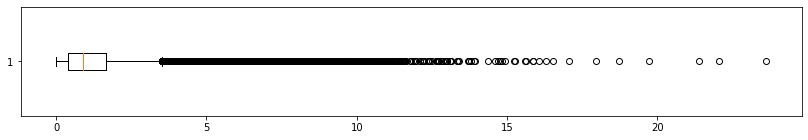

In [104]:
# abs difference
difference = abs((expected - predicted))
print('Mean Absolute Error = ', np.mean(difference))


# show boxplot
plt.figure(figsize = (14,2))
plt.boxplot(difference, vert= False);
plt.show()

In [105]:
MAPE = np.mean(abs(100 * (difference/expected)))
MAPE

4.29348146641253